## This note book is for map-making and inpainting for each single block (combining antennas)

The wcs of the map, the good/bad block list, and the input data/output path should be set manually before running the notebook

In [1]:
import os
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
import matplotlib
from datetime import datetime
import time
import pickle
import museek.util.tools as tl
import astropy.coordinates as ac
from astropy import units as u
import astropy
from astropy.coordinates import SkyCoord
from astropy.wcs.utils import skycoord_to_pixel
import pysm3
import healpy as hp
import gc
import random
import warnings
from museek.enums.result_enum import ResultEnum
from scipy import interpolate
from museek.rfi_mitigation.aoflagger_1d import gaussian_filter_1d
from scipy.ndimage import median_filter
import scipy
from numpy.polynomial.legendre import Legendre
from museek.util.tools import moving_median_masked, gaussian_filter_masked, interpolate_1d_masked_array


plt.style.use('classic')
plt.subplots_adjust(bottom=0.15,top=0.95,left=0.15,right=0.95)

from matplotlib import rcParams
params={'font.family':'DejaVu Serif',
        'font.serif':'Times New Roman',
        'font.style':'normal',
        'font.weight':'normal',
        }
rcParams.update(params)

plt.rcParams['xtick.major.pad']='3'
plt.rcParams['ytick.major.pad']='2'
plt.rcParams['xtick.labelsize']=15
plt.rcParams['ytick.labelsize']=15
plt.rcParams['figure.facecolor']='white'
plt.rcParams['axes.facecolor']='white'


def project_2d(x, y, data, shape, weights=None):
    """Project x,y, data TOIs on a 2D grid.

    Parameters
    ----------
    x, y : array_like
        input pixel indexes, 0 indexed convention
    data : array_like
        input data to project
    shape : int or tuple of int
        the shape of the output projected map
    weights : array_like
        weights to be use to sum the data (by default, ones)

    Returns
    -------
    data, weight, hits : ndarray
        the projected data set and corresponding weights and hits

    Notes
    -----
    The pixel index must follow the 0 indexed convention, i.e. use `origin=0` in `*_worl2pix` methods from `~astropy.wcs.WCS`.

    >>> data, weight, hits = project([0], [0], [1], 2)
    >>> data
    array([[ 1., nan],
    
           [nan, nan]])
    >>> weight
    array([[1., 0.],
           [0., 0.]])
    >>> hits
    array([[1, 0],
           [0, 0]]))

    >>> data, _, _ = project([-0.4], [0], [1], 2)
    >>> data
    array([[ 1., nan],
           [nan, nan]])

    There is no test for out of shape data

    >>> data, _, _ = project([-0.6, 1.6], [0, 0], [1, 1], 2)
    >>> data
    array([[nan, nan],
           [nan, nan]])

    Weighted means are also possible :
    
    >>> data, weight, hits = project([-0.4, 0.4], [0, 0], [0.5, 2], 2, weights=[2, 1])
    >>> data
    array([[ 1., nan],
           [nan, nan]))
    >>> weight
    array([[3., 0.],
           [0., 0.]])
    >>> hits
    array([[2, 0],
           [0, 0]])
    """
    if isinstance(shape, (int, np.integer)):
        shape = (shape, shape)

    assert len(shape) == 2, "shape must be a int or have a length of 2"

    if not isinstance(data, np.ndarray):
        data = np.asarray(data)

    if weights is None:
        weights = np.ones(data.shape)

    if isinstance(data, np.ma.MaskedArray):
        # Put weights as 0 for masked data
        hit_weights = ~data.mask
        weights = weights * hit_weights
    else:
        hit_weights = np.ones_like(data, dtype=bool)

    kwargs = {"bins": shape, "range": tuple((-0.5, size - 0.5) for size in shape)}

    _hits, xedges, yedges = np.histogram2d(y, x, weights=hit_weights, **kwargs)
    _weights = np.histogram2d(y, x, weights=weights, **kwargs)[0]
    _data = np.histogram2d(y, x, weights=weights * data, **kwargs)[0]

    #with warnings.catch_warnings():
    #    warnings.simplefilter("ignore")
    #    output = _data / _weights

    return _data, _weights, _hits.astype(int), xedges, yedges

def polynomial_flag_outlier(x, y, mask, degree, threshold):
    """
    fitting a powerlaw to the input data and mask outliers which deviate the powerlaw larger than `threshold' times median absolute deviation

    Parameters:
    x: x-coordinates of the sample points [array]
    y: y-coordinates of the sample points [array]
    mask: mask for the sample points [bool]
    degree: Degree of the fitting polynomial [int]
    threshold: threshold of the masking [float]

    Returns:
    bool array: updated mask
    1darray: fitting polynomial coefficients
    """

    initial_mask = mask.copy()
    #struct = np.ones(self.struct_size[1], dtype=bool)
    ########  mask the whole data if the flagged fraction is larger than 0.5
    if np.mean(mask>0) > 0.5:
        initial_mask[:] = True
        p_fit = None
    else:
       fit_x = x[~mask]
       fit_y = y[~mask]

       # Fit a polynomial
       p_fit = np.polyfit(fit_x, fit_y, degree)
       y_fit = np.polyval(p_fit, fit_x)

       # Calculate residuals
       residuals = fit_y - y_fit
       mad_residuals = scipy.stats.median_abs_deviation(residuals)

       # Identify outliers
       initial_mask[~mask] |= np.abs(residuals) >= threshold * mad_residuals

       #to_dilate = initial_mask ^ mask
       #dilated = ndimage.binary_dilation(to_dilate, structure=struct, iterations=1)
       #initial_mask = initial_mask + dilated

    return initial_mask, p_fit

# Function to find continuous "masked" sub-regions
def find_continuous_mask_regions(mask):
    regions = []
    current_region = []

    for i, val in enumerate(mask):
        if val == 1:
            current_region.append(i)
        else:
            if current_region:
                regions.append(current_region)
                current_region = []
    # Append the last region if still present
    if current_region:
        regions.append(current_region)
        
    return regions


def collect_unmasked_points_around(mask, freq, i_start, i_end, inpainting_window):
    """
    Collect unmasked points extending outward on both sides of a masked region,
    counting only unmasked points until roughly ±inpainting_window worth of channels are included.

    Parameters
    ----------
    mask : 1D bool array
        True where data are masked.
    freq : 1D array
        Frequency axis (MHz).
    i_start, i_end : int
        Start and end indices of the masked region.
    inpainting_window : float
        Approximate window size (in MHz). Converted to ~number of channels.

    Returns
    -------
    collected : 1D bool array
        Boolean mask of unmasked points selected for polynomial fitting.
    """
    n = len(freq)
    collected = np.zeros(n, dtype=bool)

    # Approximate how many channels correspond to ±inpainting_window
    channel_width = np.mean(np.abs(np.diff(freq)))
    allchannels = int(np.round(inpainting_window / channel_width))

    # ---- Left side ----
    left_i = i_start - 1
    left_channel_count = 0
    while left_i >= 0 and left_channel_count < allchannels:
        if not mask[left_i]:
            collected[left_i] = True
            left_channel_count += 1
        left_i -= 1

    # ---- Right side ----
    right_i = i_end + 1
    right_channel_count = 0
    while right_i < n and right_channel_count < allchannels:
        if not mask[right_i]:
            collected[right_i] = True
            right_channel_count += 1
        right_i += 1

    return collected

                
def fill_masked_regions_polyfit(freq, masked_array, inpainting_window=15.0, inpainting_polydeg=5):
    """
    Fill masked regions by polynomial fitting using ±inpainting_window of *unmasked points only*.
    """
    data = masked_array.data.copy()
    mask = masked_array.mask
    regions = find_continuous_mask_regions(mask)

    for region in regions:
        i_start, i_end = region[0], region[-1]
        valid = collect_unmasked_points_around(mask, freq, i_start, i_end, inpainting_window)

        # Limit polynomial degree if not enough data
        n_valid = np.sum(valid)
        deg = min(inpainting_polydeg, n_valid - 1)
        # handle the situations where valid points are too few
        if np.sum(valid[:region[0]]) <= 5 or np.sum(valid[region[-1]:])<=5:
            # if the masked regions are too long (>30channels), using linear polyfit (deg=1)
            threshold_length = 30
            if len(region) >= threshold_length:
                deg = min(1, n_valid - 1)
            else:
                deg = min(3, n_valid - 1)

        with warnings.catch_warnings():
            warnings.simplefilter('ignore', np.RankWarning)
            coeff = np.polyfit(freq[valid], data[valid], deg=deg)
        poly = np.poly1d(coeff)

        data[i_start:i_end + 1] = poly(freq[i_start:i_end + 1])

    return data

<Figure size 640x480 with 0 Axes>

In [2]:
#############     Below is the module for inpainting and map-making      ################

In [3]:
####  parameters initialization
BOX = 'BOX3'
input_path = '/idia/projects/meerklass/MEERKLASS-1/uhf_data/OT2024/pipeline/Pipeline_PS_AOFlagger_test/'+BOX+'/'
output_path = '/idia/users/wkhu/calibration_results/'+BOX+'/maps/'
data_name = 'aoflagger_plugin_postcalibration.pickle'
block_name = '1710186924'
map_version = '_inpainting'  ### the version (selfcali or not) of the map, 
                             ### if running notebook for selfcali data, use map_version = '_selfcali_inpainting'
#map_version = '_selfcali_inpainting' 

threshold_MHz = 30.  #[MHz] if a long continuous frequency region is masked, this timestamp will be totally masked 
inpainting_window=20 #[MHz] inpainting the masked regions by fitting a polynomial using +-inpainting_window 
                     #      of the unmasked data around the masked regions
inpainting_polydeg=6 # the degree of polynomials fit in inpainting

mask_antnum_threshold=10 #  masking the pixels where <=mask_antnum_threshold antennas contributes

pix_reso = 0.5   # map resolution [deg]
x_crval = 190.   # map center x(ra) [deg]
y_crval = -1.5   # map center y(dec) [deg]
x_min = x_crval-30.  # map region x(ra)
x_max = x_crval+30.  # map region x(ra)
y_min = y_crval-10.  # map region y(dec)
y_max = y_crval+10.  # map region y(dec)


In [4]:
# define the wcs for map

from astropy.wcs import WCS

# Create a new WCS object with two dimensions
wcs = WCS(naxis=2)

crpix_x=int((x_max-x_min)/pix_reso/2.)
crpix_y=int((y_max-y_min)/pix_reso/2.)

# Assuming the RA ad Dec axis are the first and second axis respectively
# Define the reference pixel (center of the array or some other reference)
wcs.wcs.crpix = [crpix_x, crpix_y]  # Middle of the array
wcs.wcs.cdelt = np.array([pix_reso, pix_reso])  # degrees/pixel for RA and Dec
wcs.wcs.crval = [(x_max+x_min)/2., (y_max+y_min)/2.] 
wcs.wcs.ctype = ["RA---ZEA", "DEC--ZEA"]  # Use ZEA projection for RA and Dec

# Optionally set unit types
wcs.wcs.cunit = ['deg', 'deg']

# Display the WCS header to check
print('wcs', wcs)

# set the shape of map 
map_shape = (np.round((x_max-x_min)/pix_reso).astype(int) + 1, np.round((y_max-y_min)/pix_reso).astype(int) + 1)

# Assume image_shape = [ra_length, dec_length]
ra_len, dec_len = map_shape[0], map_shape[1]
# Create a pixel grid (Y for Dec, X for RA)
y, x = np.mgrid[0:dec_len, 0:ra_len]
# Convert pixel coordinates to world coordinates
ra_map, dec_map = wcs.wcs_pix2world(x, y, 0)

wcs WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---ZEA' 'DEC--ZEA' 
CRVAL : 190.0 -1.5 
CRPIX : 60.0 20.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 0.5 0.5 
NAXIS : 0  0


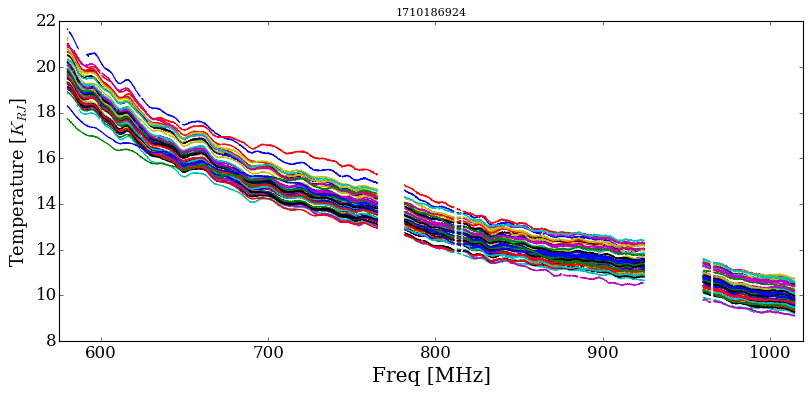

/tmp/ipykernel_1486664/4190486791.py:168: RuntimeWarning: invalid value encountered in divide
  map_making_data_antenna = map_making_data_antenna / weight_data_antenna
/tmp/ipykernel_1486664/4190486791.py:168: RuntimeWarning: invalid value encountered in divide
  map_making_data_antenna = map_making_data_antenna / weight_data_antenna
/tmp/ipykernel_1486664/4190486791.py:168: RuntimeWarning: invalid value encountered in divide
  map_making_data_antenna = map_making_data_antenna / weight_data_antenna
/tmp/ipykernel_1486664/4190486791.py:168: RuntimeWarning: invalid value encountered in divide
  map_making_data_antenna = map_making_data_antenna / weight_data_antenna
/tmp/ipykernel_1486664/4190486791.py:168: RuntimeWarning: invalid value encountered in divide
  map_making_data_antenna = map_making_data_antenna / weight_data_antenna
/tmp/ipykernel_1486664/4190486791.py:168: RuntimeWarning: invalid value encountered in divide
  map_making_data_antenna = map_making_data_antenna / weight_data_

<Figure size 640x480 with 0 Axes>

In [5]:
# loading calibrated data, removing time average, inpainting using polynomials, and finally making maps

        
path1 = os.path.join(input_path, block_name, block_name, data_name)
path2 = os.path.join(input_path, block_name, data_name)
if os.path.exists(path1):
    full_path = path1
else:
    full_path = path2
with open(full_path, 'rb') as file:
    data_read = pickle.load(file)

#data_read.keys()
calibrated_vis = data_read.get(ResultEnum.CALIBRATED_VIS).result / 10**6.   #### convert from uK to K
freq = data_read.get(ResultEnum.FREQ_SELECT).result / 10**6.   #### convert from Hz to MHz
scan_data = data_read.get(ResultEnum.SCAN_DATA).result

del data_read
gc.collect()

timestamps = scan_data.timestamps.array.squeeze()
ra = scan_data.right_ascension.array.squeeze()
dec = scan_data.declination.array.squeeze()

receiver_list = [str(receiver) for i_receiver, receiver in enumerate(scan_data.receivers)]
antenna_list = scan_data._antenna_name_list
receivers = scan_data.receivers
antennas = scan_data.antennas

del scan_data
gc.collect()

####   plot the time average to check the data  ####
calibrated_vis_timemedian = np.ma.median(calibrated_vis, axis=0)
fig = plt.figure(figsize=(12, 5)) 
ax = fig.add_subplot(1, 1, 1)
for i_antenna in range(calibrated_vis_timemedian.shape[-1]):
    ax.plot(freq, calibrated_vis_timemedian[:,i_antenna])
ax.set_ylabel(r'Temperature [$K_{RJ}$]', fontsize=16)
ax.set_xlabel('Freq [MHz]', fontsize=18)
ax.set_title(block_name, fontsize='10')
ax.set_xlim(freq.min()-5, freq.max()+5)
plt.show()
plt.clf()    

##########   mask known RFI  ###########
# List of frequency intervals to mask
mask_intervals = [(765.0, 775.0),(801.0, 821.0),(925.0, 960.0)]
# Start with all False (unmasked)
mask_freq = np.zeros_like(freq, dtype=bool)
# Set mask to True within each interval
for low, high in mask_intervals:
    mask_freq |= (freq > low) & (freq < high)

##### if a long continuous frequency region is masked, this timestamp will be totally masked, 
##### because it is hard to do the inpainting    ######
for i_ant, ant in enumerate(antenna_list):
    for i_time in np.arange(calibrated_vis.shape[0]):
        mask_check = calibrated_vis.mask[i_time,:,i_ant].copy()
        mask_check[mask_freq] = False
        # find continuous masked regions
        continuous_mask_regions = find_continuous_mask_regions(mask_check)
        # Frequency resolution (assuming evenly spaced)
        freq_resolution = np.abs(np.diff(freq).mean())
        # Threshold for what counts as a "long" masked region (e.g., 30 MHz)
        threshold_length = threshold_MHz / freq_resolution
        # Check if any continuous region exceeds threshold
        if any(len(region) >= threshold_length for region in continuous_mask_regions):
            # Mask entire timestamp for this antenna
            calibrated_vis.mask[i_time, :, i_ant] = True

# removing the time average
calibrated_vis_timeaver = np.ma.mean(calibrated_vis, axis=0)
calibrated_vis_notimeaver = calibrated_vis - np.ma.mean(calibrated_vis, axis=0, keepdims=True)
del calibrated_vis
gc.collect()

# masking the antennas which are heavily masked (more than 60% is masked)
for i_ant, ant in enumerate(antenna_list):
    if np.mean(calibrated_vis_notimeaver[:,:,i_ant].mask)>=0.6:
        calibrated_vis_notimeaver[:,:,i_ant].mask = True

calibrated_vis_notimeaver_interp = np.ma.ones_like(calibrated_vis_notimeaver)

# Calculate the ABBA T[n] + T[n+1] - T[n-1] - T[n+2] for weight estimation
delta = (calibrated_vis_notimeaver[:,1:-2,:] +
         calibrated_vis_notimeaver[:,2:-1,:] - 
         calibrated_vis_notimeaver[:,:-3,:] -
         calibrated_vis_notimeaver[:,3:,:]) / 2.
weight_diff = 1. / np.ma.std(delta, axis=1)
weight_diff = weight_diff.filled(0)

# inpainting
delta_sigma = np.ma.std(delta, axis=1) / np.sqrt(2)

for i_ant, ant in enumerate(antenna_list):
    if calibrated_vis_notimeaver[:,:,i_ant].mask.all():
        pass
    else:
        # define the sigma of estimated noise for each antenna
        delta_sigma_ant = delta_sigma[:,i_ant]
        delta_sigma_ant = delta_sigma_ant.filled(np.ma.median(delta_sigma_ant))
        for i_time in np.arange(calibrated_vis_notimeaver.shape[0]):
            if calibrated_vis_notimeaver[i_time,:,i_ant].mask.all():
                pass
            else:
                mask = calibrated_vis_notimeaver[i_time,:,i_ant].mask 
                # inpainting the masked regions by fitting a polynomial using +-inpainting_window of the unmasked data around the masked regions
                calibrated_vis_notimeaver_interp.data[i_time,:,i_ant] = fill_masked_regions_polyfit(
                    freq, 
                    calibrated_vis_notimeaver[i_time,:,i_ant], 
                    inpainting_window=inpainting_window, 
                    inpainting_polydeg=inpainting_polydeg
                )
                calibrated_vis_notimeaver_interp.mask[i_time,:,i_ant] = np.zeros(len(freq),dtype='bool')
                n_mask = np.count_nonzero(mask)
                # filling the white noise onto the polynomial
                if n_mask > 0:
                    noise = np.random.normal(0.0, delta_sigma_ant[i_time], n_mask)
                    calibrated_vis_notimeaver_interp.data[i_time, mask, i_ant] += noise


# apply the known RFI masking 
calibrated_vis_notimeaver_interp.mask[:,mask_freq,:] = True
calibrated_vis_notimeaver.mask[:,mask_freq,:] = True

# in case there are some misfitting points, mask them
misfit = (calibrated_vis_notimeaver_interp>=(np.ma.max(calibrated_vis_notimeaver)+0.5)) + (calibrated_vis_notimeaver_interp<=(np.ma.min(calibrated_vis_notimeaver)-0.5))
for i_ant, ant in enumerate(antenna_list):
    misfit_time = np.sum(misfit[:,:,i_ant], axis=1) > 0
    calibrated_vis_notimeaver_interp.mask[misfit_time,:,i_ant] = True
    calibrated_vis_notimeaver.mask[misfit_time,:,i_ant] = True
    
##################  project the data into maps #####################
allmap_antennalist = []
hit_data = np.zeros((map_shape[0], map_shape[1], len(freq)))
hit_data_nomask = np.zeros((map_shape[0], map_shape[1], len(freq)))
for i_ant, ant in enumerate(antenna_list):

    map_making_data_antenna = np.zeros((map_shape[0], map_shape[1], len(freq)))
    weight_data_antenna = np.zeros((map_shape[0], map_shape[1], len(freq)))

    sky_sc=ac.SkyCoord(ra=ra[:,i_ant].flatten() * u.deg, dec=dec[:,i_ant].flatten() * u.deg) #pointings in observation
    pix_coords=skycoord_to_pixel(sky_sc, wcs)
    for i_freq, freq_value in enumerate(freq):
        
        data = calibrated_vis_notimeaver_interp[:,i_freq,i_ant]
        output, weight, hit_nomask, xedges, yedges = project_2d(
            pix_coords[1], 
            pix_coords[0], 
            data.flatten(), 
            map_shape, 
            weights=weight_diff[:,i_ant].flatten()
        )
        _, _, hit, _, _ = project_2d(
            pix_coords[1],
            pix_coords[0],
            calibrated_vis_notimeaver[:,i_freq,i_ant].flatten(),
            map_shape,
            weights=weight_diff[:,i_ant].flatten()
        )

        hit_data[:,:,i_freq] += hit
        hit_data_nomask[:,:,i_freq] += hit_nomask
        map_making_data_antenna[:,:,i_freq] = output
        weight_data_antenna[:,:,i_freq] = weight    

    map_making_data_antenna = map_making_data_antenna / weight_data_antenna
    map_making_data_antenna = np.ma.masked_array(map_making_data_antenna, mask=~np.isfinite(map_making_data_antenna))
    allmap_antennalist.append(map_making_data_antenna)

    del map_making_data_antenna, weight_data_antenna
    gc.collect()
    

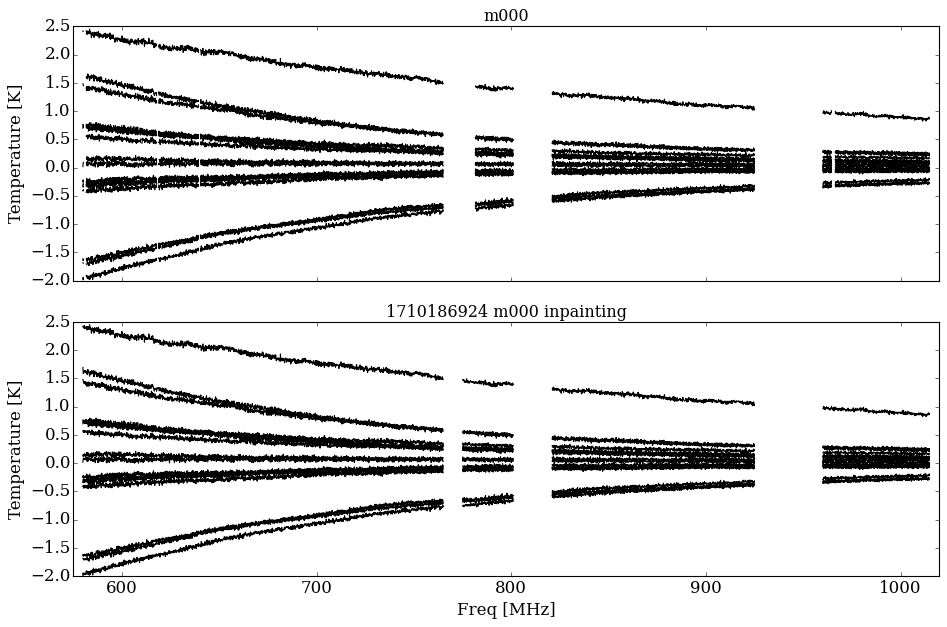

<Figure size 640x480 with 0 Axes>

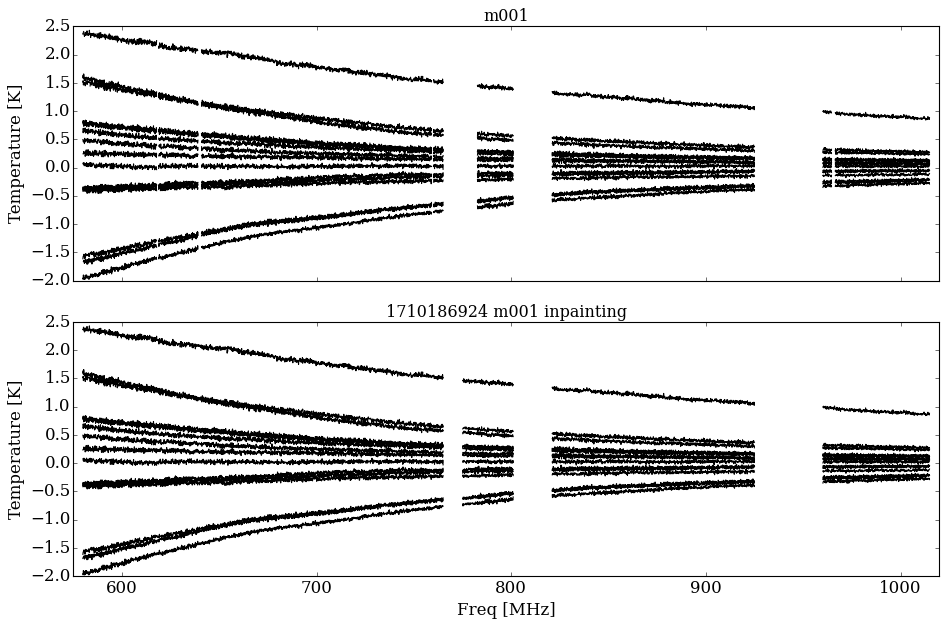

<Figure size 640x480 with 0 Axes>

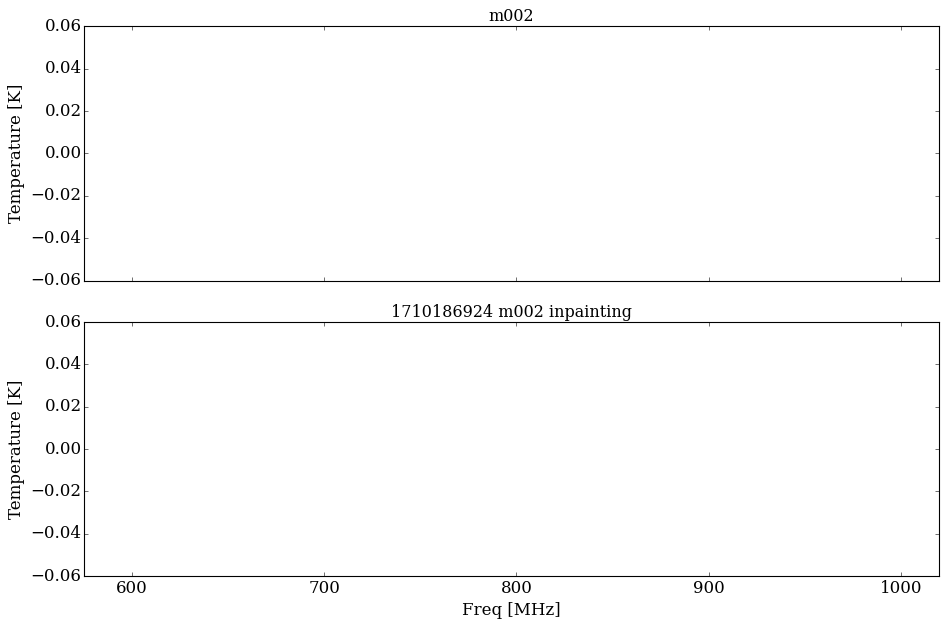

<Figure size 640x480 with 0 Axes>

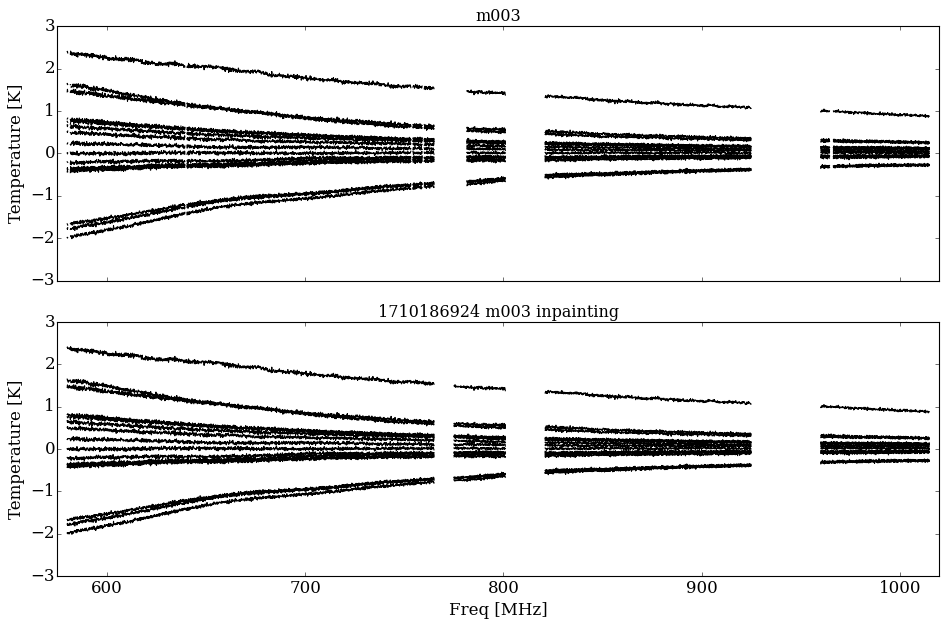

<Figure size 640x480 with 0 Axes>

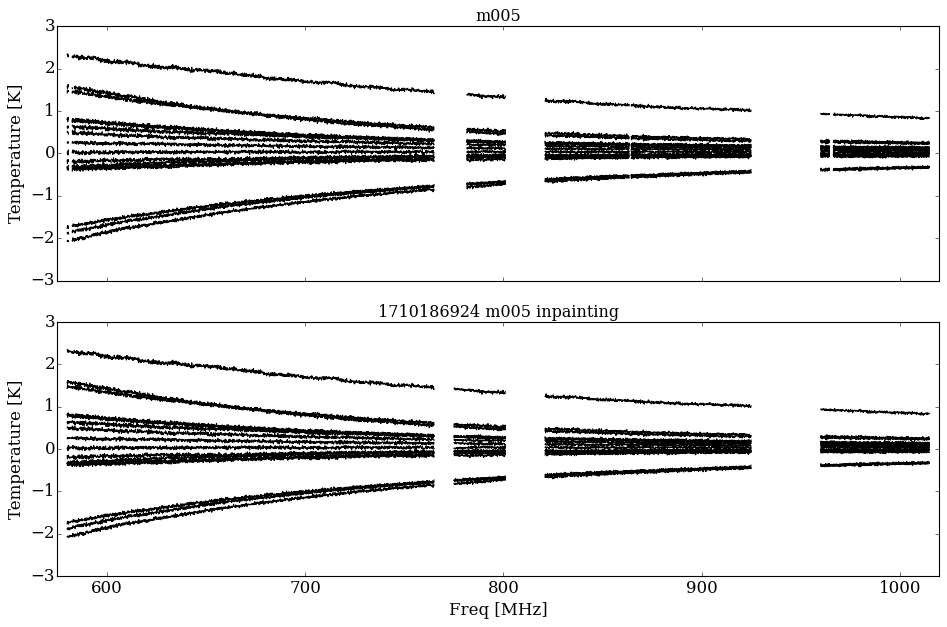

<Figure size 640x480 with 0 Axes>

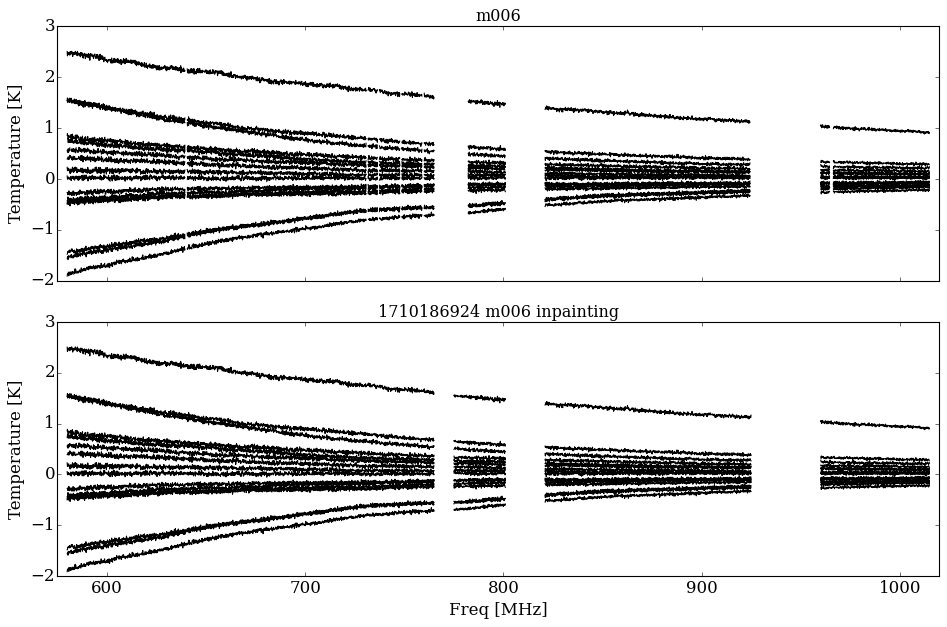

<Figure size 640x480 with 0 Axes>

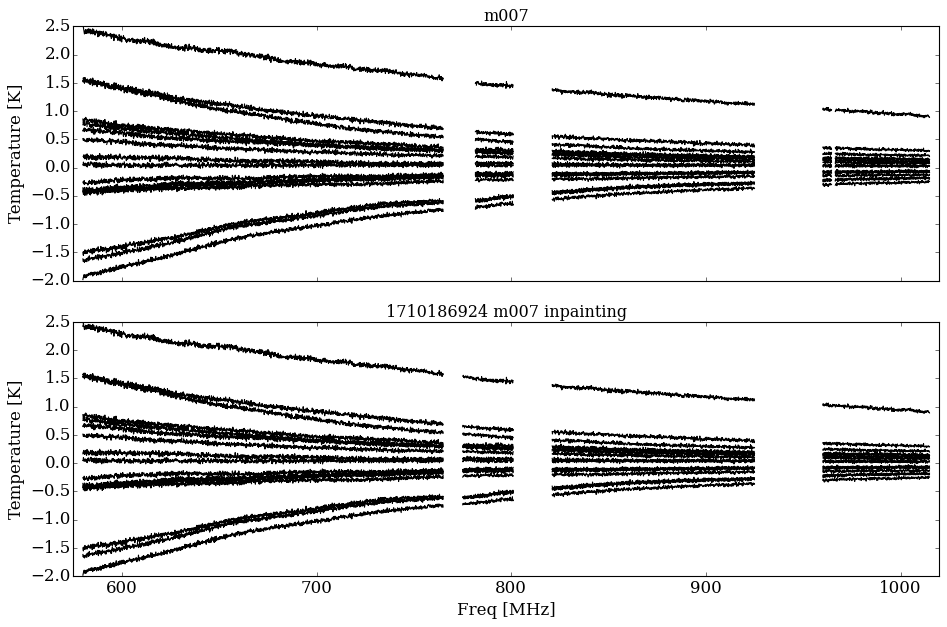

<Figure size 640x480 with 0 Axes>

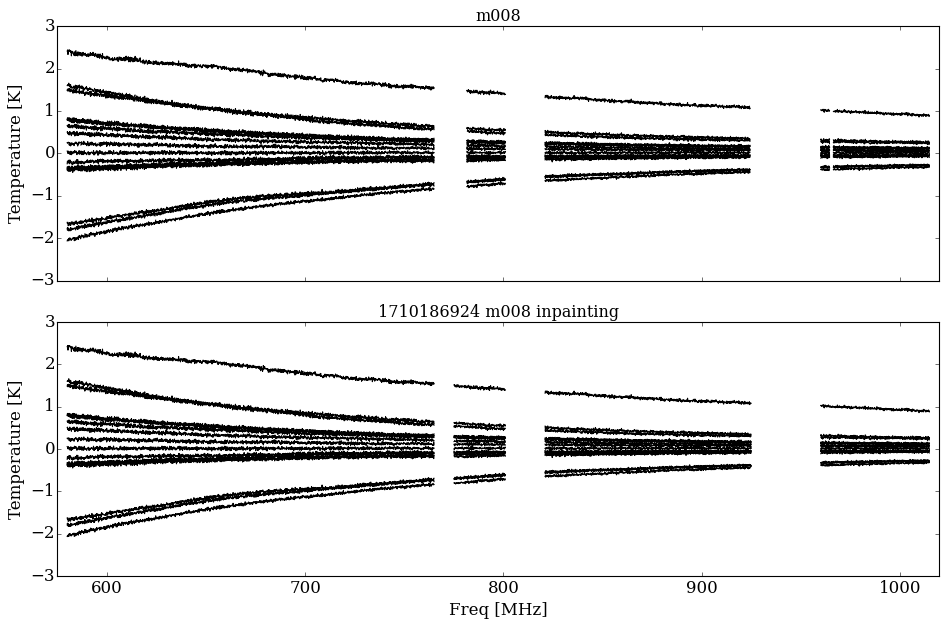

<Figure size 640x480 with 0 Axes>

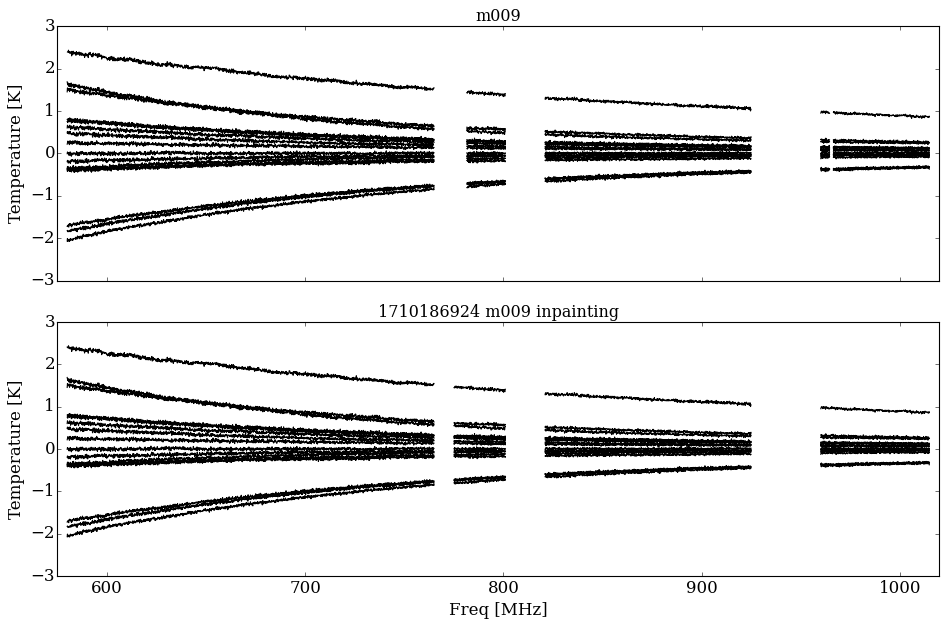

<Figure size 640x480 with 0 Axes>

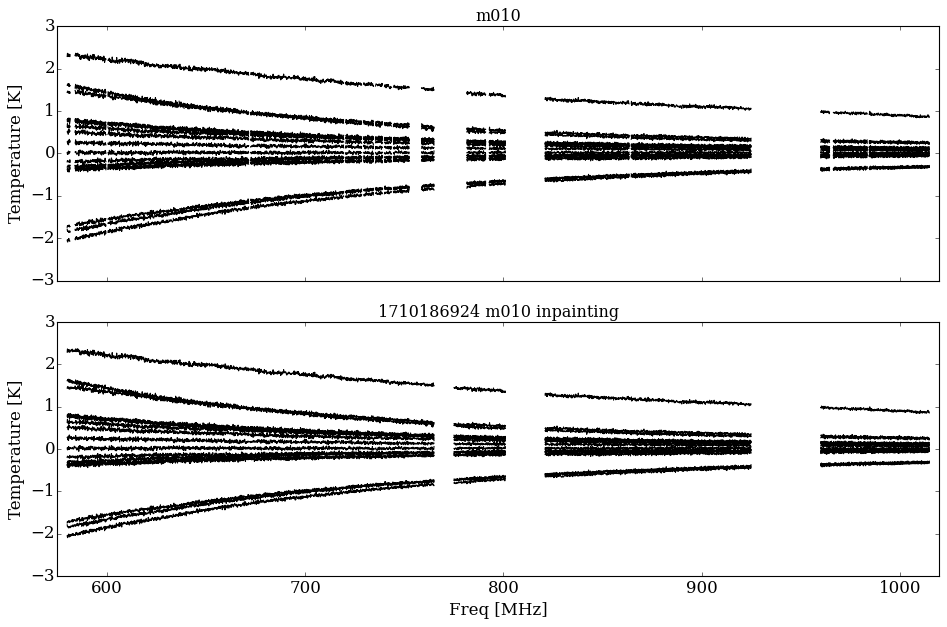

<Figure size 640x480 with 0 Axes>

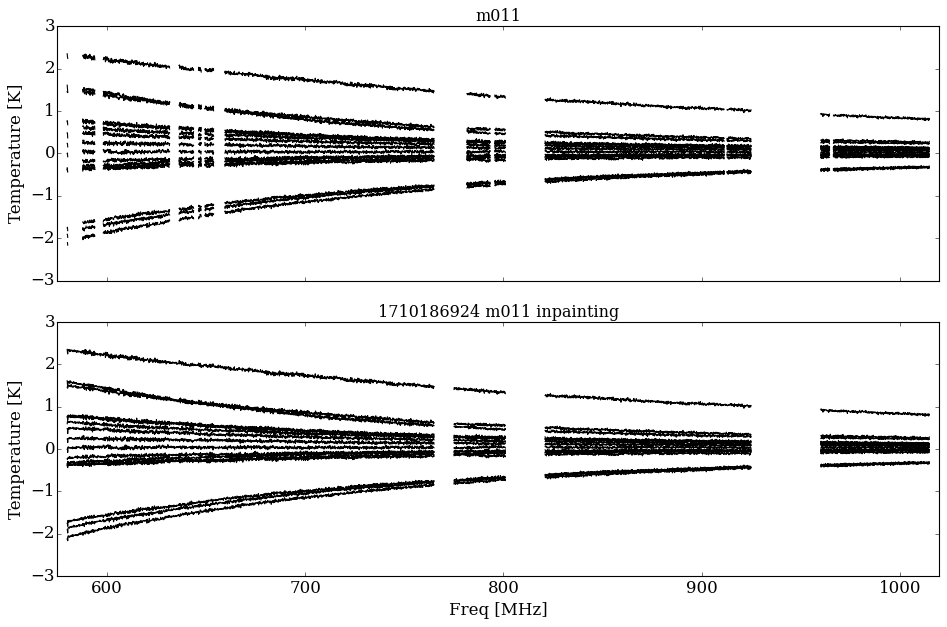

<Figure size 640x480 with 0 Axes>

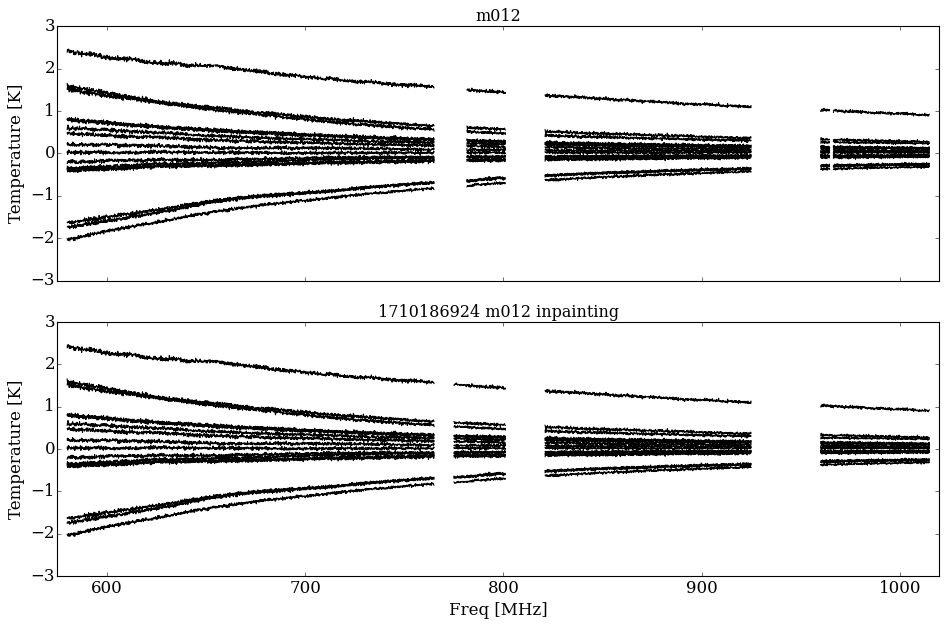

<Figure size 640x480 with 0 Axes>

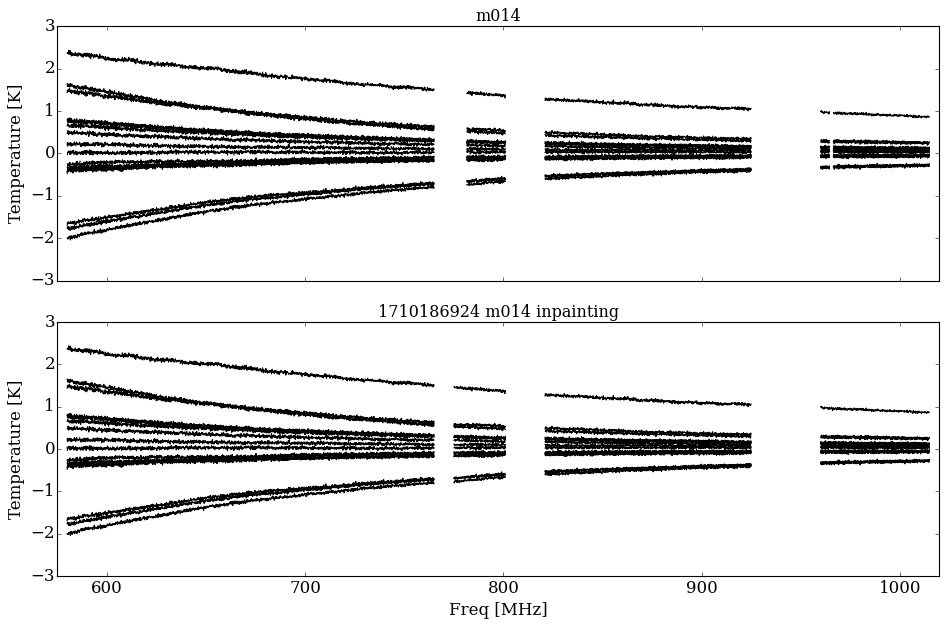

<Figure size 640x480 with 0 Axes>

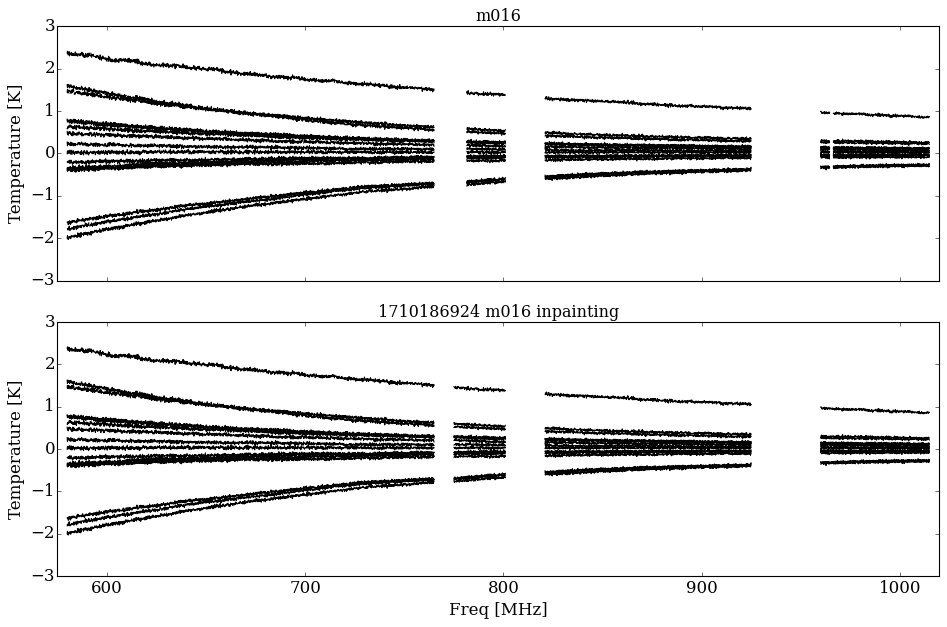

<Figure size 640x480 with 0 Axes>

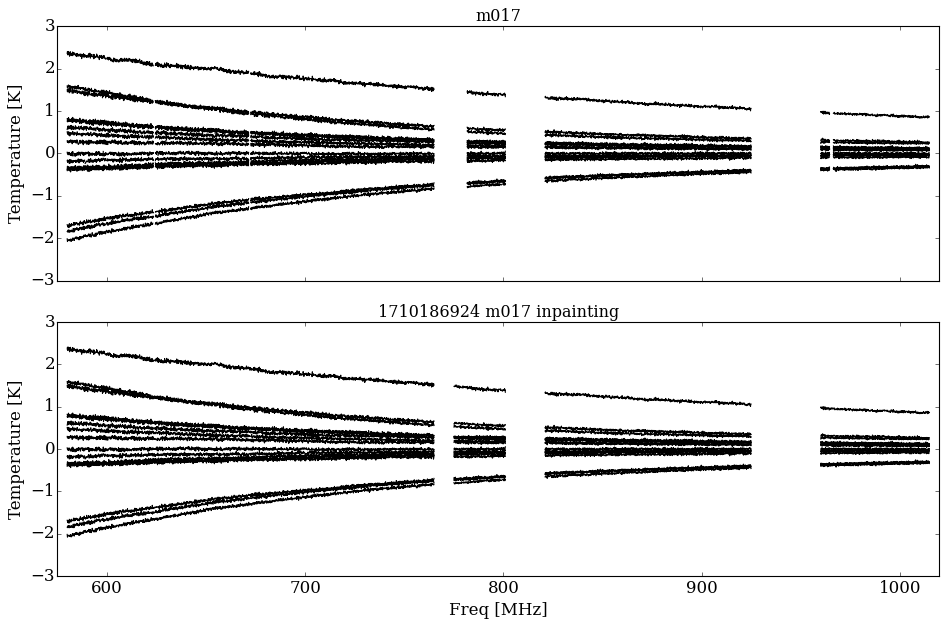

<Figure size 640x480 with 0 Axes>

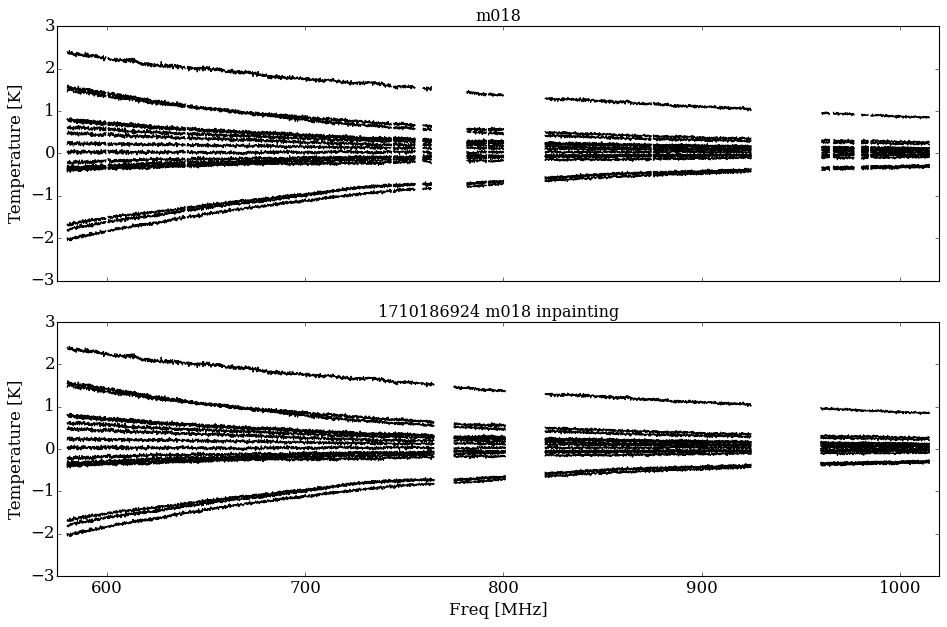

<Figure size 640x480 with 0 Axes>

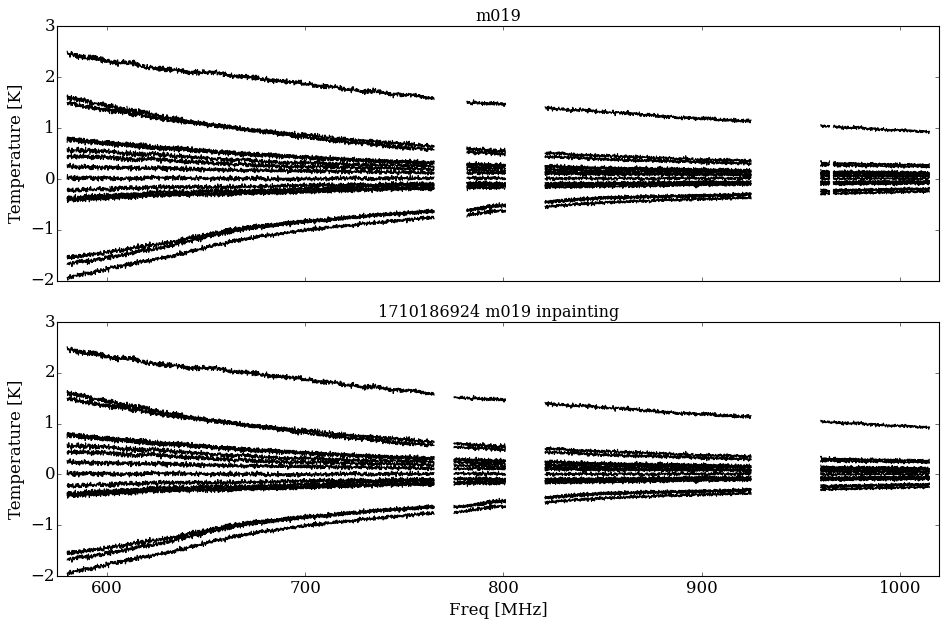

<Figure size 640x480 with 0 Axes>

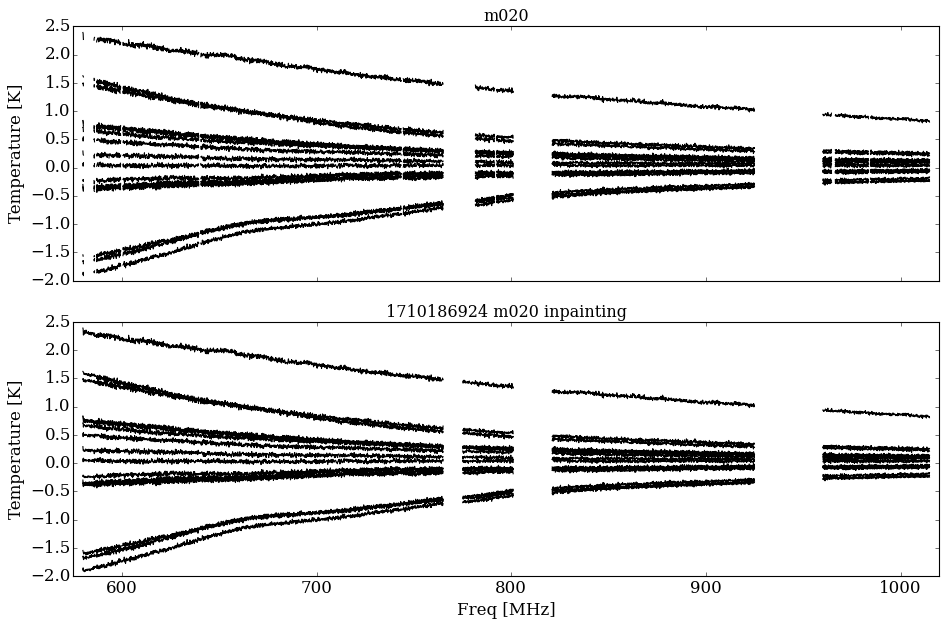

<Figure size 640x480 with 0 Axes>

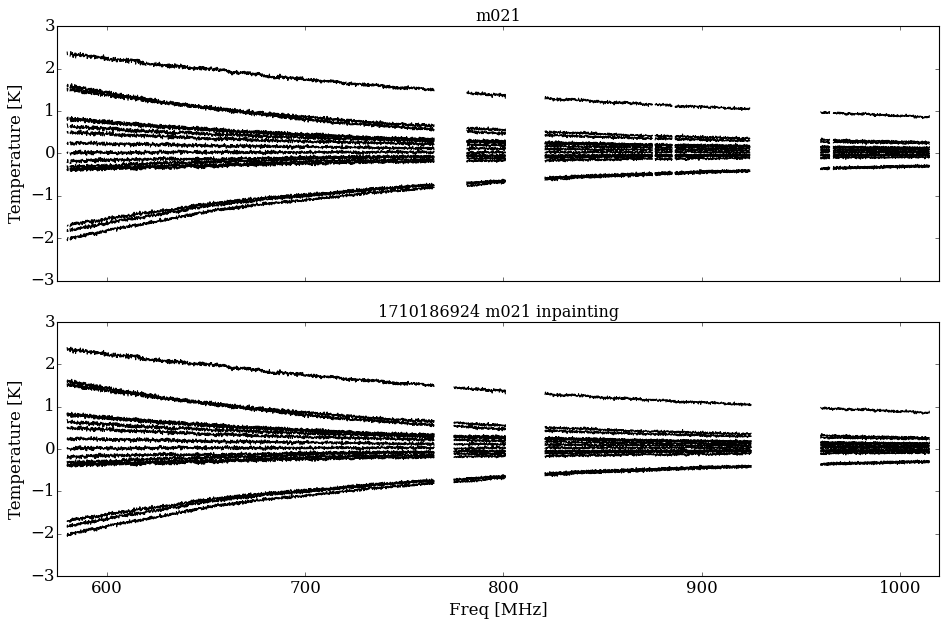

<Figure size 640x480 with 0 Axes>

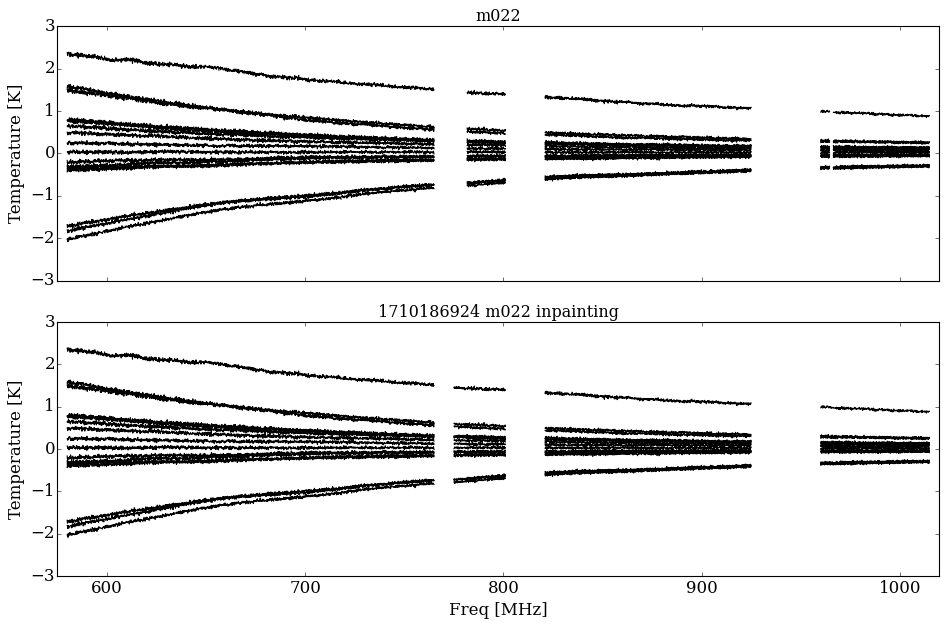

<Figure size 640x480 with 0 Axes>

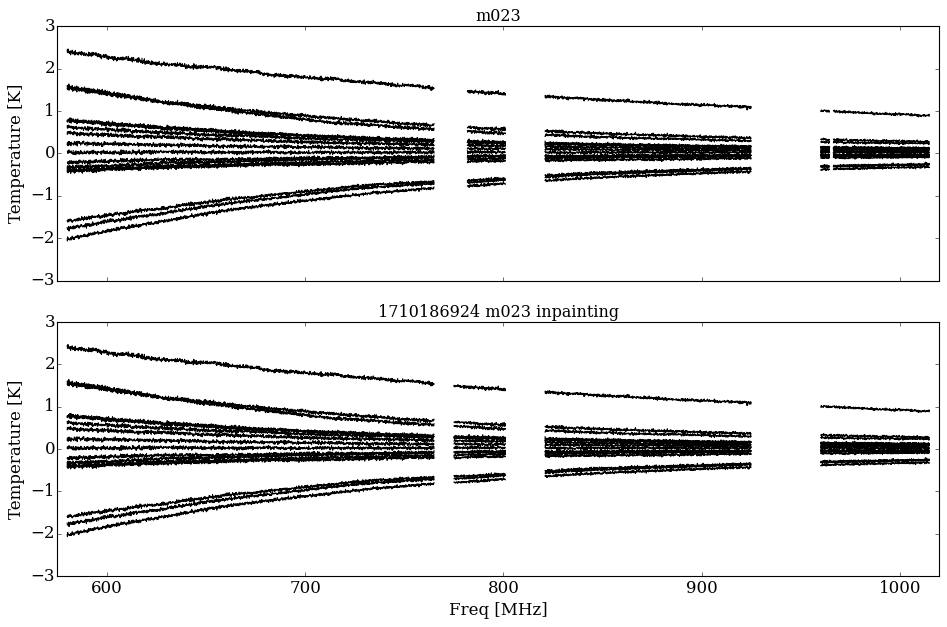

<Figure size 640x480 with 0 Axes>

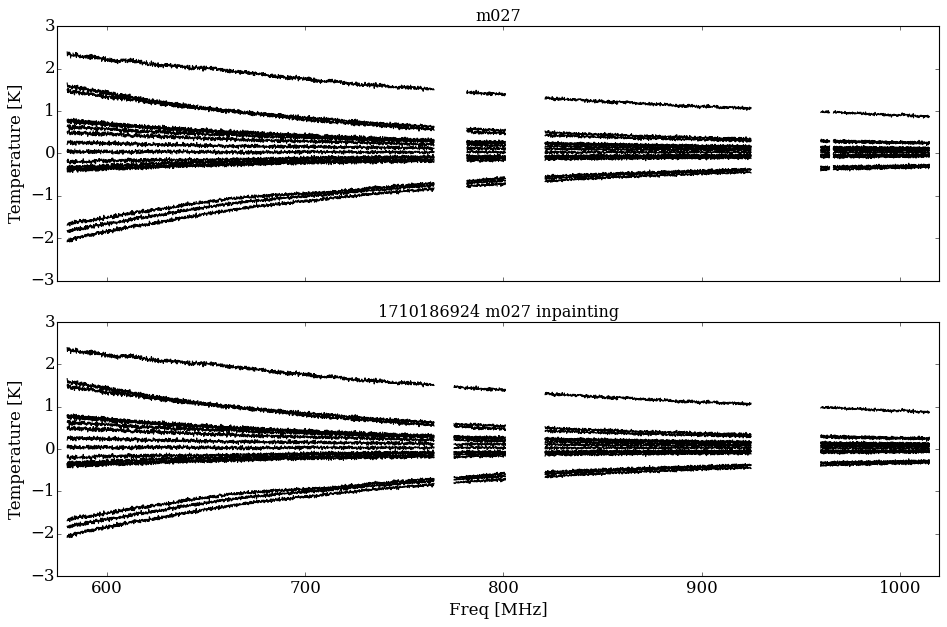

<Figure size 640x480 with 0 Axes>

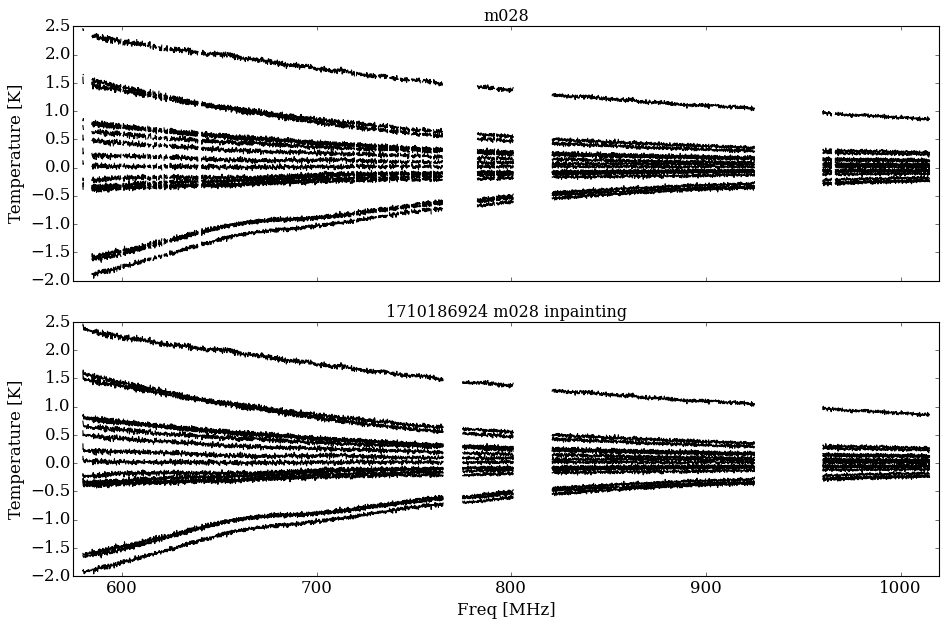

<Figure size 640x480 with 0 Axes>

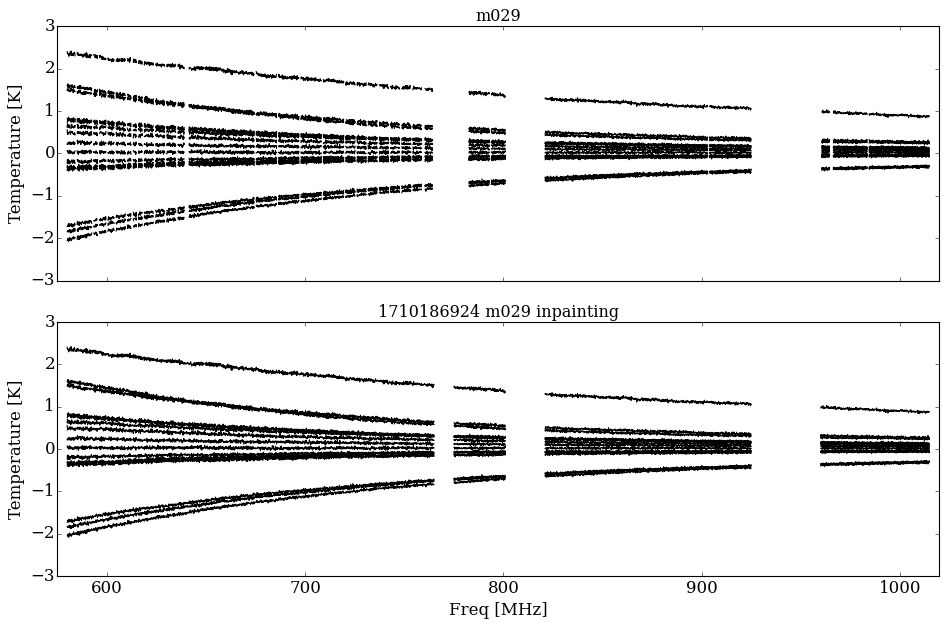

<Figure size 640x480 with 0 Axes>

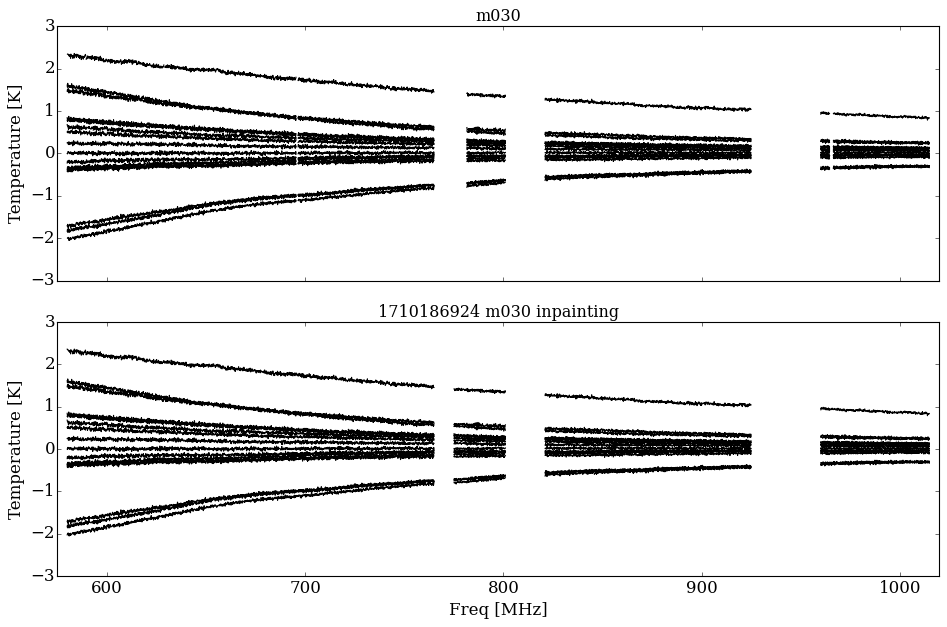

<Figure size 640x480 with 0 Axes>

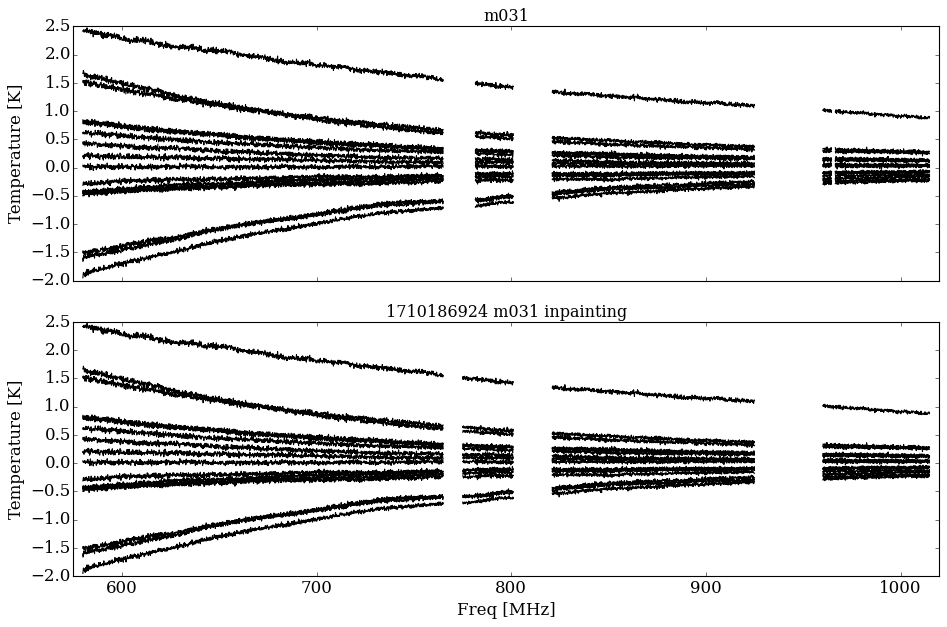

<Figure size 640x480 with 0 Axes>

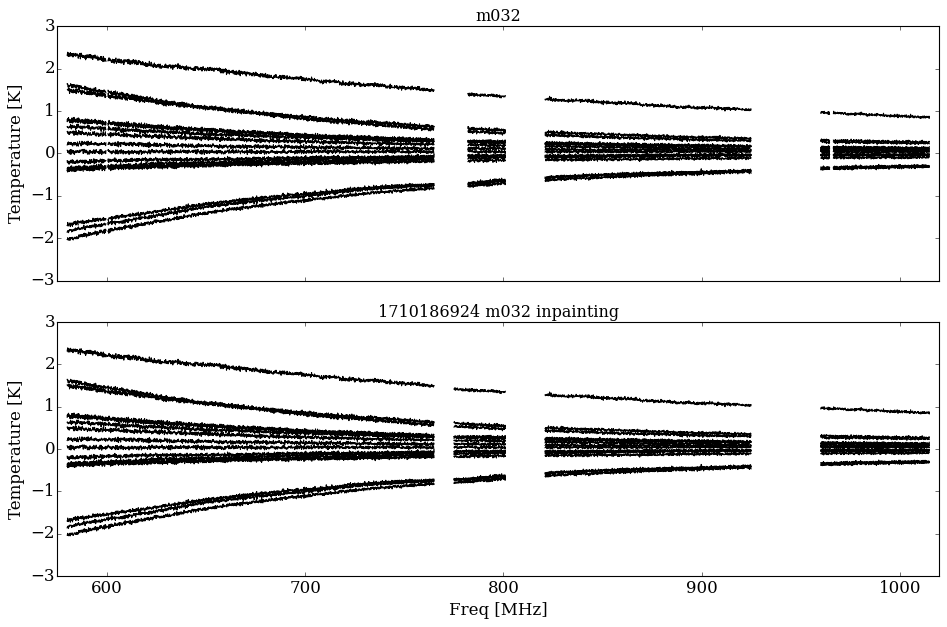

<Figure size 640x480 with 0 Axes>

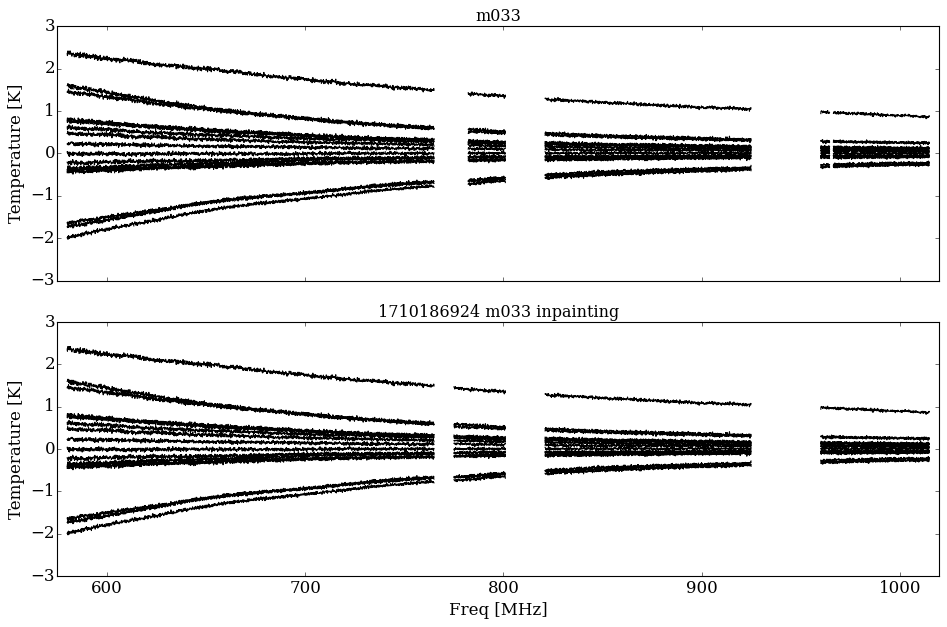

<Figure size 640x480 with 0 Axes>

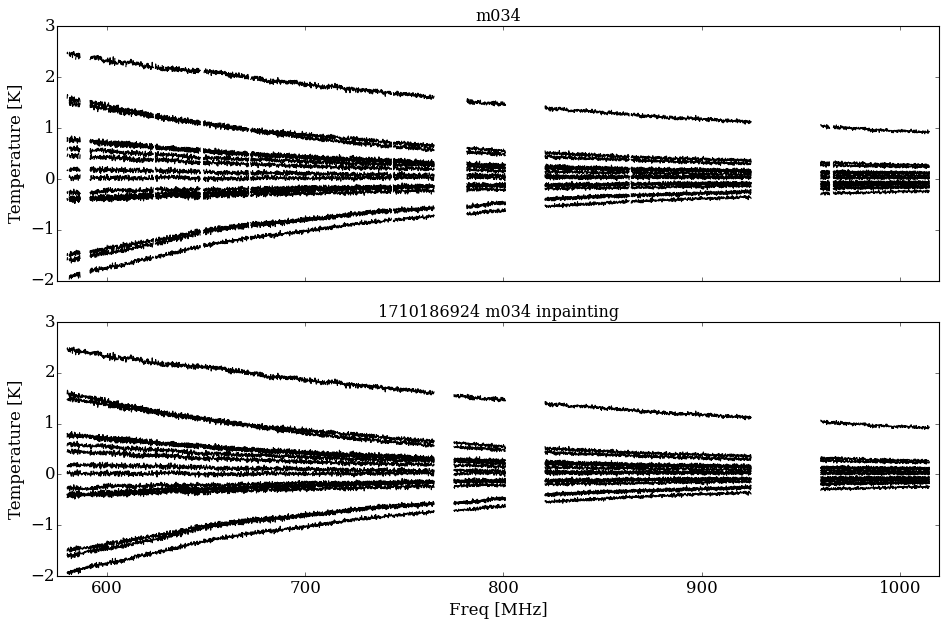

<Figure size 640x480 with 0 Axes>

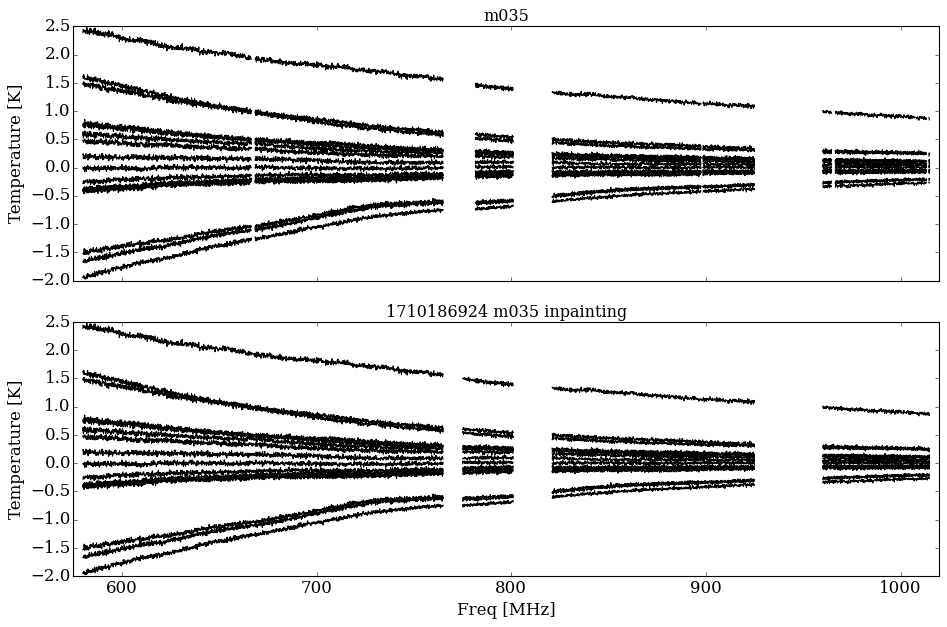

<Figure size 640x480 with 0 Axes>

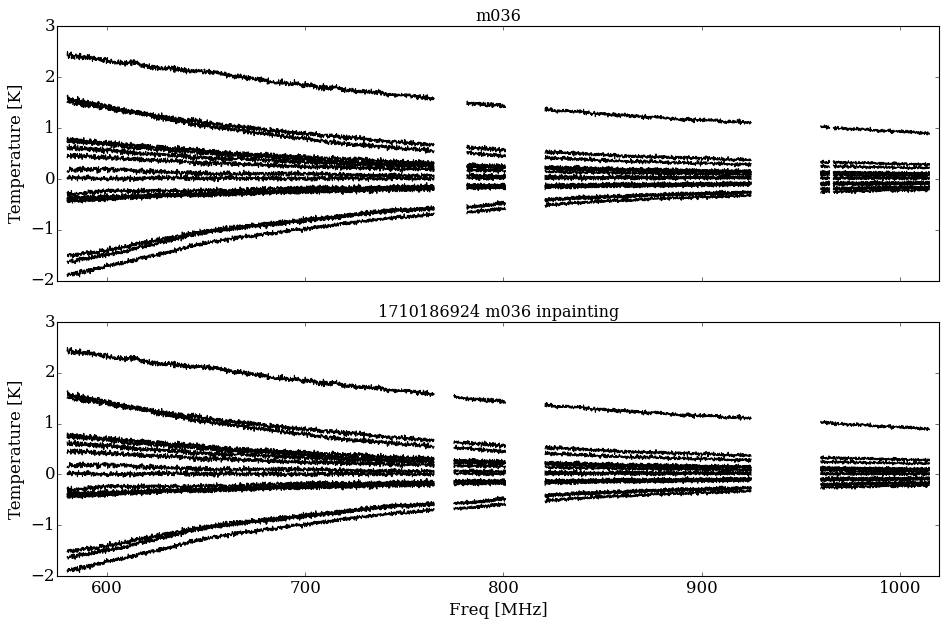

<Figure size 640x480 with 0 Axes>

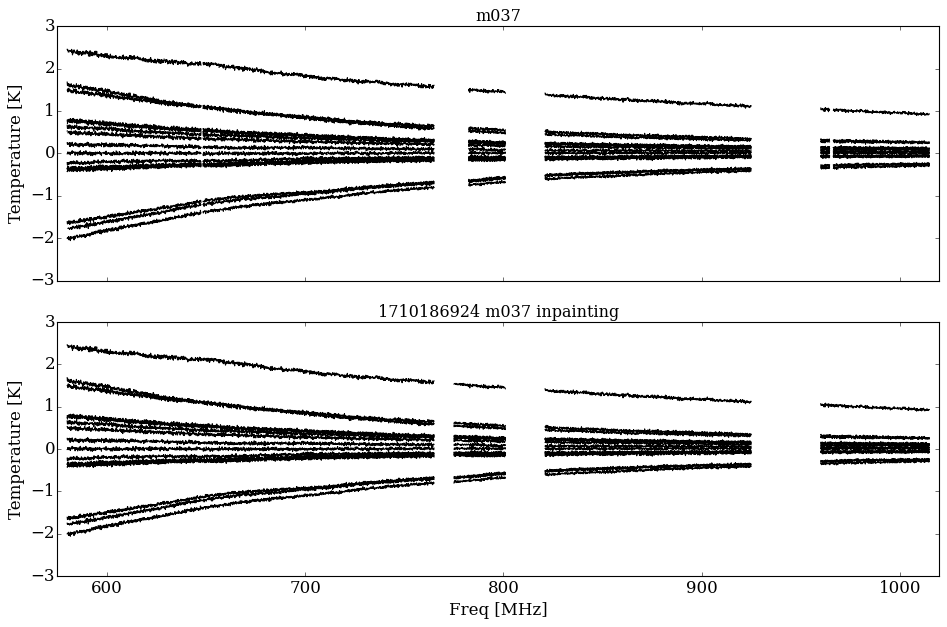

<Figure size 640x480 with 0 Axes>

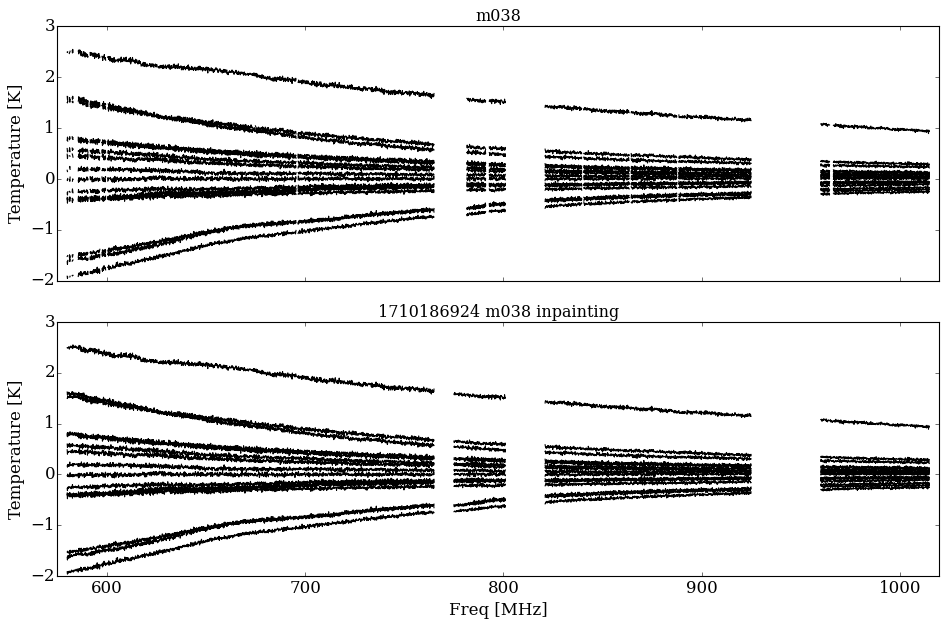

<Figure size 640x480 with 0 Axes>

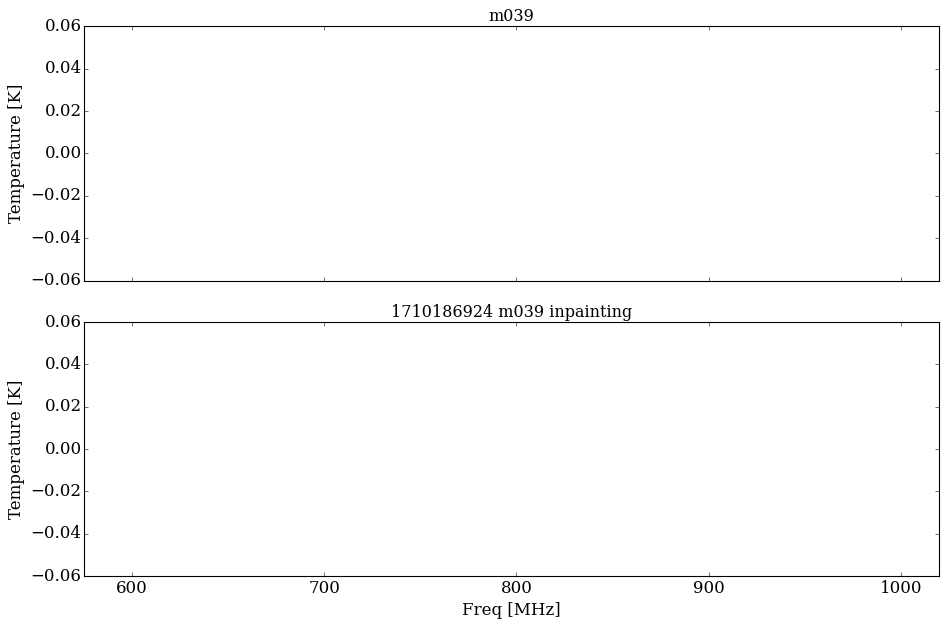

<Figure size 640x480 with 0 Axes>

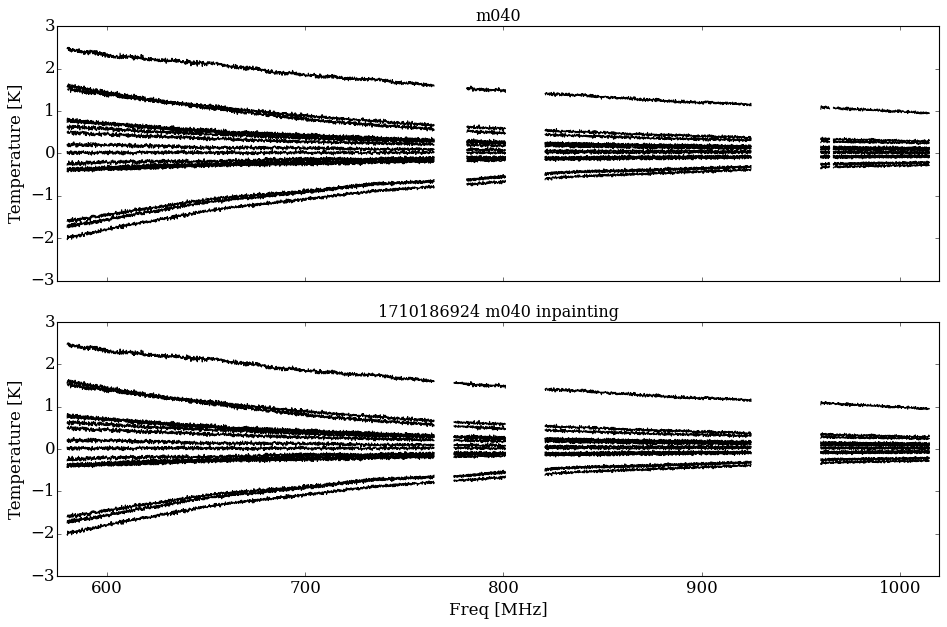

<Figure size 640x480 with 0 Axes>

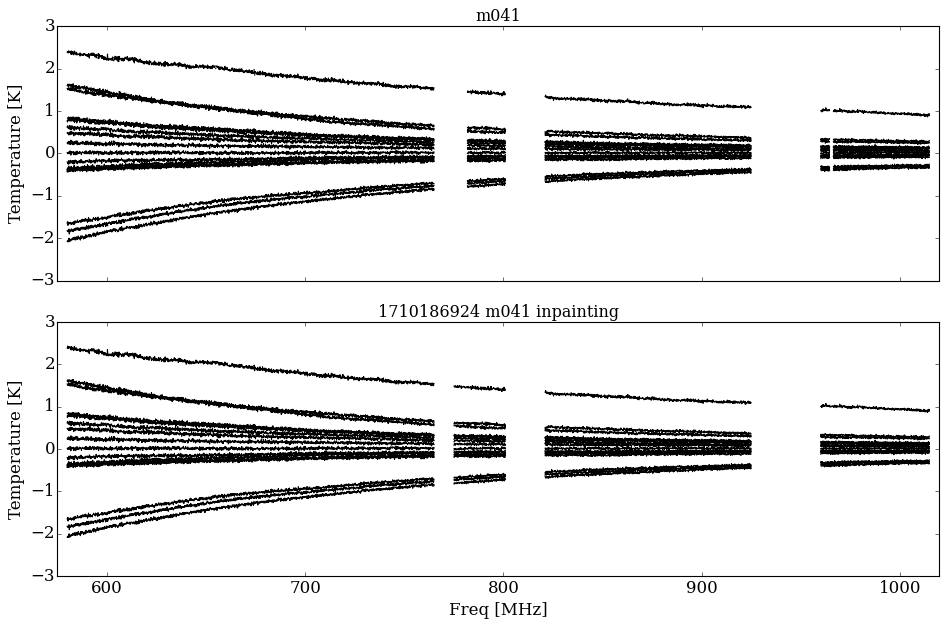

<Figure size 640x480 with 0 Axes>

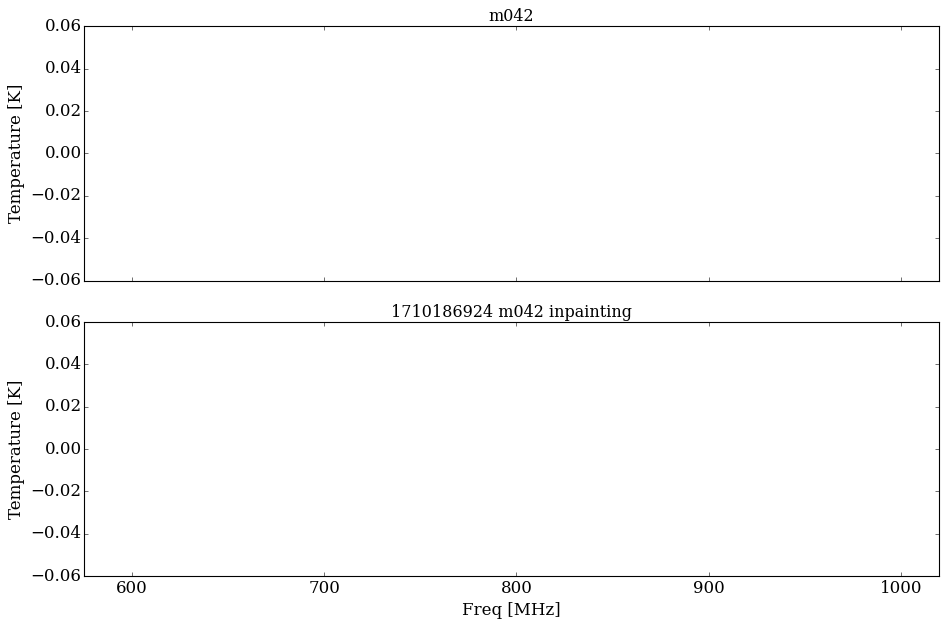

<Figure size 640x480 with 0 Axes>

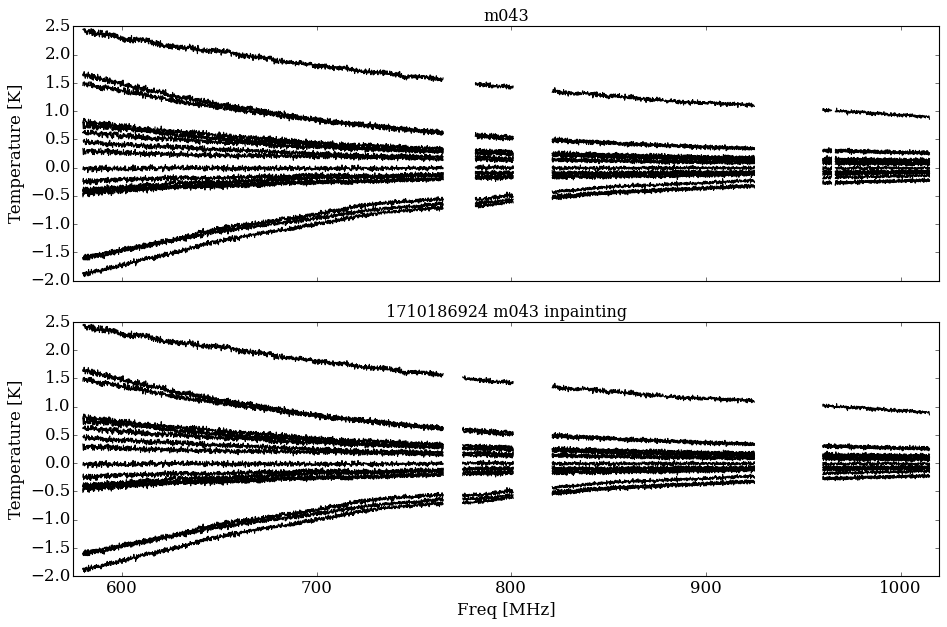

<Figure size 640x480 with 0 Axes>

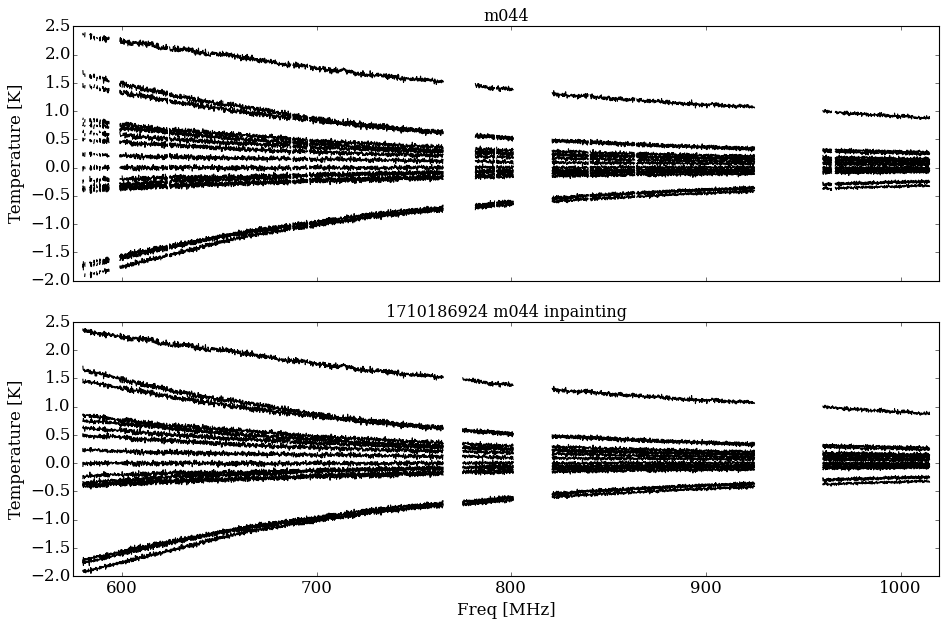

<Figure size 640x480 with 0 Axes>

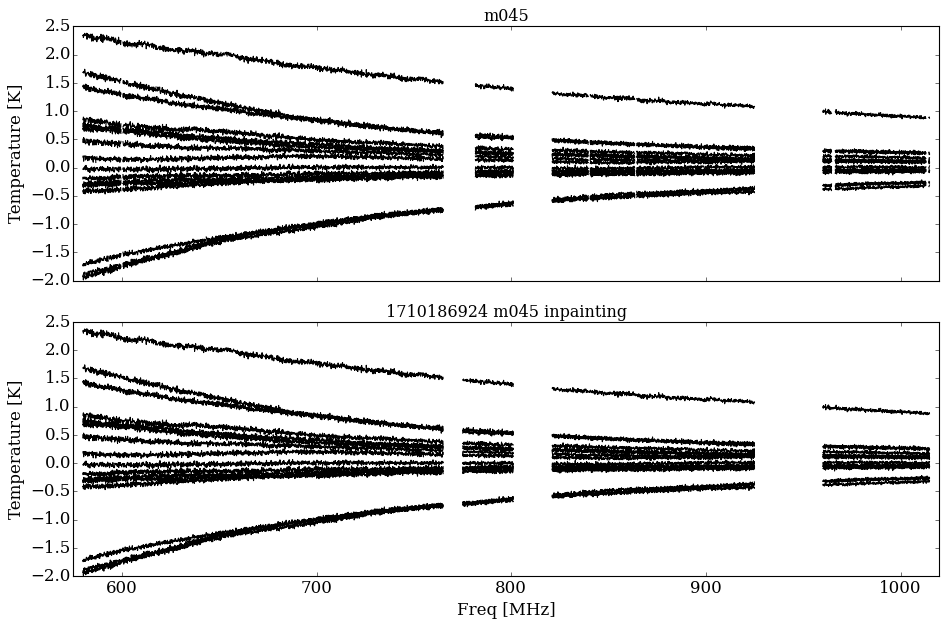

<Figure size 640x480 with 0 Axes>

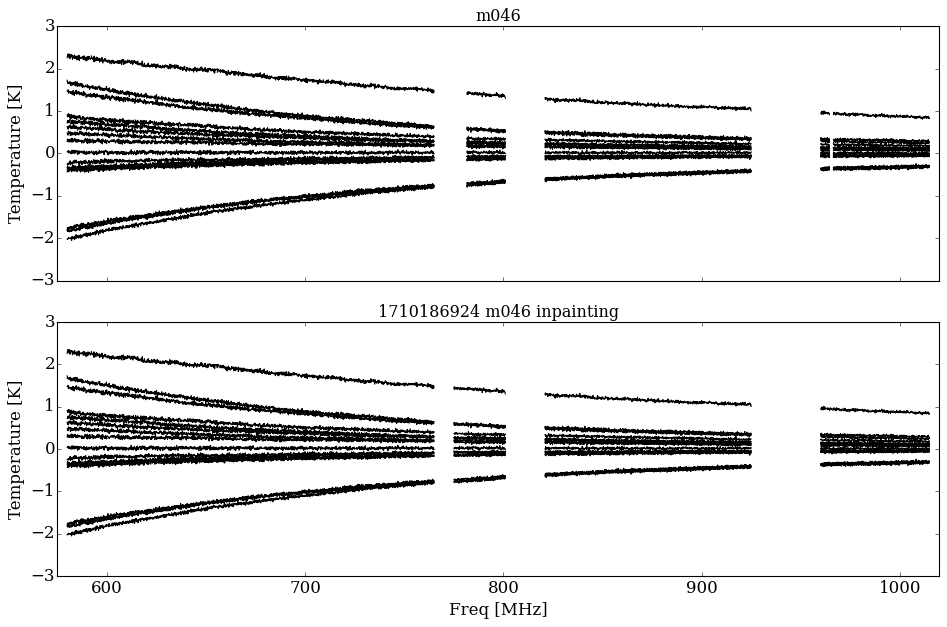

<Figure size 640x480 with 0 Axes>

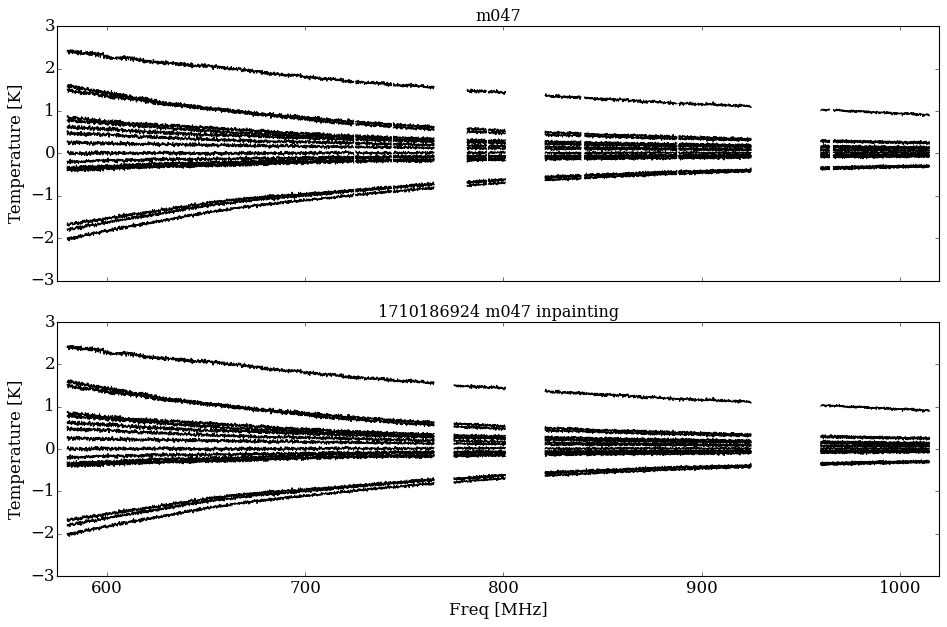

<Figure size 640x480 with 0 Axes>

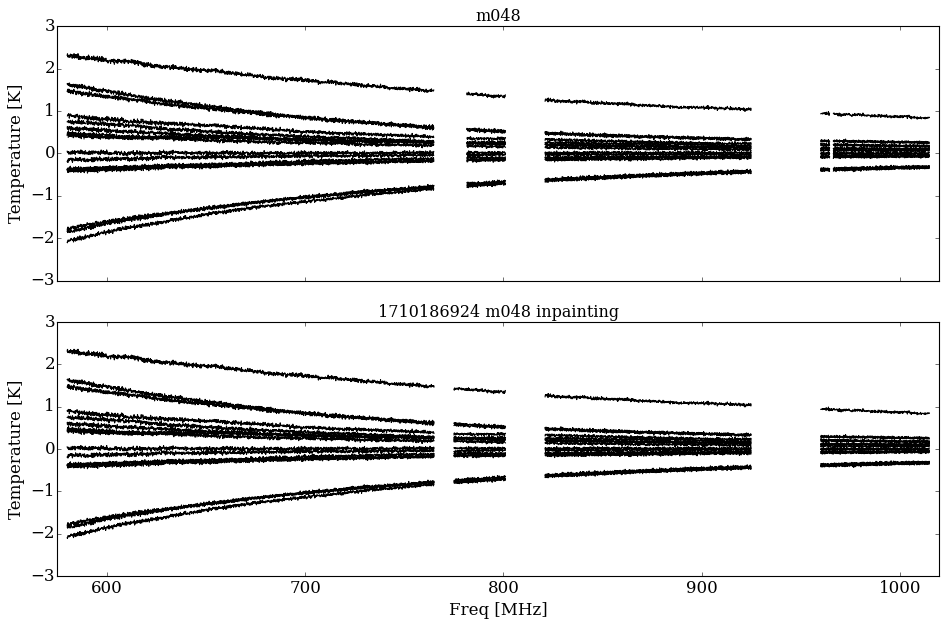

<Figure size 640x480 with 0 Axes>

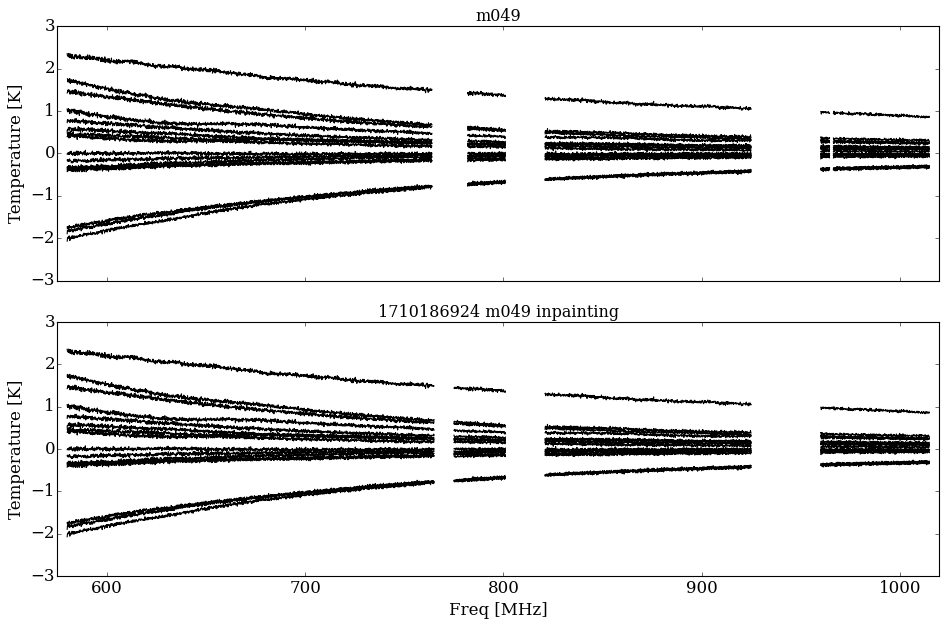

<Figure size 640x480 with 0 Axes>

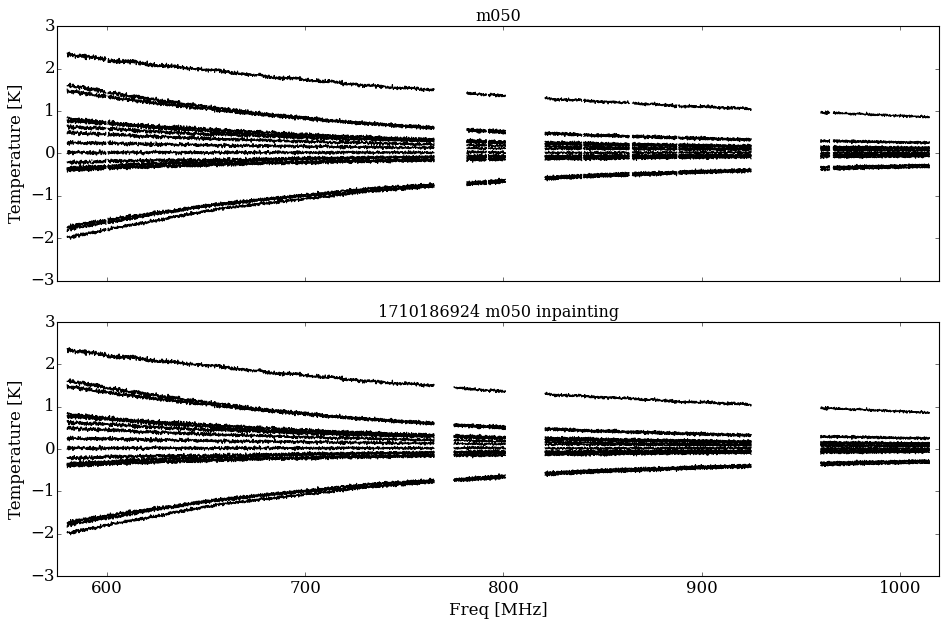

<Figure size 640x480 with 0 Axes>

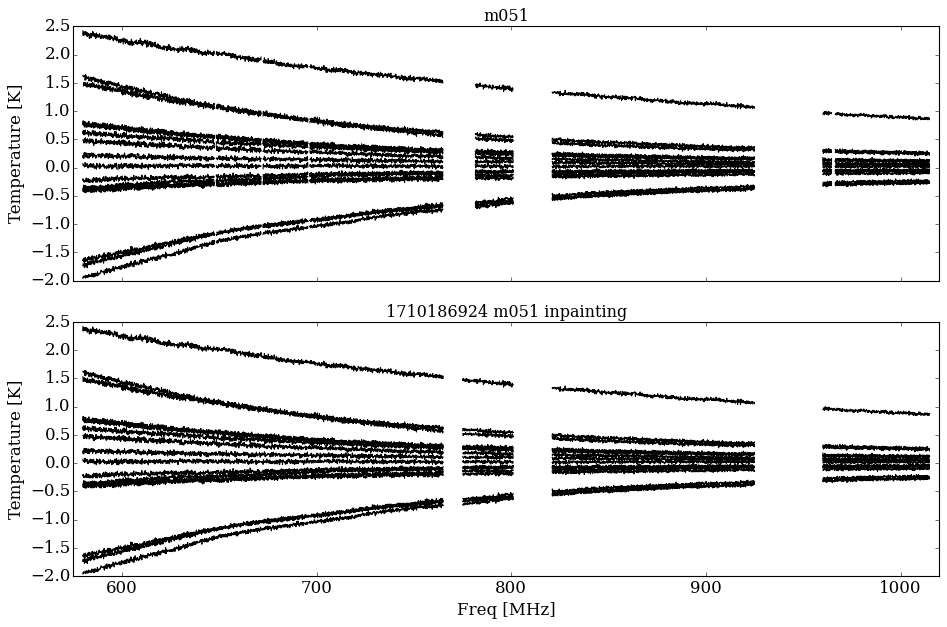

<Figure size 640x480 with 0 Axes>

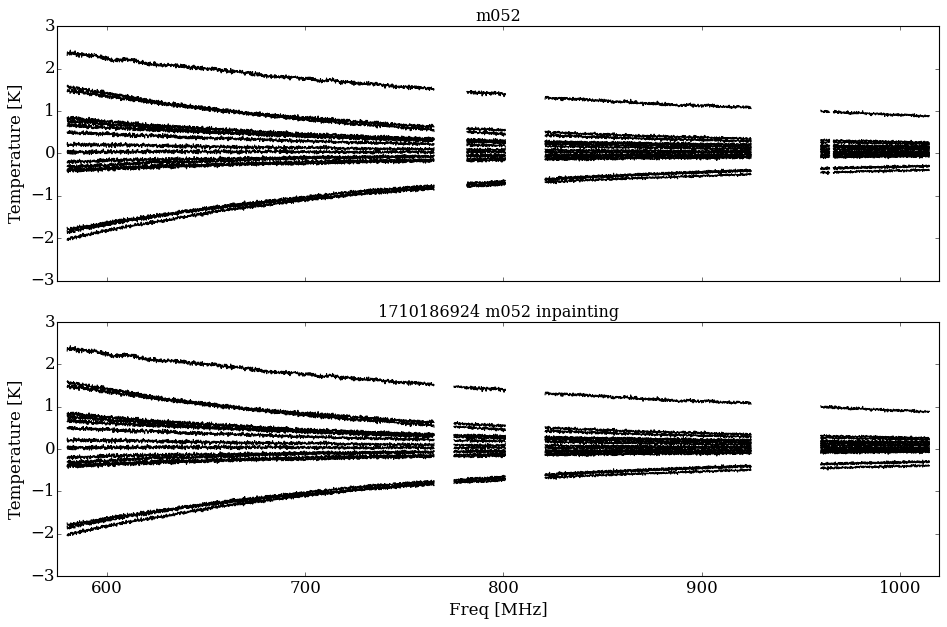

<Figure size 640x480 with 0 Axes>

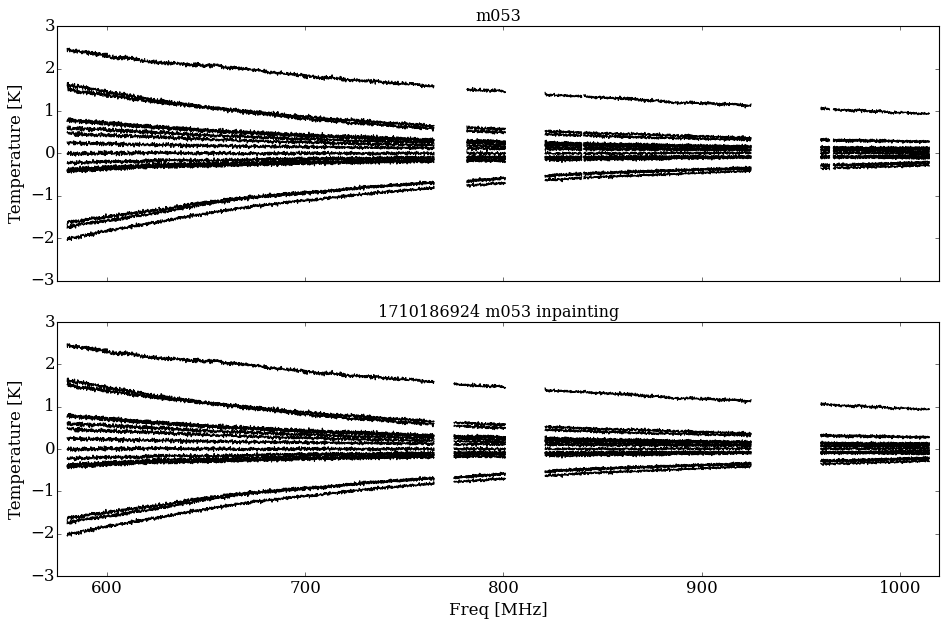

<Figure size 640x480 with 0 Axes>

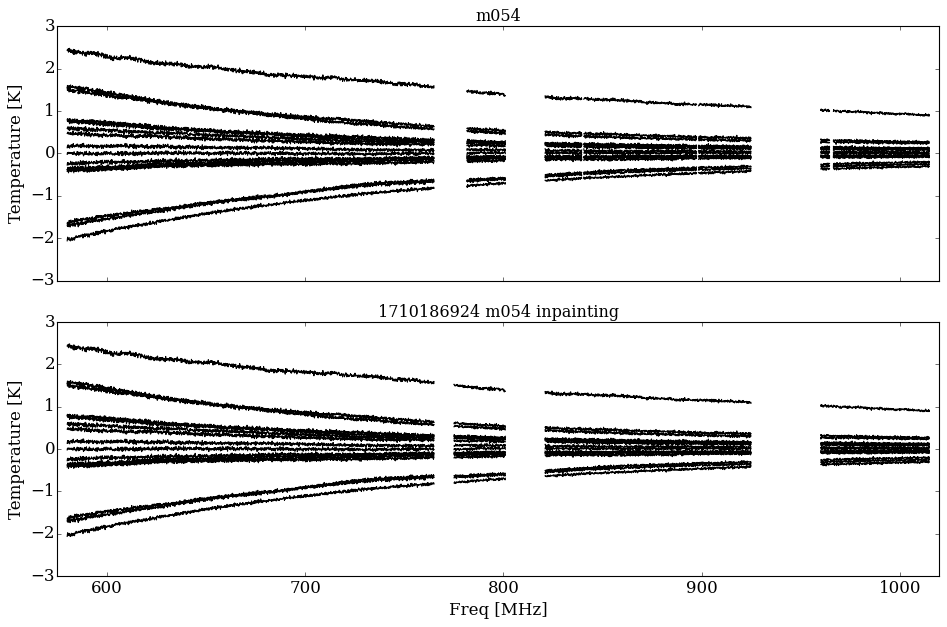

<Figure size 640x480 with 0 Axes>

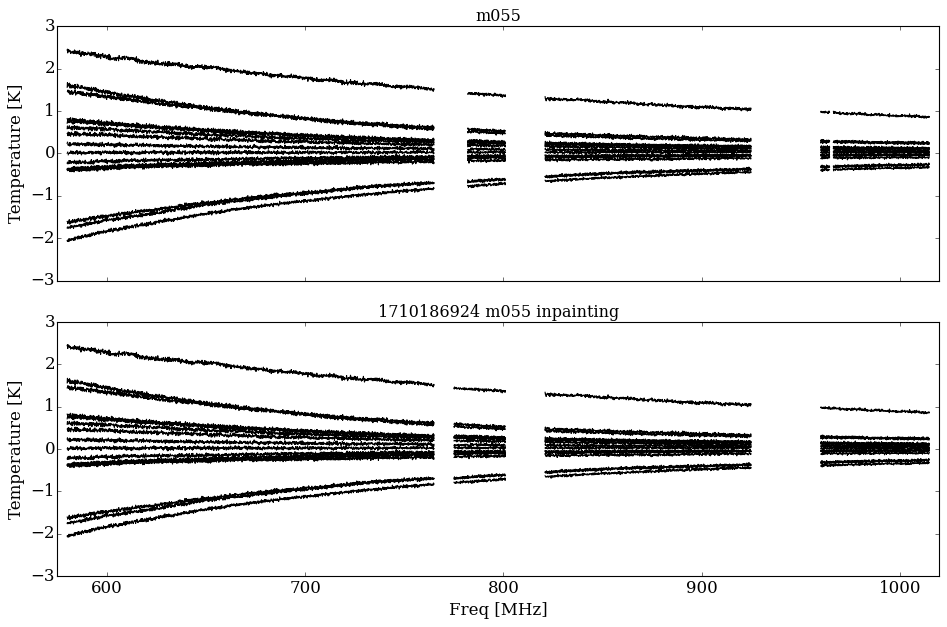

<Figure size 640x480 with 0 Axes>

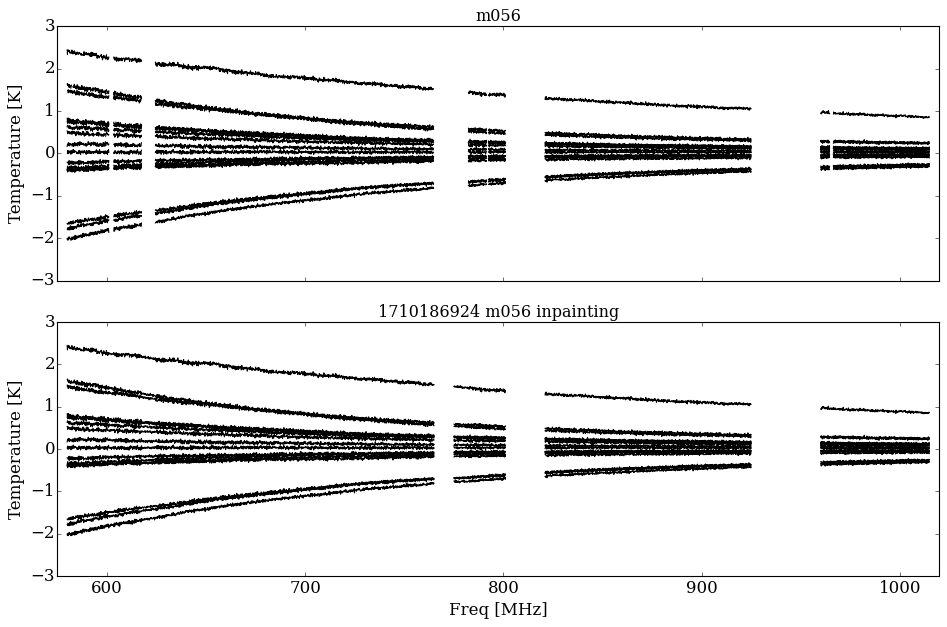

<Figure size 640x480 with 0 Axes>

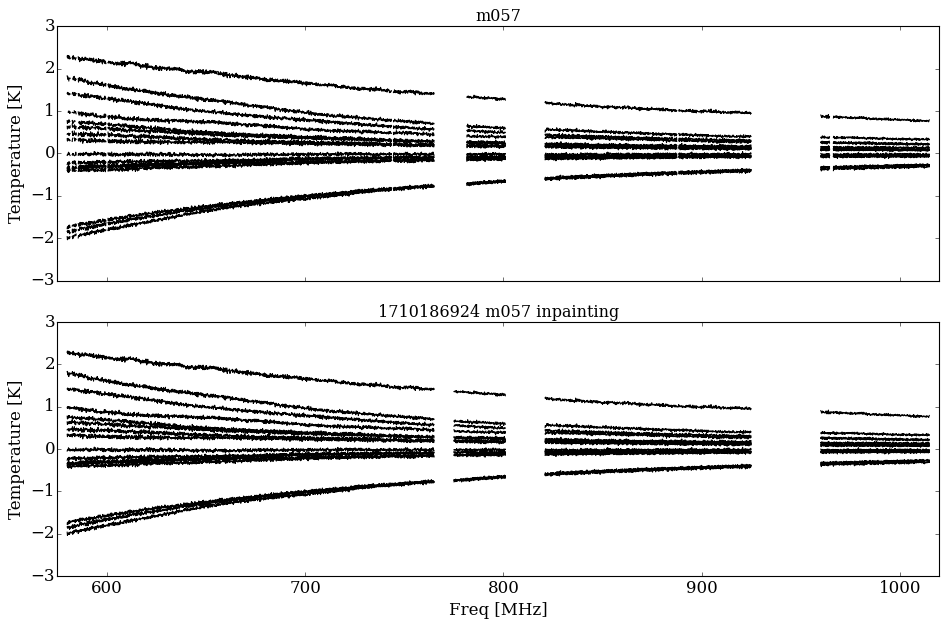

<Figure size 640x480 with 0 Axes>

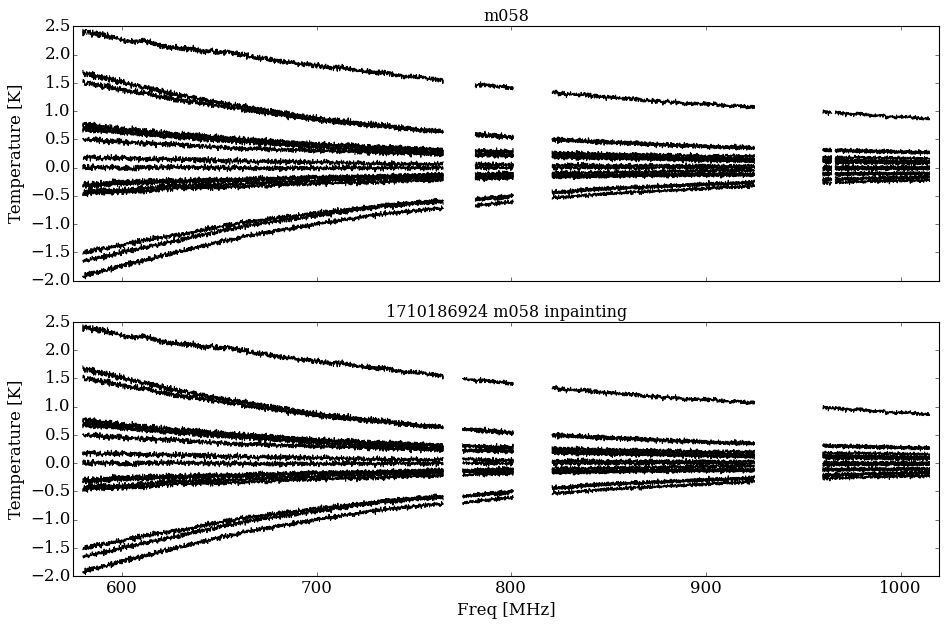

<Figure size 640x480 with 0 Axes>

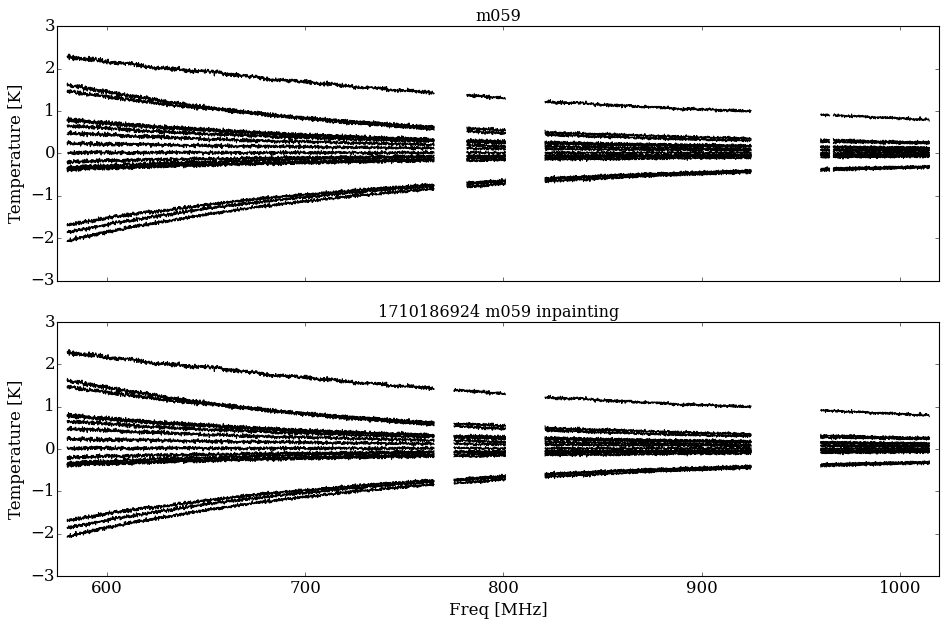

<Figure size 640x480 with 0 Axes>

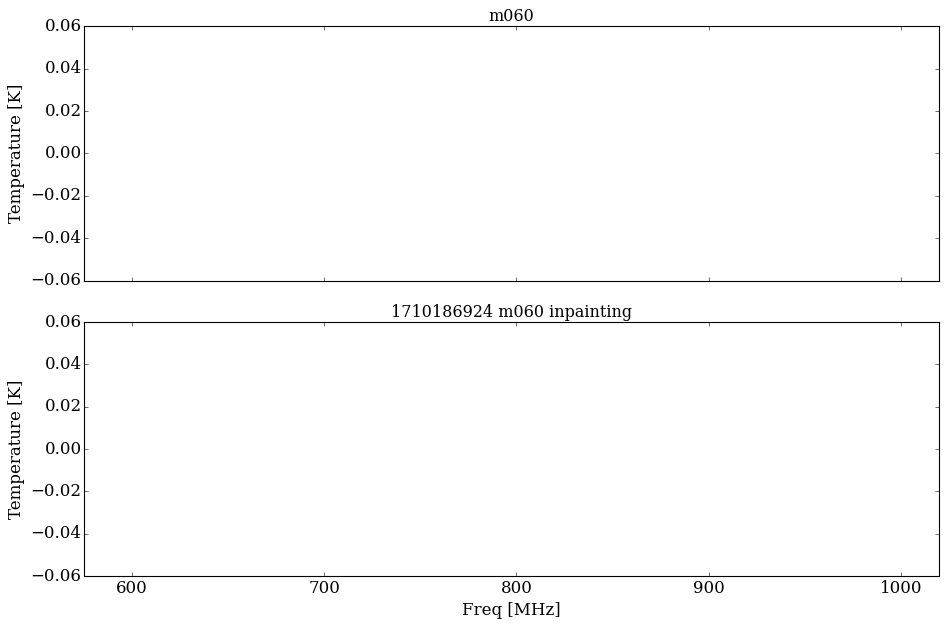

<Figure size 640x480 with 0 Axes>

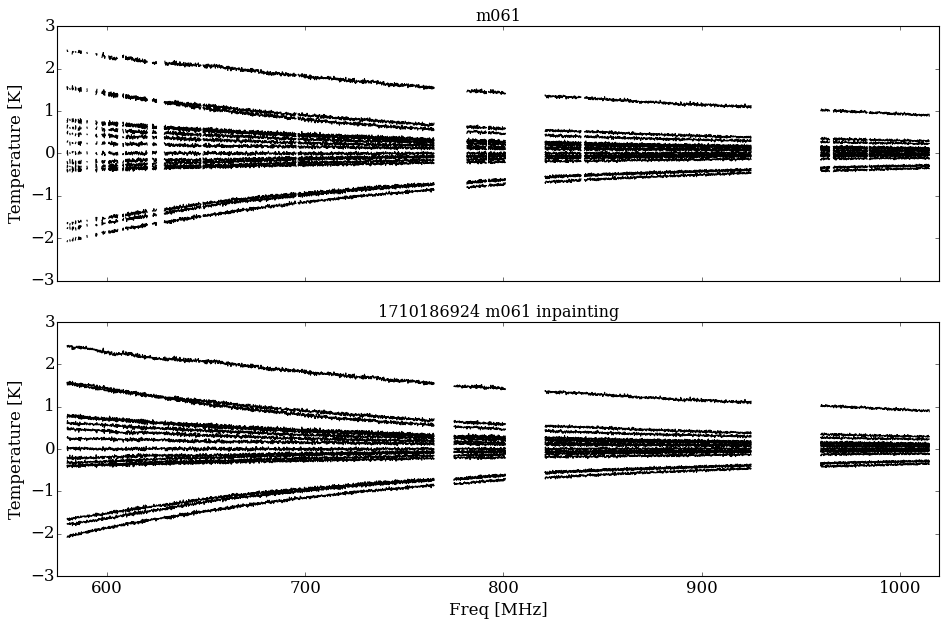

<Figure size 640x480 with 0 Axes>

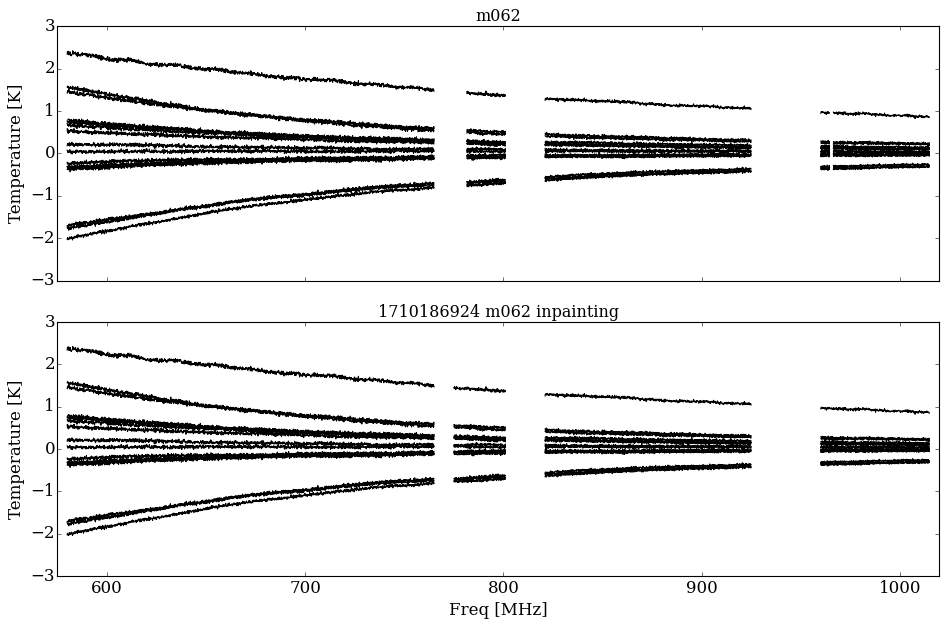

<Figure size 640x480 with 0 Axes>

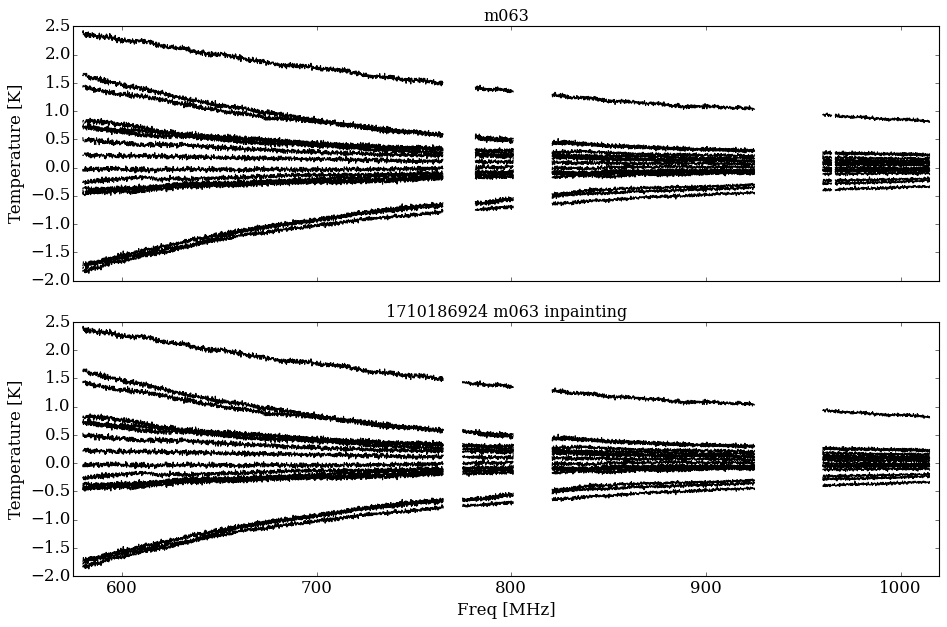

<Figure size 640x480 with 0 Axes>

In [6]:
# check the spectra after inpainting 

for i_antenna, ant in enumerate(antennas):

    fig, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 8))
    for i in np.arange(calibrated_vis_notimeaver.shape[0])[::200]:
        ax.plot(freq, calibrated_vis_notimeaver[i,:,i_antenna], color='black', lw=1)
        ax2.plot(freq, calibrated_vis_notimeaver_interp[i,:,i_antenna], color='black', lw=1)

    ax.set_ylabel('Temperature [K]', fontsize=15)
    ax.set_title(str(ant.name))
    ax2.set_xlabel('Freq [MHz]', fontsize=15)    
    ax2.set_ylabel('Temperature [K]', fontsize=15)
    ax2.set_title(block_name+' '+str(ant.name)+' inpainting')
    ax2.set_xlim(freq.min()-5, freq.max()+5)
    fig.align_ylabels()
    plt.tight_layout()
    plt.show()
    plt.clf()
        

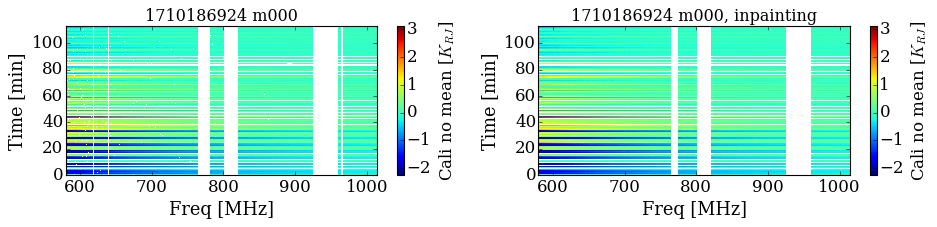

<Figure size 640x480 with 0 Axes>

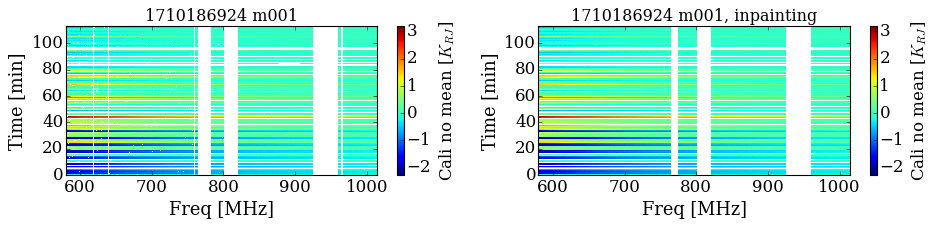

<Figure size 640x480 with 0 Axes>

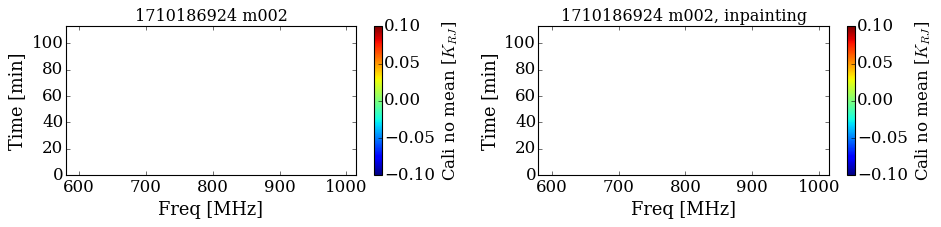

<Figure size 640x480 with 0 Axes>

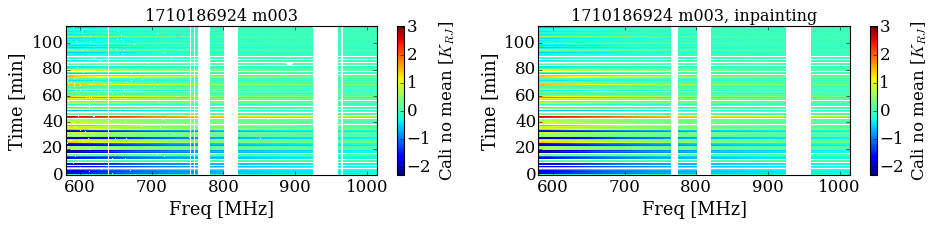

<Figure size 640x480 with 0 Axes>

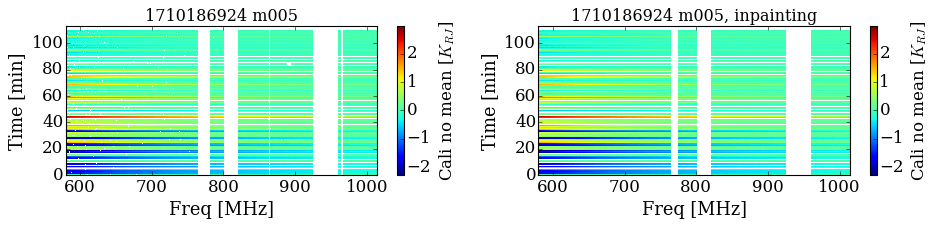

<Figure size 640x480 with 0 Axes>

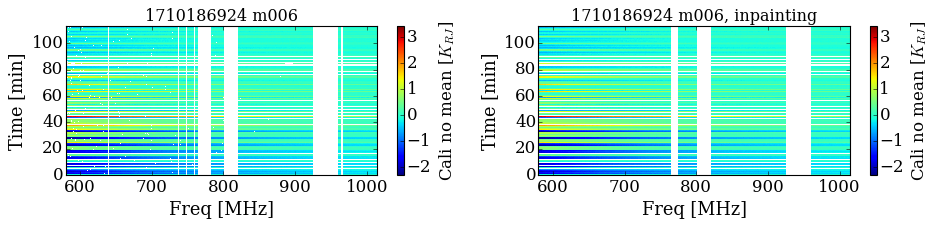

<Figure size 640x480 with 0 Axes>

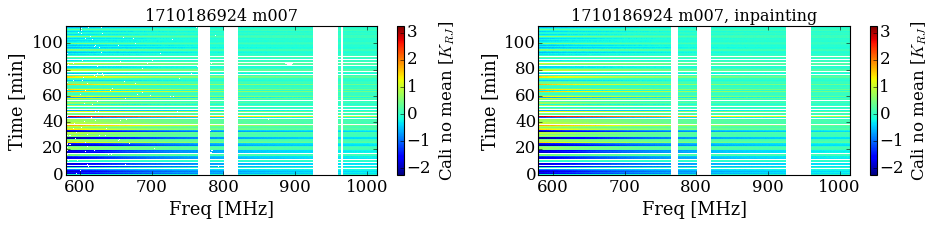

<Figure size 640x480 with 0 Axes>

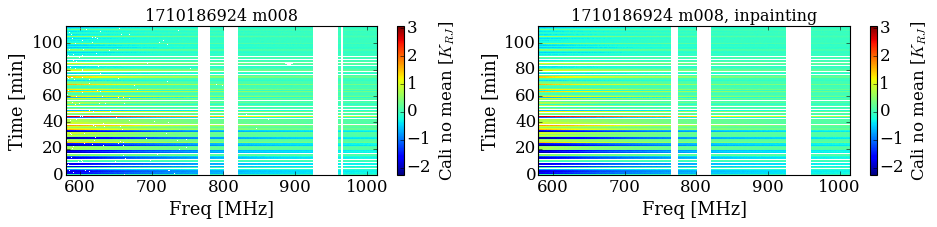

<Figure size 640x480 with 0 Axes>

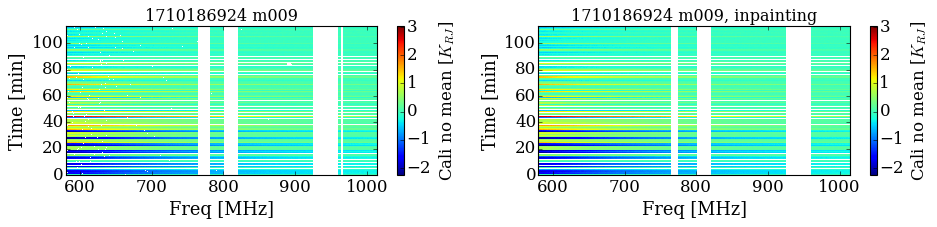

<Figure size 640x480 with 0 Axes>

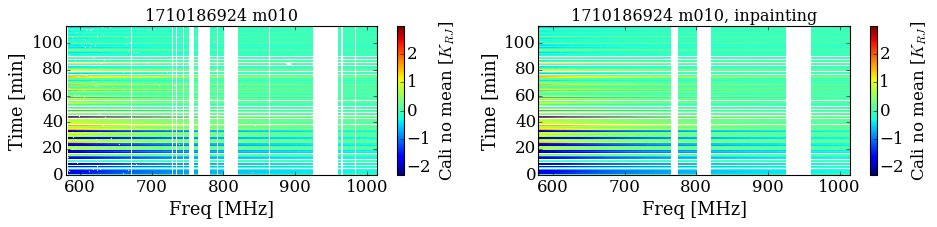

<Figure size 640x480 with 0 Axes>

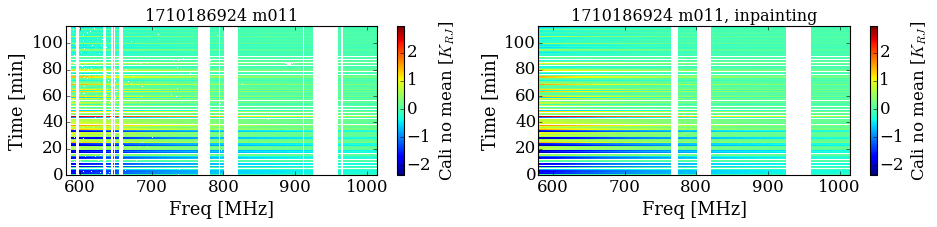

<Figure size 640x480 with 0 Axes>

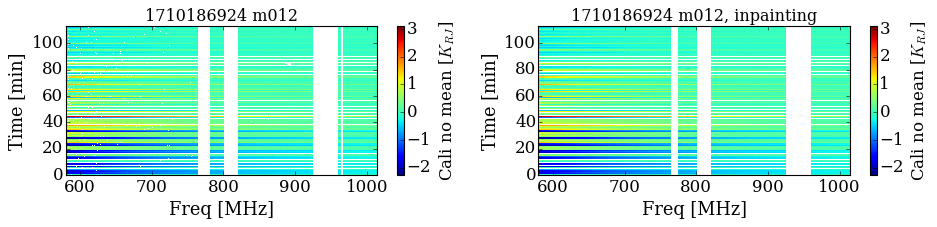

<Figure size 640x480 with 0 Axes>

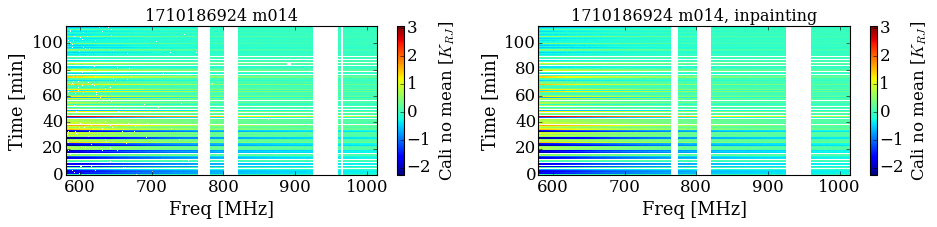

<Figure size 640x480 with 0 Axes>

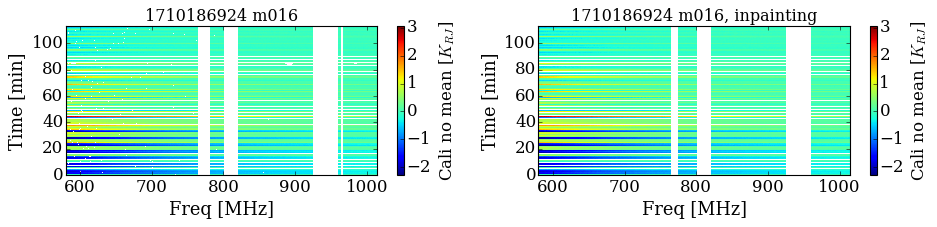

<Figure size 640x480 with 0 Axes>

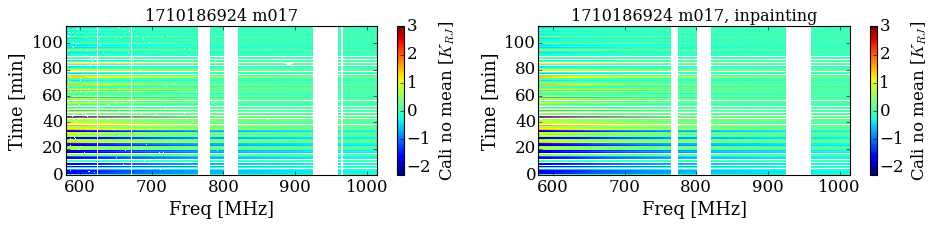

<Figure size 640x480 with 0 Axes>

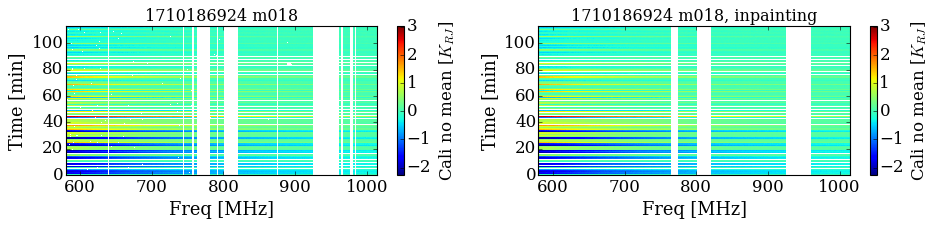

<Figure size 640x480 with 0 Axes>

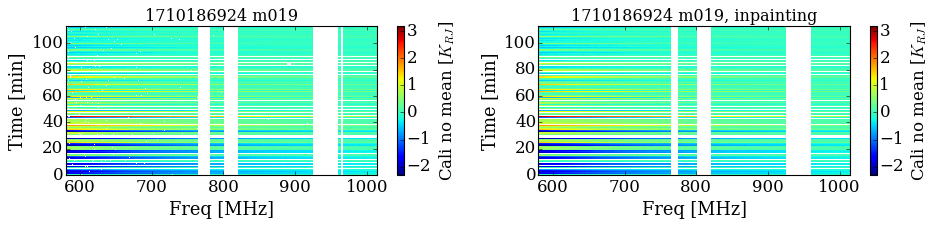

<Figure size 640x480 with 0 Axes>

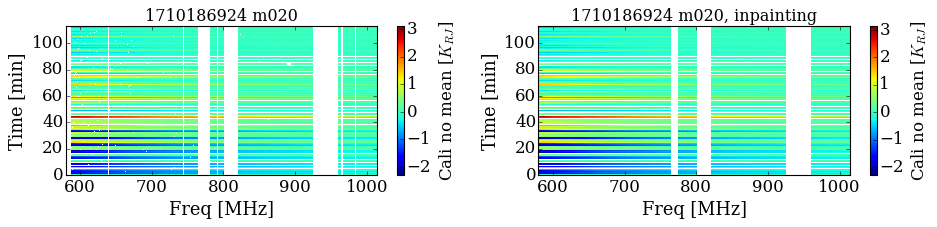

<Figure size 640x480 with 0 Axes>

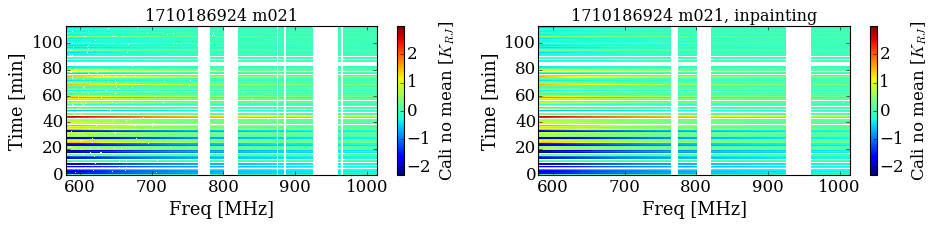

<Figure size 640x480 with 0 Axes>

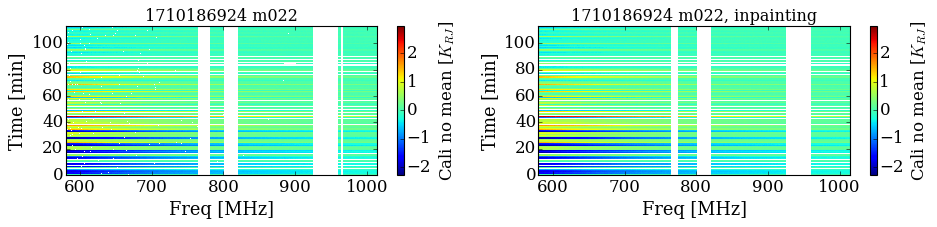

<Figure size 640x480 with 0 Axes>

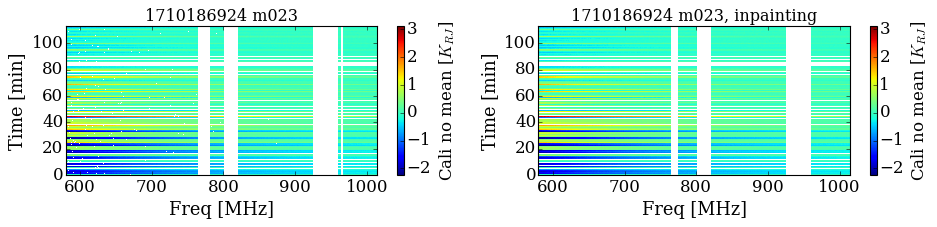

<Figure size 640x480 with 0 Axes>

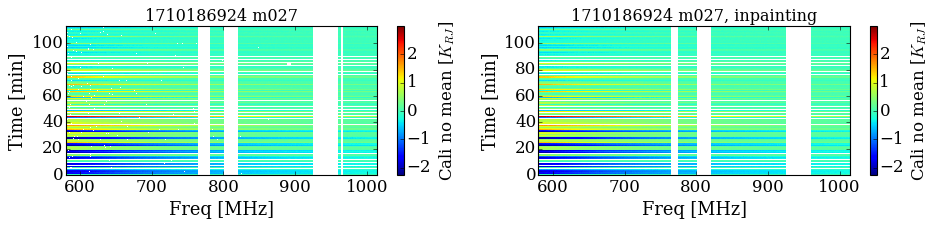

<Figure size 640x480 with 0 Axes>

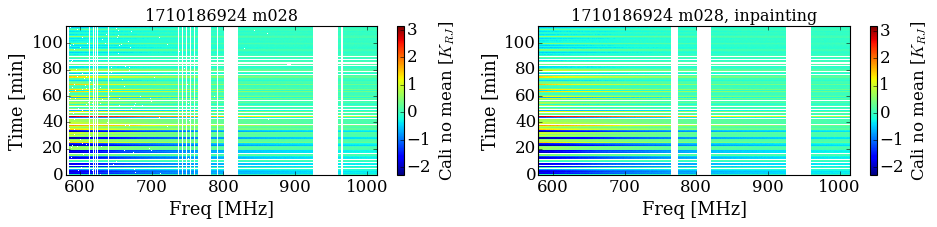

<Figure size 640x480 with 0 Axes>

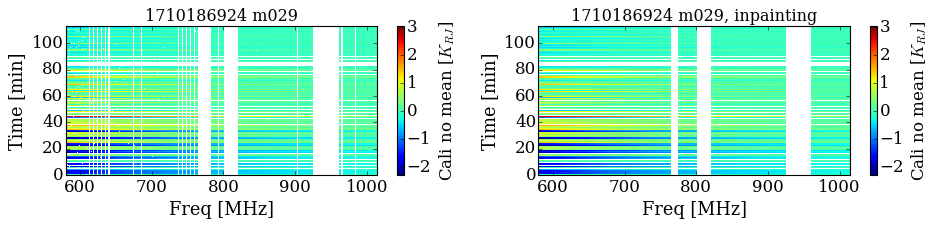

<Figure size 640x480 with 0 Axes>

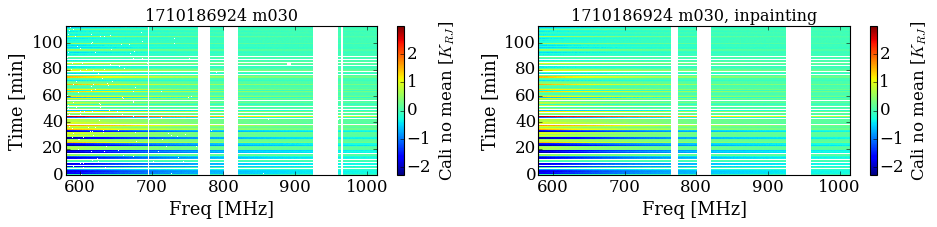

<Figure size 640x480 with 0 Axes>

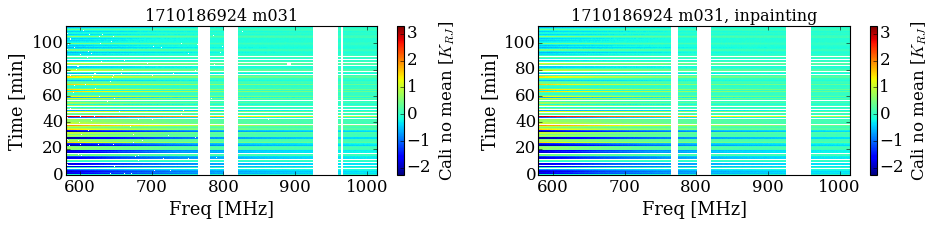

<Figure size 640x480 with 0 Axes>

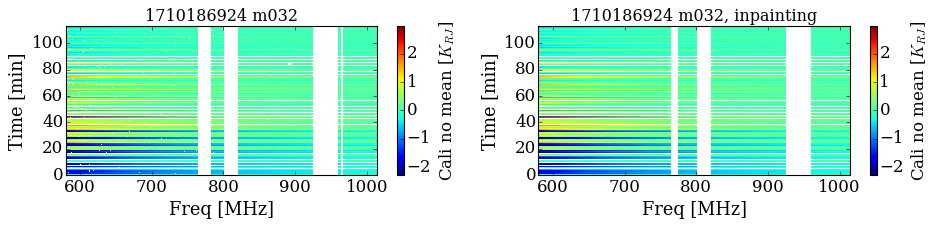

<Figure size 640x480 with 0 Axes>

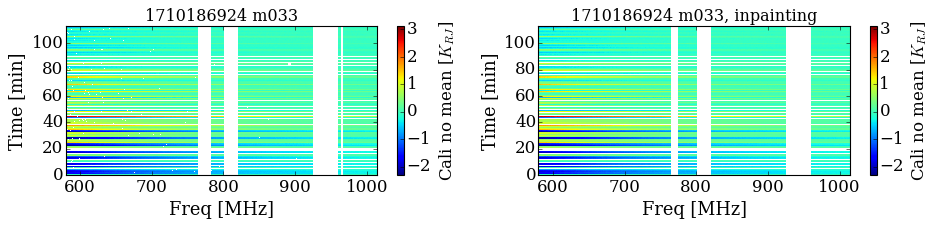

<Figure size 640x480 with 0 Axes>

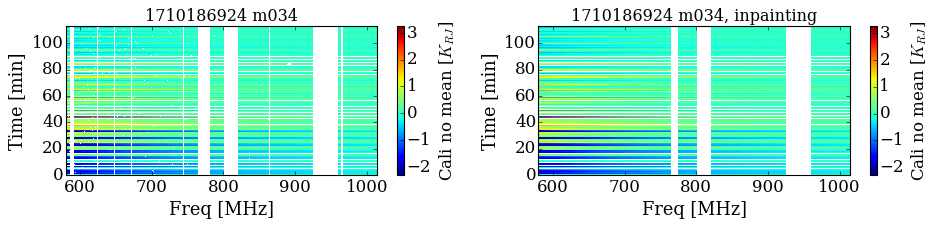

<Figure size 640x480 with 0 Axes>

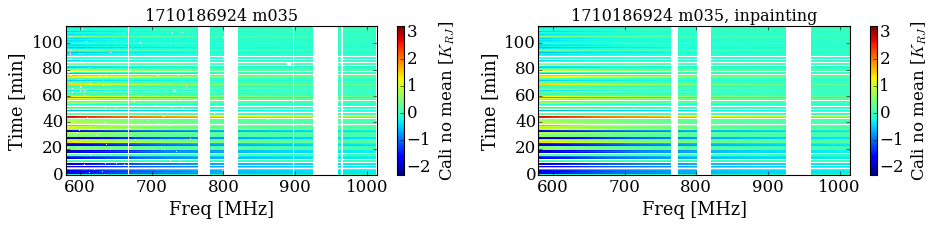

<Figure size 640x480 with 0 Axes>

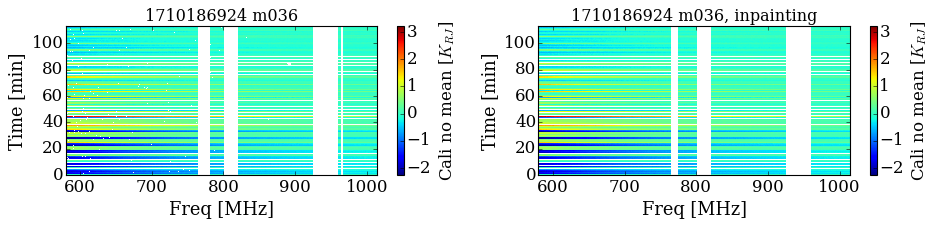

<Figure size 640x480 with 0 Axes>

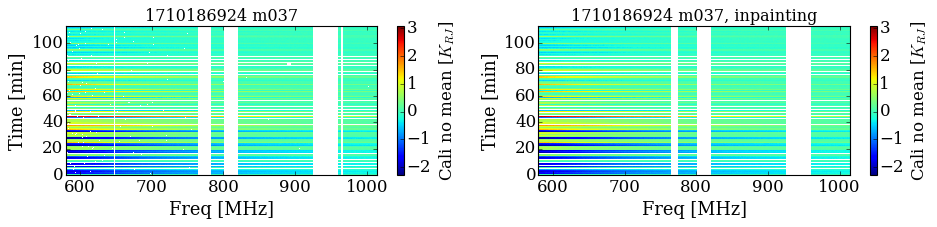

<Figure size 640x480 with 0 Axes>

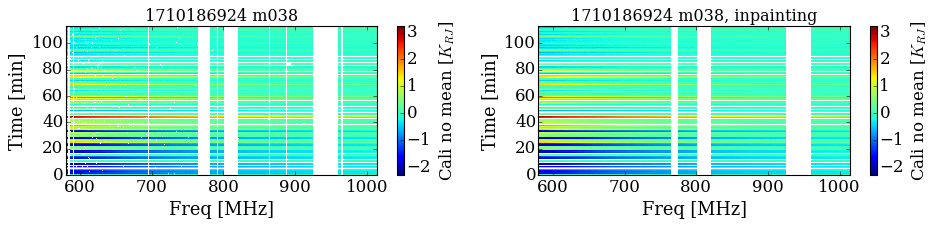

<Figure size 640x480 with 0 Axes>

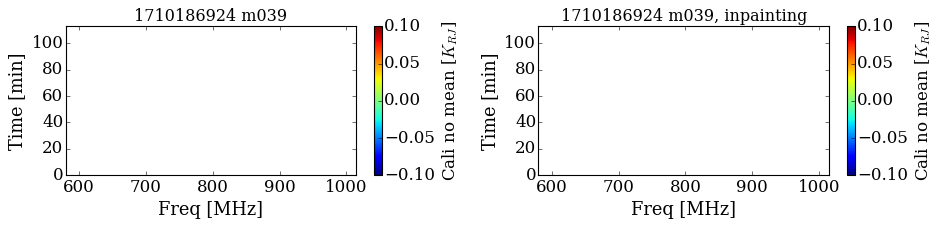

<Figure size 640x480 with 0 Axes>

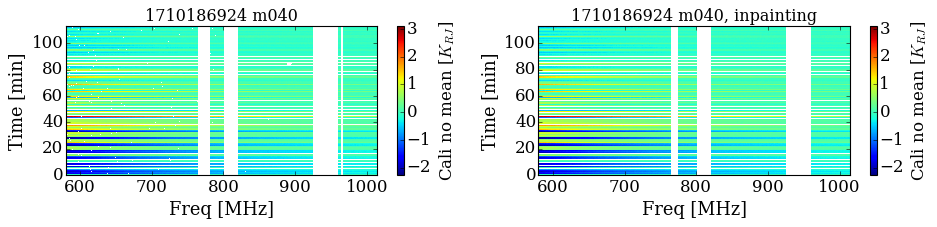

<Figure size 640x480 with 0 Axes>

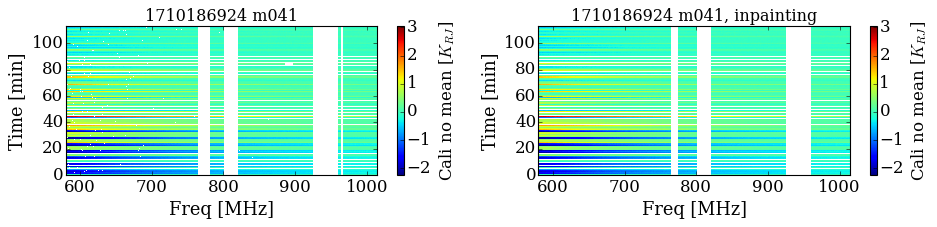

<Figure size 640x480 with 0 Axes>

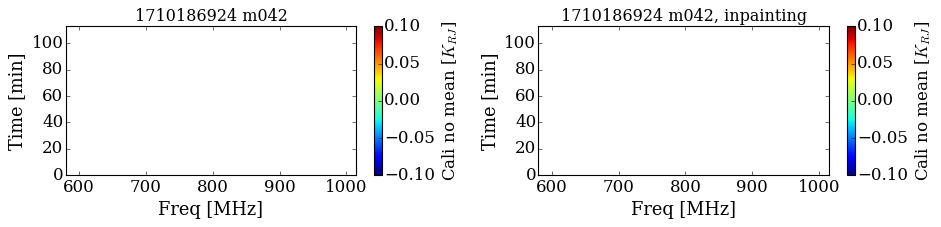

<Figure size 640x480 with 0 Axes>

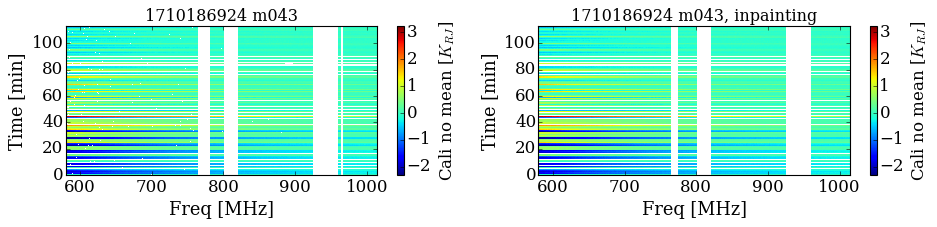

<Figure size 640x480 with 0 Axes>

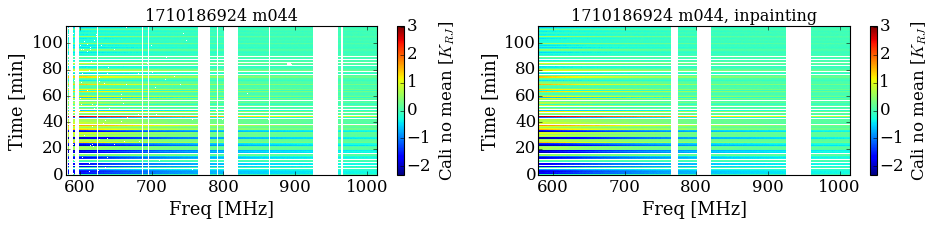

<Figure size 640x480 with 0 Axes>

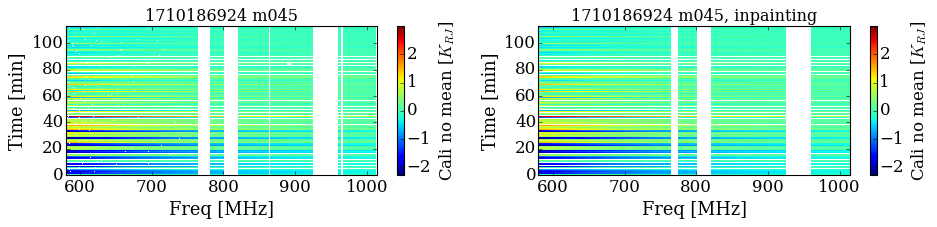

<Figure size 640x480 with 0 Axes>

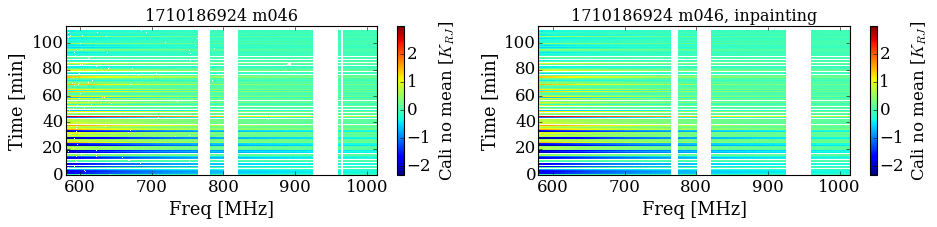

<Figure size 640x480 with 0 Axes>

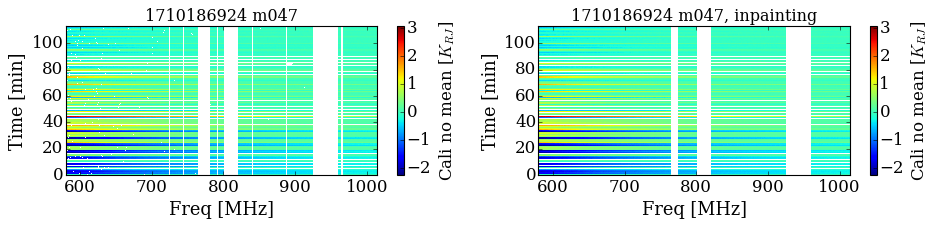

<Figure size 640x480 with 0 Axes>

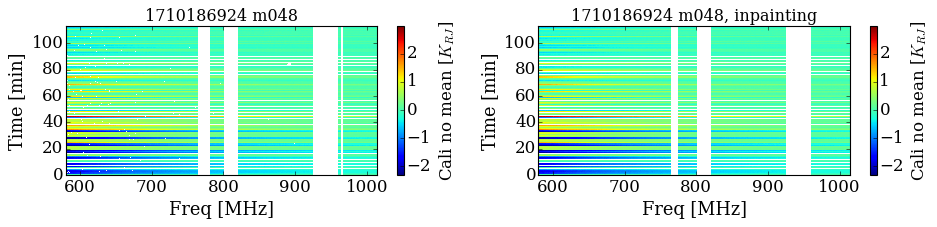

<Figure size 640x480 with 0 Axes>

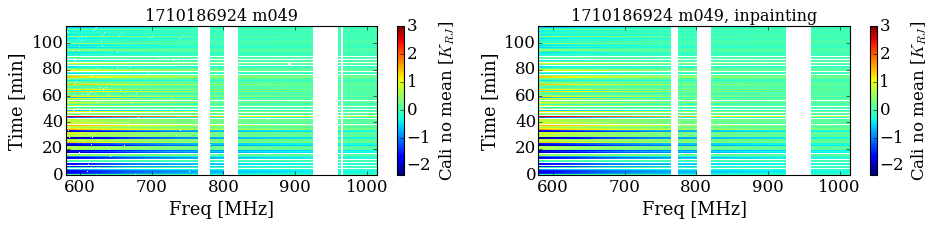

<Figure size 640x480 with 0 Axes>

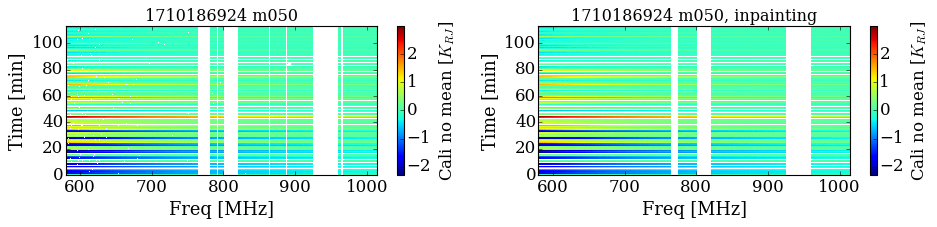

<Figure size 640x480 with 0 Axes>

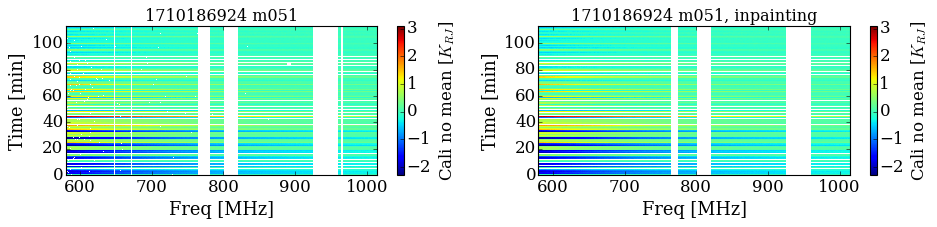

<Figure size 640x480 with 0 Axes>

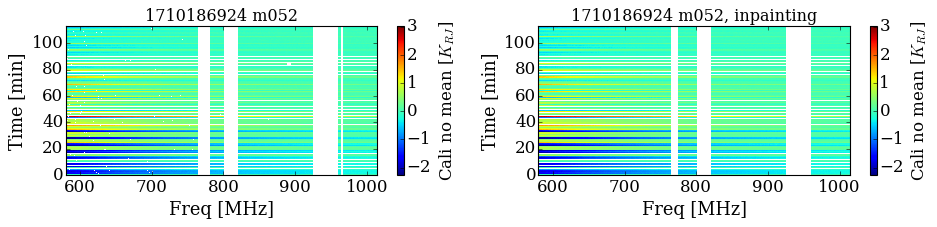

<Figure size 640x480 with 0 Axes>

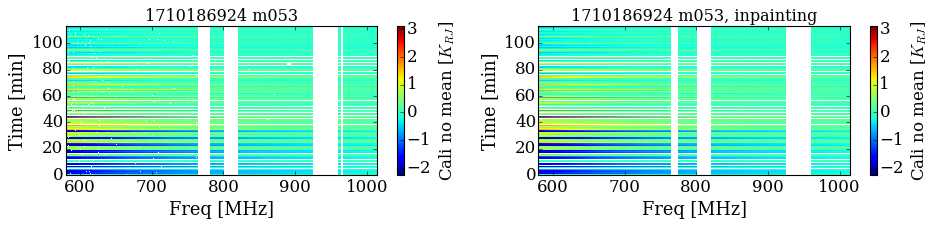

<Figure size 640x480 with 0 Axes>

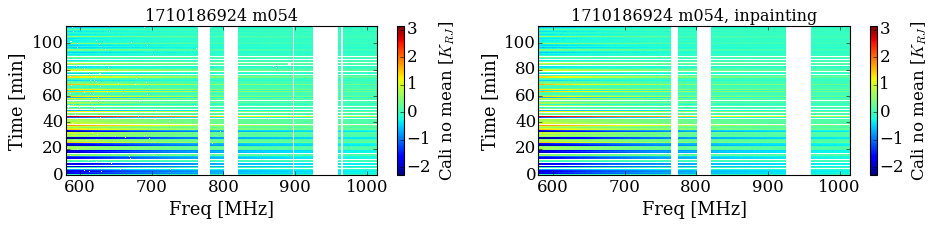

<Figure size 640x480 with 0 Axes>

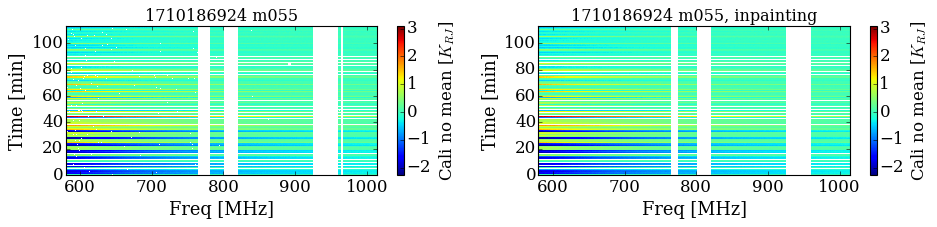

<Figure size 640x480 with 0 Axes>

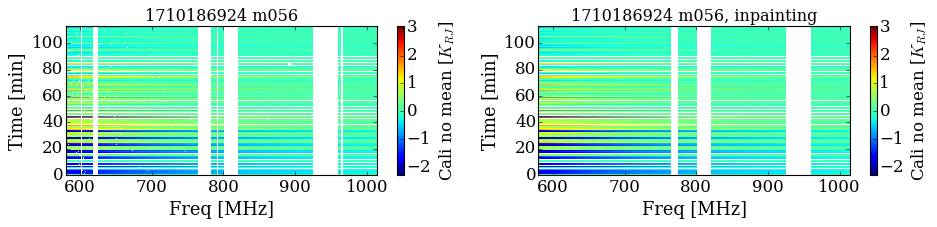

<Figure size 640x480 with 0 Axes>

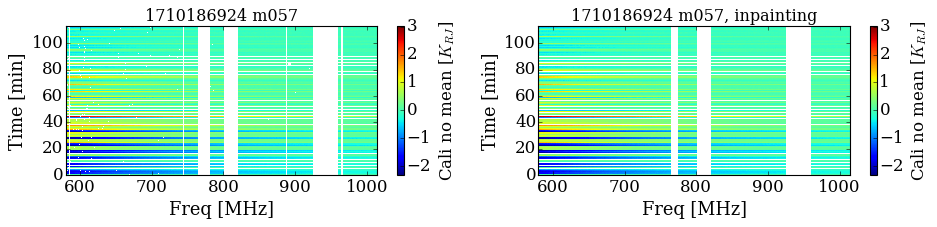

<Figure size 640x480 with 0 Axes>

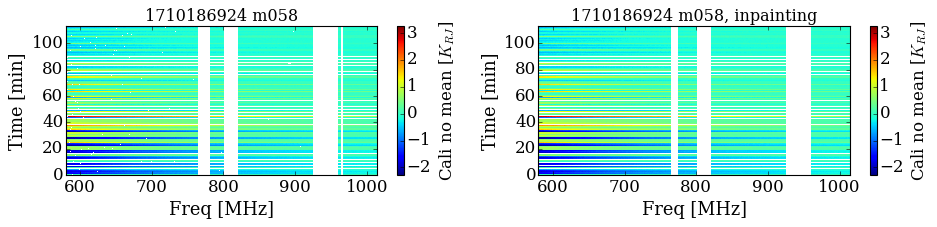

<Figure size 640x480 with 0 Axes>

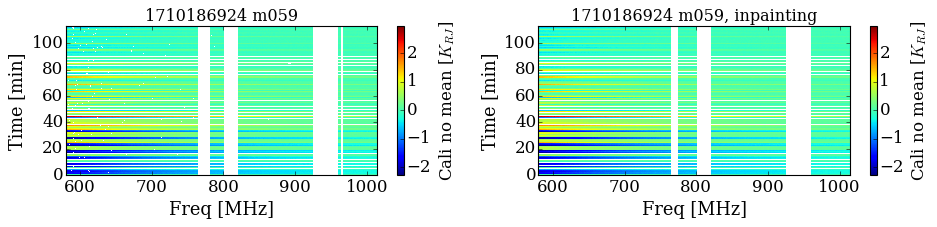

<Figure size 640x480 with 0 Axes>

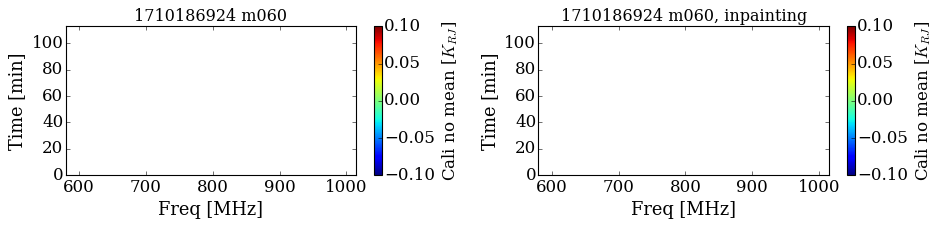

<Figure size 640x480 with 0 Axes>

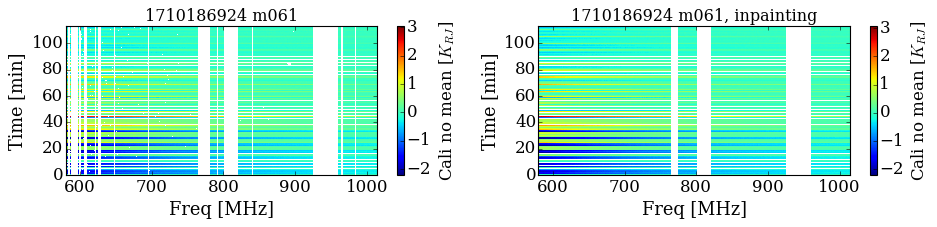

<Figure size 640x480 with 0 Axes>

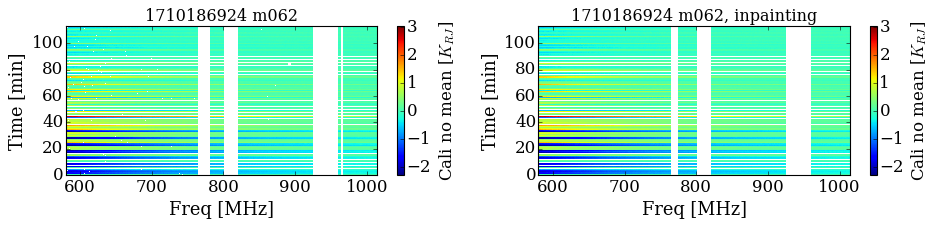

<Figure size 640x480 with 0 Axes>

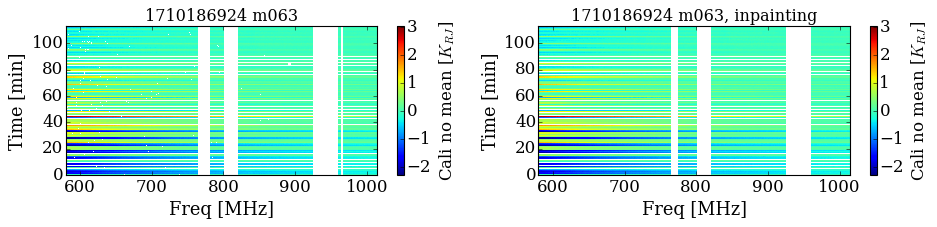

39058

<Figure size 640x480 with 0 Axes>

In [7]:
# check the maps after inpainting 

for i_antenna, ant in enumerate(antennas):

    fig = plt.figure(figsize=(12, 3))
    ax = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)

    map1 = ax.pcolormesh(freq, (timestamps-timestamps.min())/60, calibrated_vis_notimeaver[:,:,i_antenna])
    map2 = ax2.pcolormesh(freq, (timestamps-timestamps.min())/60, calibrated_vis_notimeaver_interp[:,:,i_antenna])

    ax.set_xlabel('Freq [MHz]', fontsize=16)
    ax.set_ylabel('Time [min]', fontsize=16)
    ax.set_xlim(freq.min(), freq.max())
    ax.set_ylim(0, (timestamps.max()-timestamps.min())/60)
    ax.set_title(block_name+' '+str(ant.name))
    cbar_data = plt.colorbar(map1)
    cbar_data.set_label(r'Cali no mean [$K_{RJ}$]', fontsize=15)

    ax2.set_xlabel('Freq [MHz]', fontsize=16)
    ax2.set_ylabel('Time [min]', fontsize=16)
    ax2.set_xlim(freq.min(), freq.max())
    ax2.set_ylim(0, (timestamps.max()-timestamps.min())/60)
    ax2.set_title(block_name+' '+str(ant.name)+', inpainting')
    cbar_data = plt.colorbar(map2)
    cbar_data.set_label(r'Cali no mean [$K_{RJ}$]', fontsize=15)

    plt.tight_layout()
    plt.show()
    plt.clf()

del calibrated_vis_notimeaver, calibrated_vis_notimeaver_interp
gc.collect()

In [8]:
# combining maps from all antennas

allmap_antennalist_array = np.ma.masked_array(allmap_antennalist)
del allmap_antennalist
gc.collect()
# Calculate the expression T[n] + T[n+1] - T[n-1] - T[n+2] for valid indices
delta = (allmap_antennalist_array[:,:,:,1:-2] +
         allmap_antennalist_array[:,:,:,2:-1] -
         allmap_antennalist_array[:,:,:,:-3] -
         allmap_antennalist_array[:,:,:,3:]) / 2.
weight = 1. / np.ma.std(delta, axis=-1)
weight_ex = np.repeat(weight[:,:,:,np.newaxis], allmap_antennalist_array.shape[-1], axis=3)

map_antennacombine = np.ma.average(allmap_antennalist_array, axis=0, weights=weight_ex)
hit_data[~np.isfinite(map_antennacombine)] = 0.
del weight_ex, weight
gc.collect()

0

/users/wkhu/environment/museek/lib/python3.10/site-packages/matplotlib/cbook.py:1719: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)


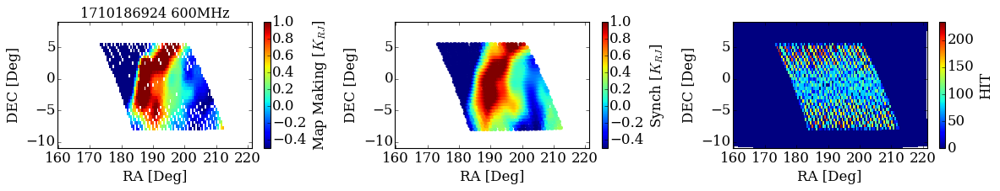

<Figure size 640x480 with 0 Axes>

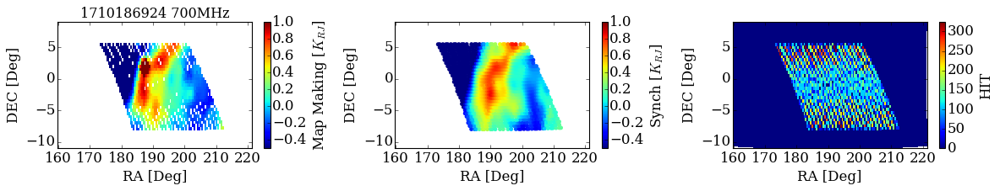

<Figure size 640x480 with 0 Axes>

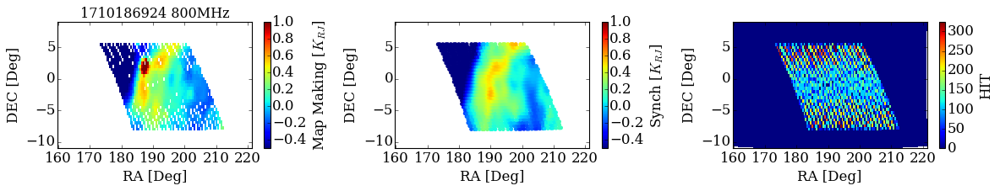

<Figure size 640x480 with 0 Axes>

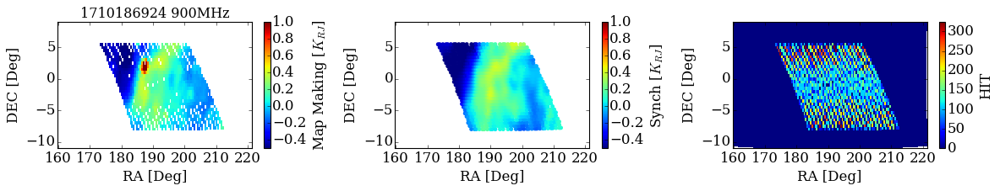

<Figure size 640x480 with 0 Axes>

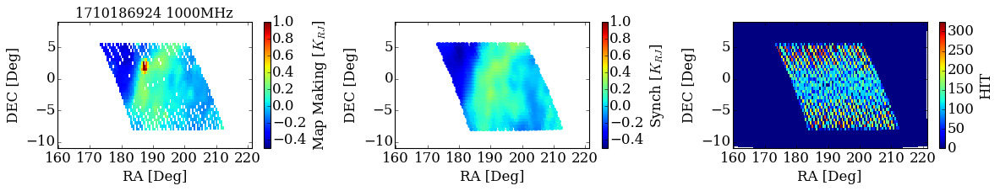

<Figure size 640x480 with 0 Axes>

In [9]:
#######   map-making for synch and compared with data, all antennas combined  #############

nside=128             # resolution parameter at which the synchrotron model is to be calculated
beamsize=57.5         # the beam fwhm used to smooth the Synch model [arcmin]
beam_frequency=1500.  # reference frequency at which the beam fwhm are defined [MHz]
sky = pysm3.Sky(nside=nside, preset_strings=["s1"])  # Here we use "s1" vresion of synch model, please see https://pysm3.readthedocs.io/en/latest/models.html#synchrotron

freq_plot_list = np.arange(600, 1020, 100)

for freq_plot in freq_plot_list:
    index_freq_plot = np.argmin(np.abs(freq-freq_plot))
    map_making_data_plot = np.ma.median(map_antennacombine[:,:,index_freq_plot-30:index_freq_plot+30], axis=-1)

    if map_making_data_plot.mask.all():
        print (str(freq_plot) + 'MHz is masked')
    else:
        #########   produce synch model at a certain frequency and smooth   #########
        map_reference = sky.get_emission(freq_plot * u.MHz).value
        map_reference_smoothed = pysm3.apply_smoothing_and_coord_transform(
            map_reference, 
            fwhm=beamsize*u.arcmin * ((beam_frequency*u.MHz)/(freq_plot * u.MHz)).decompose().value 
        )

        #########   map the smoothed synch model to the same sky covered by ra,dec of scan_data
        c = SkyCoord(ra=ra_map.flatten() * u.degree, dec=dec_map.flatten() * u.degree, frame='icrs')
        theta = 90. - (c.galactic.b / u.degree).value
        phi = (c.galactic.l / u.degree).value
        synch_I = hp.pixelfunc.get_interp_val(map_reference_smoothed[0], theta / 180. * np.pi, phi / 180. * np.pi)
        synch_I = synch_I / 10**6.  
        synch_I = np.ma.masked_array(synch_I, mask=map_antennacombine[:,:,index_freq_plot].T.mask)
        synch_I = synch_I - np.ma.mean(synch_I)

        
        fig = plt.figure(figsize=(15, 3))
        ax = fig.add_subplot(1, 3, 1)
        mk_data = plt.pcolormesh(ra_map, dec_map, map_making_data_plot.T, vmax=1.0, vmin=-0.5)
        ax.set_xlabel('RA [Deg]', fontsize=15)
        ax.set_ylabel('DEC [Deg]', fontsize=15)
        ax.set_title(block_name+' '+str(freq_plot) + 'MHz')
        ax.set_xlim(ra_map.min(), ra_map.max())
        ax.set_ylim(dec_map.min(), dec_map.max())
        cbar_mp = plt.colorbar(mk_data)
        cbar_mp.set_label(r'Map Making [$K_{RJ}$]', fontsize=15)
        
        ax2 = fig.add_subplot(1, 3, 2)
        mk_data = plt.scatter(ra_map.flatten(), dec_map.flatten(), c=synch_I, edgecolor='None', vmax=1.0, vmin=-0.5)
        ax2.set_xlabel('RA [Deg]', fontsize=15)
        ax2.set_ylabel('DEC [Deg]', fontsize=15)
        ax2.set_xlim(ra_map.min(), ra_map.max())
        ax2.set_ylim(dec_map.min(), dec_map.max())
        cbar_mp = plt.colorbar(mk_data)
        cbar_mp.set_label(r'Synch [$K_{RJ}$]', fontsize=15)

        ax3 = fig.add_subplot(1, 3, 3)
        mk_data = plt.pcolormesh(ra_map, dec_map, hit_data[:,:,index_freq_plot].T)
        ax3.set_xlabel('RA [Deg]', fontsize=15)
        ax3.set_ylabel('DEC [Deg]', fontsize=15)
        ax3.set_xlim(ra_map.min(), ra_map.max())
        ax3.set_ylim(dec_map.min(), dec_map.max())
        cbar_mp = plt.colorbar(mk_data)
        cbar_mp.set_label('HIT', fontsize=15)
        
        plt.tight_layout()
        plt.show()
        plt.clf()

            

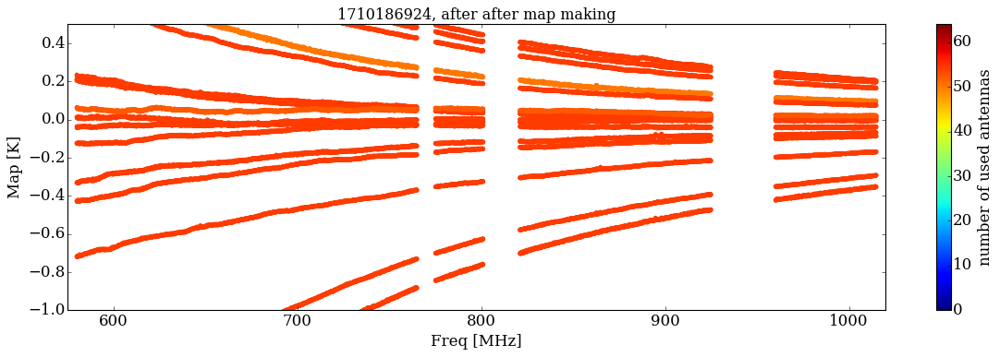

<Figure size 640x480 with 0 Axes>

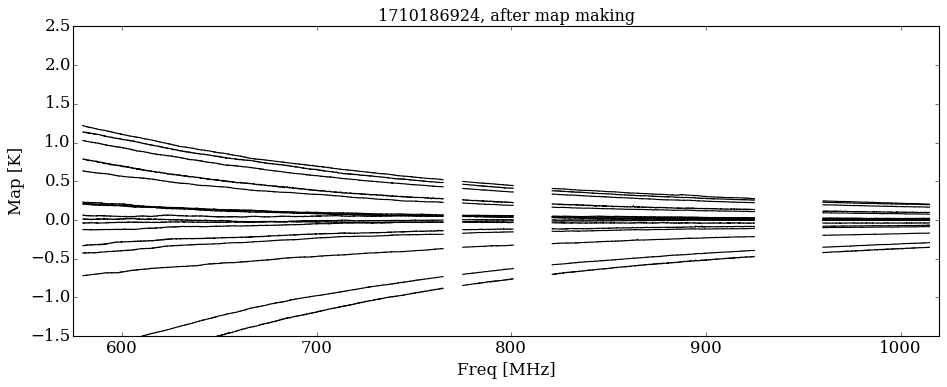

<Figure size 640x480 with 0 Axes>

In [10]:
# check the spectra of final data cube

mask_antennacombine_sum = np.sum(~allmap_antennalist_array.mask, axis=0)
# masking the pixels where <=10 antennas contributes
mask_antennacombine_sum_freqmedian = np.median(mask_antennacombine_sum, axis=-1)
map_antennacombine.mask[mask_antennacombine_sum_freqmedian<=mask_antnum_threshold] = True
hit_data[mask_antennacombine_sum_freqmedian<=mask_antnum_threshold] = 0

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
for i in range(map_antennacombine.shape[0])[::10]:
    for j in range(map_antennacombine.shape[1])[::10]:
       sc = ax.scatter(freq, map_antennacombine[i,j], c=mask_antennacombine_sum[i,j], edgecolor='None', vmin=0, vmax=64)

ax.set_xlabel('Freq [MHz]', fontsize=15)    
ax.set_ylabel('Map [K]', fontsize=15)
ax.set_xlim(freq.min()-5, freq.max()+5)
ax.set_title(block_name+', after after map making')

cbar_mp = fig.colorbar(sc)
cbar_mp.set_label('number of used antennas', fontsize=15)
ax.set_ylim(-1,0.5)
plt.tight_layout()
plt.show()
plt.clf()

fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(1, 1, 1)
for i in range(map_antennacombine.shape[0])[::10]:
    for j in range(map_antennacombine.shape[1])[::10]:
       ax.plot(freq, map_antennacombine[i,j], color='black', lw=1)

ax.set_xlabel('Freq [MHz]', fontsize=15)    
ax.set_ylabel('Map [K]', fontsize=15)
ax.set_xlim(freq.min()-5, freq.max()+5)
ax.set_ylim(-1.5,2.5)
ax.set_title(block_name+', after map making')
plt.tight_layout()
plt.show()
plt.clf()

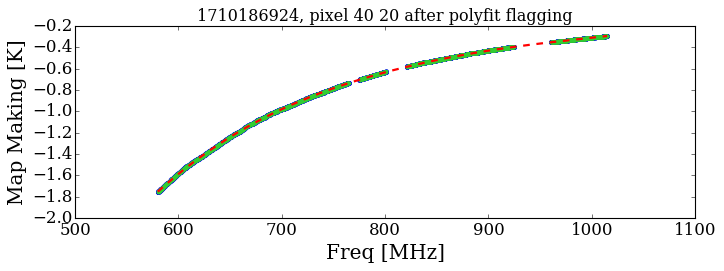

<Figure size 640x480 with 0 Axes>

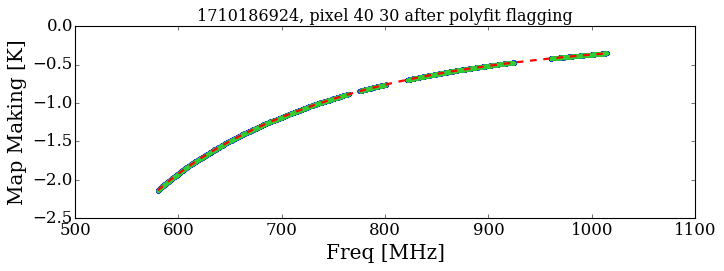

<Figure size 640x480 with 0 Axes>

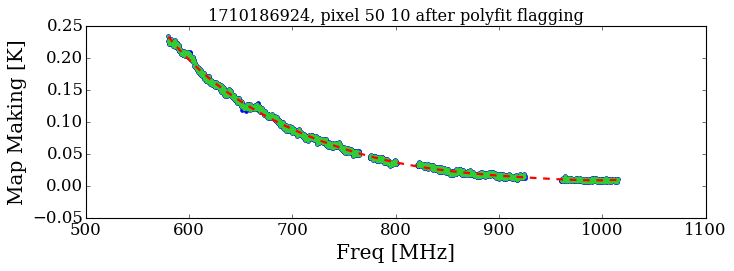

<Figure size 640x480 with 0 Axes>

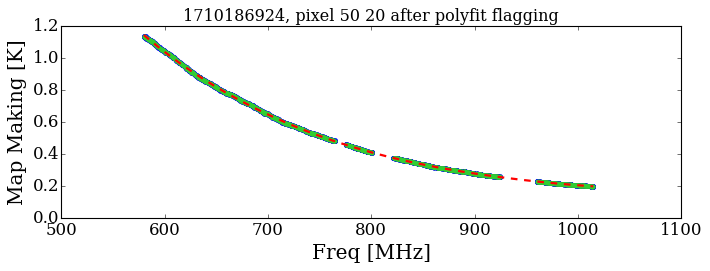

<Figure size 640x480 with 0 Axes>

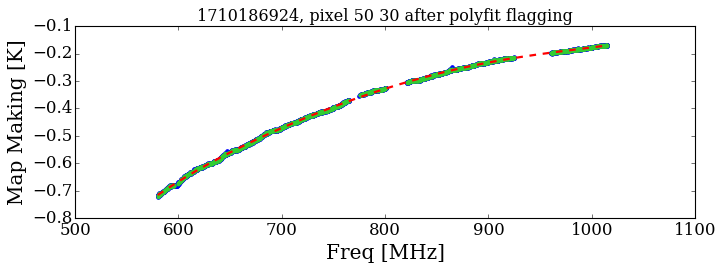

<Figure size 640x480 with 0 Axes>

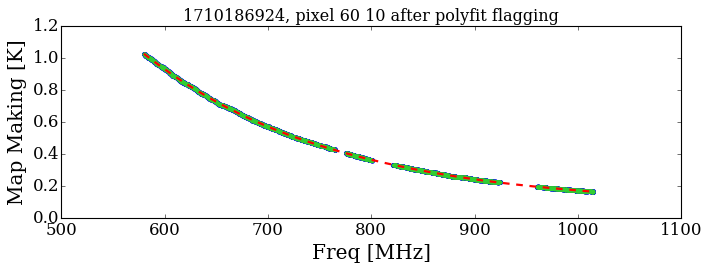

<Figure size 640x480 with 0 Axes>

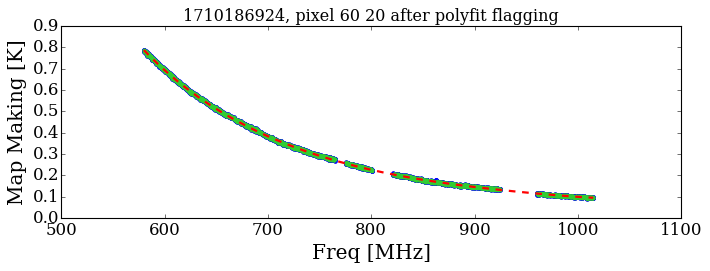

<Figure size 640x480 with 0 Axes>

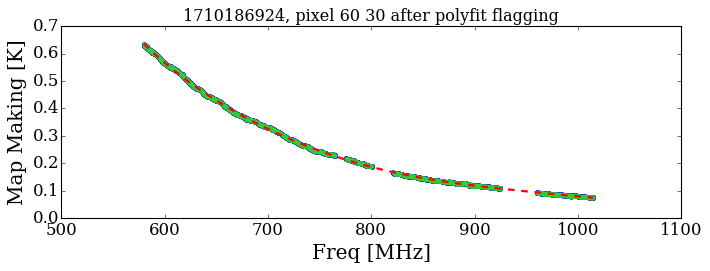

<Figure size 640x480 with 0 Axes>

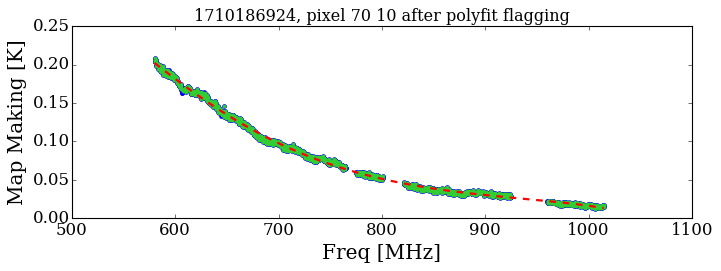

<Figure size 640x480 with 0 Axes>

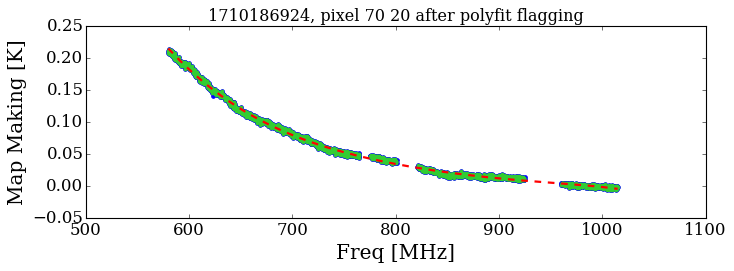

<Figure size 640x480 with 0 Axes>

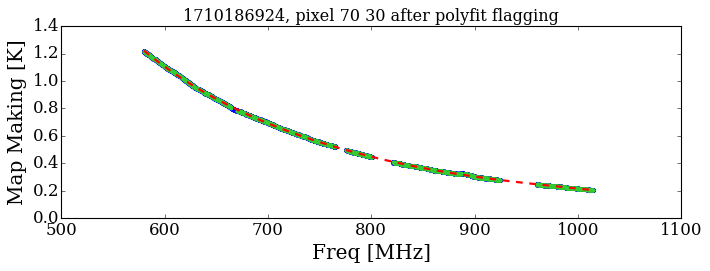

<Figure size 640x480 with 0 Axes>

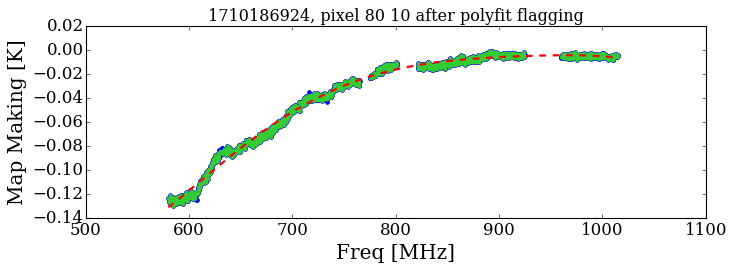

<Figure size 640x480 with 0 Axes>

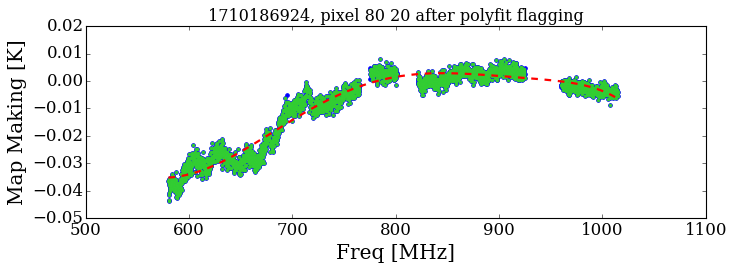

<Figure size 640x480 with 0 Axes>

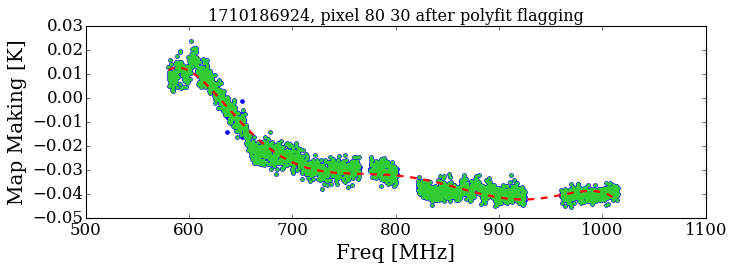

<Figure size 640x480 with 0 Axes>

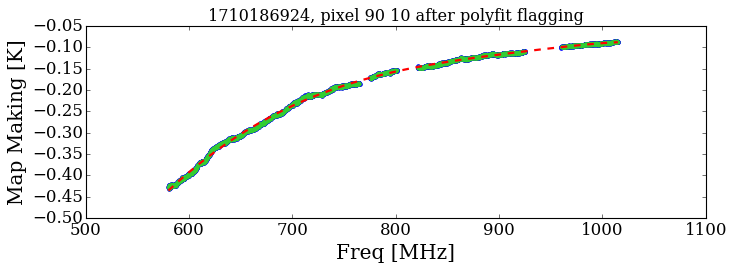

<Figure size 640x480 with 0 Axes>

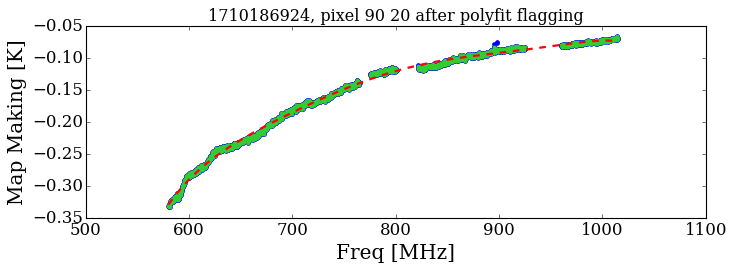

<Figure size 640x480 with 0 Axes>

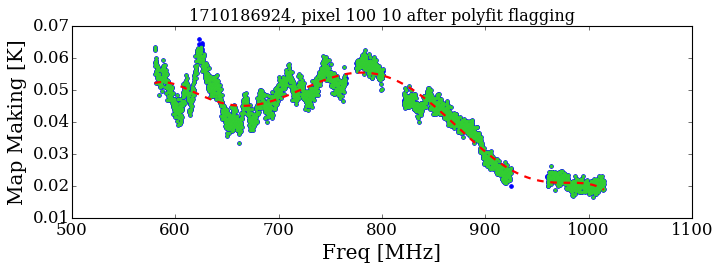

<Figure size 640x480 with 0 Axes>

In [11]:
#  iteratively running the polynomial_flag to flag the outliers

from museek.util.tools import moving_median_masked, gaussian_filter_masked, interpolate_1d_masked_array
from museek.util.tools import remove_outliers_zscore_mad, polynomial_flag_outlier
from scipy import ndimage
import warnings

mask_polyfit = np.ones(map_antennacombine.shape, dtype='bool')

for pixel_i in range(map_antennacombine.shape[0]):
    for pixel_j in range(map_antennacombine.shape[1]):
        if map_antennacombine[pixel_i,pixel_j].mask.all():
            pass
        else:
            with warnings.catch_warnings():
                warnings.simplefilter('ignore', np.RankWarning)
                
                initial_mask, _ = polynomial_flag_outlier(freq, map_antennacombine.data[pixel_i,pixel_j], 
                                                          mask=map_antennacombine[pixel_i,pixel_j].mask, 
                                                          degree=18, threshold=6)
                initial_mask, _ = polynomial_flag_outlier(freq, map_antennacombine.data[pixel_i,pixel_j], 
                                                          mask=initial_mask, 
                                                          degree=10, threshold=6)
                initial_mask, _ = polynomial_flag_outlier(freq, map_antennacombine.data[pixel_i,pixel_j], 
                                                          mask=initial_mask, 
                                                          degree=8, threshold=6.5)
                initial_mask, _ = polynomial_flag_outlier(freq, map_antennacombine.data[pixel_i,pixel_j], 
                                                          mask=initial_mask, 
                                                          degree=6, threshold=6.5)
                initial_mask, _ = polynomial_flag_outlier(freq, map_antennacombine.data[pixel_i,pixel_j], 
                                                          mask=initial_mask, 
                                                          degree=6, threshold=6.5)
                initial_mask, _ = polynomial_flag_outlier(freq, map_antennacombine.data[pixel_i,pixel_j], 
                                                          mask=initial_mask, 
                                                          degree=6, threshold=6.5)
                initial_mask, _ = polynomial_flag_outlier(freq, map_antennacombine.data[pixel_i,pixel_j], 
                                                          mask=initial_mask, 
                                                          degree=6, threshold=6.5)

            ###  mask dilation
            struct = np.ones(3, dtype=bool)
            initial_mask = ndimage.binary_dilation(initial_mask, structure=struct, iterations=2)

            ###    update the mask
            mask_polyfit[pixel_i,pixel_j] = initial_mask

            ####  plotting 
            selected_freq_points = ~initial_mask
            p_fit = np.polyfit(freq[selected_freq_points], map_antennacombine[pixel_i,pixel_j,selected_freq_points], deg=6)
            y_fit = np.polyval(p_fit, freq)
    
            if pixel_i%10==0 and pixel_j%10==0:
                fig = plt.figure(figsize=(10, 3))
                ax = fig.add_subplot(1, 1, 1)
                ax.scatter(freq, map_antennacombine[pixel_i,pixel_j], color='blue', s=10)
                ax.scatter(freq, np.ma.masked_array(map_antennacombine.data[pixel_i,pixel_j], mask=initial_mask), color='limegreen', s=5)
                ax.plot(freq, y_fit, color='red', linestyle='--', lw=2)
                ax.set_xlabel('Freq [MHz]', fontsize=18)
                ax.set_ylabel('Map Making [K]', fontsize=18)
                ax.set_title(block_name+', pixel '+str(pixel_i)+' '+str(pixel_j)+' after polyfit flagging')
                
                plt.show()
                plt.clf()
            else:
                pass
            
        

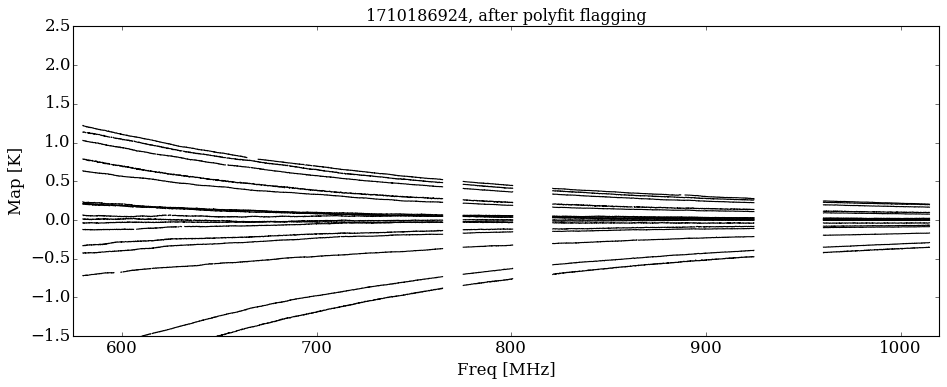

<Figure size 640x480 with 0 Axes>

In [12]:
# checking the spectra after tha polynomial_flag

map_antennacombine_polyfitflag = np.ma.masked_array(map_antennacombine.data, mask=mask_polyfit)
hit_data[mask_polyfit] = 0

fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(1, 1, 1)
for i in range(map_antennacombine_polyfitflag.shape[0])[::10]:
    for j in range(map_antennacombine_polyfitflag.shape[1])[::10]:
       ax.plot(freq, map_antennacombine_polyfitflag[i,j], color='black', lw=1)

ax.set_xlabel('Freq [MHz]', fontsize=15)    
ax.set_ylabel('Map [K]', fontsize=15)
ax.set_xlim(freq.min()-5, freq.max()+5)
ax.set_ylim(-1.5,2.5)
ax.set_title(block_name+', after polyfit flagging')
plt.tight_layout()
plt.show()
plt.clf()


In [14]:
# do second inpainting to fill the regions masked by polynomial_flag

map_antennacombine_polyfitflag_interp = np.ma.ones_like(map_antennacombine_polyfitflag)

# Calculate the expression T[n] + T[n+1] - T[n-1] - T[n+2] for valid indices
delta = (map_antennacombine_polyfitflag[:,:,1:-2] +
         map_antennacombine_polyfitflag[:,:,2:-1] -
         map_antennacombine_polyfitflag[:,:,:-3] -
         map_antennacombine_polyfitflag[:,:,3:]) / 2.

# inpainting
delta_sigma = np.ma.std(delta, axis=2) / np.sqrt(2)
    
for pixel_i in range(map_antennacombine_polyfitflag.shape[0]):
    for pixel_j in range(map_antennacombine_polyfitflag.shape[1]):
        if map_antennacombine_polyfitflag[pixel_i,pixel_j].mask.all():
            pass
        else:
            with warnings.catch_warnings():
                warnings.simplefilter('ignore', np.RankWarning)
                delta_sigma_pixel = delta_sigma[pixel_i,pixel_j]
            
                mask = map_antennacombine_polyfitflag[pixel_i,pixel_j].mask 
                map_antennacombine_polyfitflag_interp.data[pixel_i,pixel_j] = fill_masked_regions_polyfit(                                                                                      
                    freq, 
                    map_antennacombine_polyfitflag[pixel_i,pixel_j], 
                    inpainting_window=inpainting_window, 
                    inpainting_polydeg=inpainting_polydeg,
                )
                map_antennacombine_polyfitflag_interp.mask[pixel_i,pixel_j] = np.zeros(len(freq),dtype='bool') 
                n_mask = np.count_nonzero(mask)
                ###  add white noise to masked regions
                if n_mask > 0:
                    noise = np.random.normal(0.0, delta_sigma_pixel, n_mask)
                    map_antennacombine_polyfitflag_interp.data[pixel_i,pixel_j,mask] += noise


    map_antennacombine_polyfitflag_interp.mask[:,:,mask_freq] = True

    lo = np.ma.min(map_antennacombine_polyfitflag) - 0.5
    hi = np.ma.max(map_antennacombine_polyfitflag) + 0.5
    misfit = (map_antennacombine_polyfitflag_interp <= lo) | (map_antennacombine_polyfitflag_interp >= hi)

    misfit_time = np.sum(misfit, axis=2) > 0
    map_antennacombine_polyfitflag_interp.mask[misfit_time] = True
    hit_data[misfit_time] = 0.
        

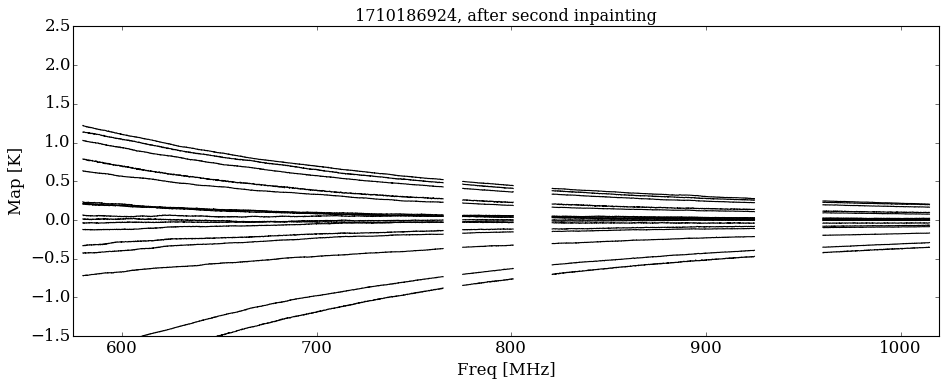

<Figure size 640x480 with 0 Axes>

In [15]:
# check the spectra after the second inpainting 
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(1, 1, 1)
for i in range(map_antennacombine_polyfitflag_interp.shape[0])[::10]:
    for j in range(map_antennacombine_polyfitflag_interp.shape[1])[::10]:
       ax.plot(freq, map_antennacombine_polyfitflag_interp[i,j], color='black', lw=1)

ax.set_xlabel('Freq [MHz]', fontsize=15)    
ax.set_ylabel('Map [K]', fontsize=15)
ax.set_xlim(freq.min()-5, freq.max()+5)
ax.set_ylim(-1.5,2.5)
ax.set_title(block_name+', after second inpainting')
plt.tight_layout()
plt.show()
plt.clf()


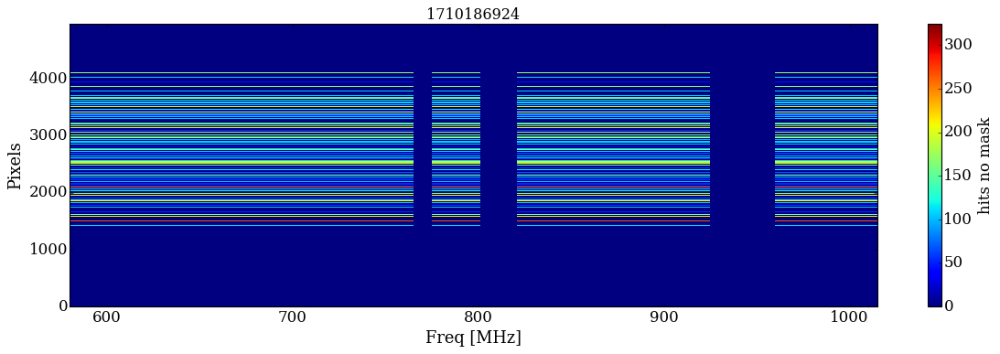

<Figure size 640x480 with 0 Axes>

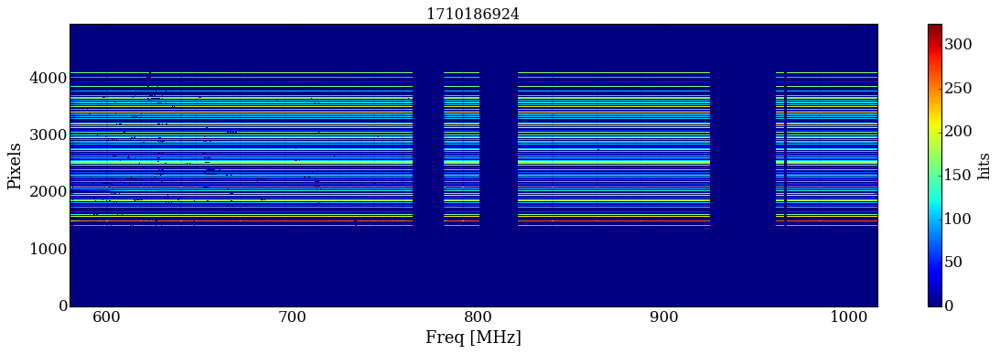

<Figure size 640x480 with 0 Axes>

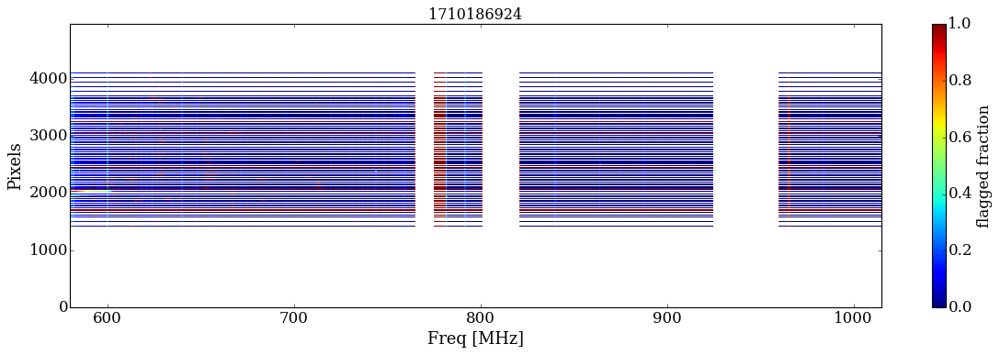

<Figure size 640x480 with 0 Axes>

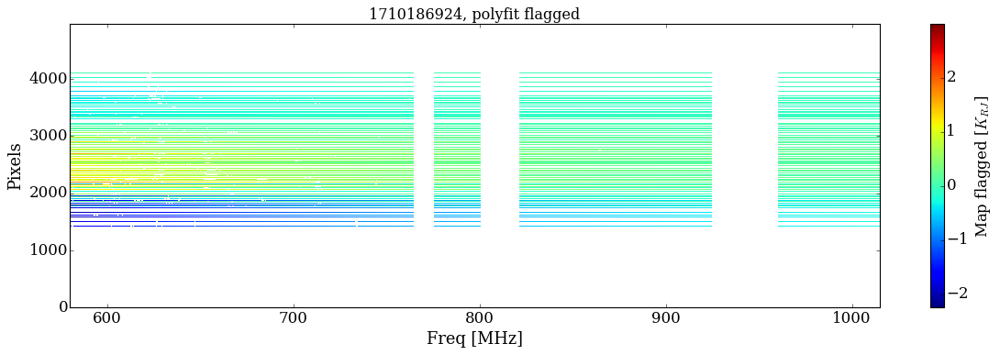

<Figure size 640x480 with 0 Axes>

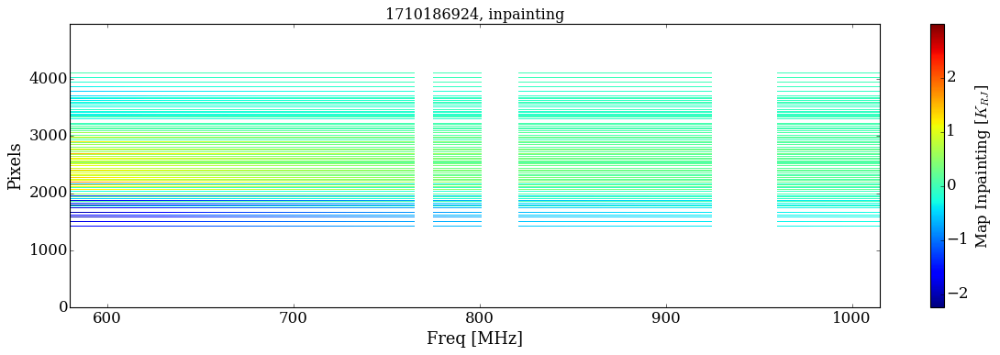

<Figure size 640x480 with 0 Axes>

In [16]:
# check the waterfall plots after the second inpainting 

shape_0 = np.shape(map_antennacombine_polyfitflag_interp)[0]
shape_1 = np.shape(map_antennacombine_polyfitflag_interp)[1]
shape_2 = np.shape(map_antennacombine_polyfitflag_interp)[2]


fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
map1 = ax.pcolormesh(freq, np.arange(shape_0*shape_1), hit_data_nomask.reshape(shape_0*shape_1, shape_2))
ax.set_xlabel('Freq [MHz]', fontsize=16)
ax.set_ylabel('Pixels', fontsize=16)
ax.set_xlim(freq.min(), freq.max())
ax.set_ylim(0, shape_0*shape_1)
ax.set_title(block_name)
cbar_data = plt.colorbar(map1)
cbar_data.set_label('hits no mask', fontsize=15)
plt.tight_layout()
plt.show()
plt.clf()


fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
map1 = ax.pcolormesh(freq, np.arange(shape_0*shape_1), hit_data.reshape(shape_0*shape_1, shape_2))
ax.set_xlabel('Freq [MHz]', fontsize=16)
ax.set_ylabel('Pixels', fontsize=16)
ax.set_xlim(freq.min(), freq.max())
ax.set_ylim(0, shape_0*shape_1)
ax.set_title(block_name)
cbar_data = plt.colorbar(map1)
cbar_data.set_label('hits', fontsize=15)
plt.tight_layout()
plt.show()
plt.clf()

hit_data_nomask_ma = np.ma.masked_array(hit_data_nomask, mask=hit_data_nomask==0)
hit_data_ma = np.ma.masked_array(hit_data, mask=hit_data_nomask==0)
flagged_fraction = (hit_data_nomask_ma - hit_data_ma) / hit_data_nomask_ma
fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
map1 = ax.pcolormesh(freq, np.arange(shape_0*shape_1), flagged_fraction.reshape(shape_0*shape_1, shape_2))
ax.set_xlabel('Freq [MHz]', fontsize=16)
ax.set_ylabel('Pixels', fontsize=16)
ax.set_xlim(freq.min(), freq.max())
ax.set_ylim(0, shape_0*shape_1)
ax.set_title(block_name)
cbar_data = plt.colorbar(map1)
cbar_data.set_label('flagged fraction', fontsize=15)
plt.tight_layout()
plt.show()
plt.clf()

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
map1 = ax.pcolormesh(freq, np.arange(shape_0*shape_1), map_antennacombine_polyfitflag.reshape(shape_0*shape_1, shape_2))
ax.set_xlabel('Freq [MHz]', fontsize=16)
ax.set_ylabel('Pixels', fontsize=16)
ax.set_xlim(freq.min(), freq.max())
ax.set_ylim(0, shape_0*shape_1)
ax.set_title(block_name+', polyfit flagged')
cbar_data = plt.colorbar(map1)
cbar_data.set_label(r'Map flagged [$K_{RJ}$]', fontsize=15)
plt.tight_layout()
plt.show()
plt.clf()

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
map1 = ax.pcolormesh(freq, np.arange(shape_0*shape_1), map_antennacombine_polyfitflag_interp.reshape(shape_0*shape_1, shape_2))
ax.set_xlabel('Freq [MHz]', fontsize=16)
ax.set_ylabel('Pixels', fontsize=16)
ax.set_xlim(freq.min(), freq.max())
ax.set_ylim(0, shape_0*shape_1)
ax.set_title(block_name+', inpainting')
cbar_data = plt.colorbar(map1)
cbar_data.set_label(r'Map Inpainting [$K_{RJ}$]', fontsize=15)
plt.tight_layout()
plt.show()
plt.clf()


In [17]:

# save the map-making results
arrays_dict = {
            'map': map_antennacombine_polyfitflag_interp,
            'hit': hit_data,
            'hit_nomask': hit_data_nomask,
            'wcs': wcs, 
            'freq':freq,
            'antenna_list':antenna_list,
            }

if not os.path.exists(output_path):
    os.makedirs(output_path)
    print(f"Directory '{output_path}' was created.")
else:
    print(f"Directory '{output_path}' already exists.")

with open(output_path+'/map_making_'+BOX+'_'+block_name+map_version'.pkl', 'wb') as f:
    pickle.dump(arrays_dict, f)


'\n# save the map-making results\narrays_dict = {\n            \'map\': map_antennacombine_polyfitflag_interp,\n            \'hit\': hit_data,\n            \'hit_nomask\': hit_data_nomask,\n            \'wcs\': wcs, \n            \'freq\':freq,\n            \'antenna_list\':antenna_list,\n            }\n\nif not os.path.exists(output_path):\n    os.makedirs(output_path)\n    print(f"Directory \'{output_path}\' was created.")\nelse:\n    print(f"Directory \'{output_path}\' already exists.")\n\nwith open(output_path+\'/map_making_\'+BOX+\'_\'+block_name+map_version\'.pkl\', \'wb\') as f:\n    pickle.dump(arrays_dict, f)\n'